In [2]:
import numpy as np
import matplotlib as matlib
import matplotlib.pyplot as plt
from matplotlib import cm
from scipy.stats import multivariate_normal
from scipy.sparse import spdiags
from scipy.sparse import kron
from mpl_toolkits.mplot3d import Axes3D
import time
import random
from sklearn.decomposition import PCA, NMF
import scipy.sparse as sp
import scipy.linalg as linalg
from numpy.random import default_rng
import matplotlib.patches as mpatches
import ot

In [5]:
##define the the mixture of gaussian function 
##it takes k: number of mixtures
##x -- 2d vector, the position in 2d plane
##vec mu k pairs of means
##vec w k-1 weight parameters
def model(x, k, mu, w):
    result = 0;
    for i in range(k-1):
        result = result + w[i]*multivariate_normal.pdf(x, mean=mu[i], cov=[[1, 0], [0, 1]]);
    w_last = 1 - np.sum(w);
    result = result + w_last*multivariate_normal.pdf(x, mean=mu[k-1], cov=[[1, 0], [0, 1]]);
    return result;

#it generates and returns random parameters:
#[k-1 weight paras, k means]
def generate_random_para(k):
    mu_x = 0; mu_y = 0;
    if (k<=90):
        mu_x = np.array(random.sample(range(5, 95), k))/10;
        mu_y = np.array(random.sample(range(5, 95), k))/10;
    else:
        mu_x = np.array(random.sample(range(50, 950), k))/100;
        mu_y = np.array(random.sample(range(50, 950), k))/100;
    means = [];
    for i in range(k):
        means.append(np.array([mu_x[i], mu_y[i]]));
    means = np.array(means);
    weights = [random.randrange(40, 60) for i in range(k)];
    weights = np.array(weights);
    weights = weights/np.sum(weights);
    weights = weights[0:k-1];
    return [means, weights]; 

N = 41;
dx = 5/N; dy = 5/N;
X = [];
for i in range(1, N):
    for j in range(1, N):
        X.append([dx*i, dy*j]);
X = np.array(X);

##another finer and larger discretization used to compite the W2 loss
N2 = 51;
dx = 26/N2; dy = 26/N2;
bounds = [[-11, 15], [-15.5, 10.5]];
Xi = [i for i in np.arange(bounds[0][0]+dx, bounds[0][1]-0.01, dx)];
Yi = [i for i in np.arange(bounds[1][0]+dx, bounds[1][1]-0.01, dy)];
Xi = np.array(Xi); Yi = np.array(Yi);
xv, yv = np.meshgrid(Xi, Yi, sparse=False, indexing ='ij');
X2 = np.zeros((len(Xi)*len(Yi), 2));
X2[:,0] = xv.reshape(len(Xi)*len(Yi), order='F');
X2[:,1] = yv.reshape(len(Xi)*len(Yi), order='F');
costM = ot.dist(X2, X2);

In [6]:
#X is the mesh grid points we want to evaluate at
#mu, w is the current parameters
#ytruth is the truth values
def loss(X, k, mu, w, ytruth):
    ymodel = model(X, k, mu, w);
    error = 0.5*(ytruth-ymodel)**2;
    return np.sum(error);

In [7]:
def expinner(x, mu):
    inner = -0.5*np.einsum("ij, ij->i", x-mu, x-mu);
    return np.exp(inner);  

##it returns the gradient of p w.r.t all the w_i
##returns a matrix of size (N-1)^2*(k-1)
def dpdw(x, mu, w, k):
    result = [];
    for i in range(k-1):
        result.append(multivariate_normal.pdf(x, mean=mu[i], cov=[[1, 0], [0, 1]]));
    result = result - multivariate_normal.pdf(x, mean=mu[k-1], cov=[[1, 0], [0, 1]]);
    result = np.array(result);
    result = np.transpose(result);
    return result;

#the derivative dp/dmu1:
def dpdmu(w, x, mu):
    t1 = expinner(x, mu); t2 = (mu-x);
    return -w*(1/(2*np.pi))*np.multiply(t2, t1[:, np.newaxis]);

#it returns a (N-1)^2 by 3k-1 matrix
def p_grad(X, mu, w, k, N):
    result = np.zeros(((N-1)**2, 3*k-1));
    result[:, 0:k-1] = dpdw(X, mu, w, k);
    for i in range(k-1):
        result[:, 2*i+k-1:2*i+k+1] = dpdmu(w[i], X, mu[i]);
    w_last = 1- np.sum(w);
    result[:, 3*k-3:3*k-1] = dpdmu(w_last, X, mu[k-1]);
    return result;

#it returns a (N-1)^2 by 2k matrix
#which is the gradient w.r.t mus only
def p_grad_mu(X, mu, w, k, N):
    result = np.zeros(((N-1)**2, 2*k));
    for i in range(k-1):
        result[:, 2*i:2*i+2] = dpdmu(w[i], X, mu[i]);
    w_last = 1- np.sum(w);
    result[:, 2*k-2:2*k] = dpdmu(w_last, X, mu[k-1]);
    return result;

#it returns the gradient of p together with the gradient of U
#returns [p_grad, u_grad]
def U_grad(X, mu, w, k, N, ytruth):
    p = model(X, k, mu, w) - ytruth;
    P = p_grad(X, mu, w, k, N);
    Q = p.T @ P;
    return [P, Q];

In [20]:
#discretization

#compute the matrix A that represents the process of taking divergence
#returns a 2*(N-1)**2 by (N-1)**2 matrix
def discretize(N, dx, dy):
    ones = np.ones(N-1);
    diags = np.array([-1, 1]);
    data = [-ones, ones];
    B = spdiags(data, diags, N-1, N-1).toarray();
    I = np.identity(N-1);
    A1 = kron(I, B).toarray()/(2*dx);
    A2 = kron(B, I).toarray()/(2*dy);
    return np.concatenate((A1, A2), axis=0);

##compute the matrix sigma
def sigma(X, N, w, mu, k):
    diagonal = 1/model(X, k, mu, w);
    data = np.array([diagonal]);
    diags = np.array([0]);
    sig = spdiags(data, diags, (N-1)**2, (N-1)**2).toarray();
    return sig;

##compute the matrix big sigma
##that is a concatenation of sigma
def Sigma(X, N, w, mu, k):
    sig = sigma(X, N, w, mu, k);
    I = np.identity(2);
    Sig = kron(I, sig).toarray();
    return Sig;

##compute the matrix C
def Cmatrix(X, N, w, mu, k):
    C = Sigma(X, N, w, mu, k);
    C = 2*C;
    C = np.linalg.inv(C);
    return C;

#it returns a bsr_matrix
def Bmatrix(X, N, w, mu, k, A):
    A = sp.bsr_matrix(A.T);
    diagonal = model(X, k, mu, w)**0.5;
    data = np.array([diagonal]);
    diags = np.array([0]);
    sig = spdiags(data, diags, (N-1)**2, (N-1)**2);
    I = sp.identity(2);
    Pinv = kron(I, sig);
    B = A@Pinv;
    return B;

In [31]:
A = discretize(N, dx, dy);
B = Bmatrix(X, N, np.array([.3]), np.array([[4, 5], [2, 3]]), 2, A);

## GD on 2 mixtures with All 5 Parameters

In [22]:
def quick_sort(numseq, indexseq):
    size = len(numseq);
    if (size<=1):
        return [numseq, indexseq];
    pivot = size//2;
    pivotvalue = numseq.pop(pivot);
    midnum = [pivotvalue];
    midindex = [indexseq.pop(pivot)];
    leftnum = []; rightnum = [];
    leftindex = []; rightindex = [];
    for i in range(size-1):
        if (numseq[i] > pivotvalue):
            leftnum.append(numseq[i]);
            leftindex.append(indexseq[i]);
        else:
            rightnum.append(numseq[i]);
            rightindex.append(indexseq[i]);
    sortednuml, sortedindexl = quick_sort(leftnum, leftindex);
    sortednumr, sortedindexr = quick_sort(rightnum, rightindex);
    return [sortednuml+midnum+sortednumr, sortedindexl+midindex+sortedindexr];

#m is the order of apprximation, the less m is, the quicker the algo 
#but less accurate the return value is
#m must be <= 3k-1
def Natural_dir2(X, N, k, w, mu, ytruth, A, m):
    B = Bmatrix(X, N, w, mu, k, A);
    B = B.toarray();
    q, r= linalg.qr(B.T, mode = 'economic');
    gradp, gradu = U_grad(X, mu, w, k, N, ytruth);
    Z = np.linalg.solve(r.T, -gradp);
    Y = np.matmul(q, Z);
    Q, R = linalg.qr(Y, mode = 'economic')
    diag = abs(np.diagonal(R))
    numseq, indexseq = quick_sort(list(diag), list(range(len(diag))))
    Rtil = R[indexseq[0:m], :]
    Q1, R1 = linalg.qr(Rtil.T, mode = 'economic');
    z = np.linalg.solve(R1, Q1.T @ gradu);
    y = np.linalg.solve(R1.T, z);
    x = Q1 @ y;
    return x;

#it returns both Y and Y.T Y
def Gw2_matrix(X, N, k, w, mu, ytruth, dx, dy):
    A = discretize(N, dx, dy);
    B = Bmatrix(X, N, w, mu, k, A);
    B = B.toarray();
    q, r= linalg.qr(B.T, mode = 'economic');
    gradp, gradu = U_grad(X, mu, w, k, N, ytruth);
    Z = np.linalg.solve(r.T, -gradp);
    Y = np.matmul(q, Z);
    return Y, Y.T@Y;
    

##define 2 functions that transfer parameters from 2 vectors to 1 single vector
def to1(mu, w):
    return np.concatenate((w, mu.flatten()))

def to2(para, k):
    w = para[0:k-1];
    mu = para[k-1:3*k-1];
    return [w, np.reshape(mu, (-1, 2))];

In [23]:
def Natural_GD_test(lr, initial, iteration, k, N, A, ytruth, savepath):
    para = initial;
    w_initial, mu_initial = to2(initial, k);
    trace = [para]; 
    tracevalue = [loss(X, k, mu_initial, w_initial, ytruth)];
    start = time.time();
    for i in range(iteration):
        print(i)
        w, mu = to2(para, k);
        direct = Natural_dir2(X, N, k, w, mu, ytruth, A, 5)
        para = para - lr*direct;
        tracevalue.append(loss(X, k, mu, w, ytruth));
        trace.append(para);
    end = time.time();
    trace = np.array(trace);
    weight_trace = trace[:, 0];
    mu1_trace = trace[:, 1:3];
    mu2_trace = trace[:, 3:5];
    #plot the trace of parameters
    fig, ax = plt.subplots(2, 2, figsize=(7, 7));
    ax[0][0].plot(weight_trace);
    ax[0][1].plot(mu1_trace[:, 0], mu1_trace[:, 1], label='mu1 trace');
    ax[0][1].plot(mu2_trace[:, 0], mu2_trace[:, 1], label = 'mu2 trace');
    ax[0][1].plot(1, 3, 'ro', label = 'mu1 truth', c = 'blue');
    ax[0][1].plot(3, 2, 'ro', label = 'mu2 truth', c = 'orange');
    ax[0][1].legend();
    ax[1][0].plot(tracevalue);
    ax[1][1].semilogy(tracevalue);
    ax[0][0].set_title("Trace of Weight");
    ax[0][1].set_title("Trace of mu1 and mu2 in 2d");
    ax[1][0].set_title("Loss value");
    ax[1][1].set_title("Semilogy of Loss value");
    ax[0][0].set_xlabel("Iteration");
    ax[0][0].set_ylabel("Weight Value");
    ax[0][1].set_xlabel("x direction");
    ax[0][1].set_ylabel("y direction");
    ax[1][0].set_xlabel("Iteration");
    ax[1][0].set_ylabel("Loss");
    ax[1][1].set_xlabel("Iteration");
    ax[1][1].set_ylabel("Loss");
    fig.tight_layout();
    print("Initial parameter values:");
    print("Weight: {}  mu1:[{}, {}]  mu2:[{}, {}]".format(initial[0], initial[1], initial[2], 
                                                     initial[3], initial[4]))
    print("Optimized parameter values:");
    print("Weight: {}  mu1:[{}, {}]  mu2:[{}, {}]".format(round(para[0], 2), round(para[1], 2), round(para[2], 2), 
                                                     round(para[3], 2), round(para[4], 2)));
    print("Time for {} steps is {} seconds".format(iteration, end-start));
    print("Average time for each step is {} seconds".format((end-start)/iteration));
    lo = tracevalue[-1];
    print("The loss is {}.".format(lo));
    plt.savefig(savepath, dpi=300);
    
def std_GD_test(lr, initial, iteration, k, N, A, ytruth, savepath):
    para = initial;
    w_initial, mu_initial = to2(initial, k);
    trace = [para];
    tracevalue = [loss(X, k, mu_initial, w_initial, ytruth)];
    start = time.time();
    for i in range(iteration):
        w, mu = to2(para, k);
        P, direct = U_grad(X, mu, w, k, N, ytruth);
        para = para - lr*direct;
        tracevalue.append(loss(X, k, mu, w, ytruth));
        trace.append(para);
    end = time.time();
    trace = np.array(trace);
    weight_trace = trace[:, 0];
    mu1_trace = trace[:, 1:3];
    mu2_trace = trace[:, 3:5];
    #plot the trace of parameters
    fig, ax = plt.subplots(2, 2, figsize=(7, 7));
    ax[0][0].plot(weight_trace);
    ax[0][1].plot(mu1_trace[:, 0], mu1_trace[:, 1], label='mu1 trace');
    ax[0][1].plot(mu2_trace[:, 0], mu2_trace[:, 1], label = 'mu2 trace');
    ax[0][1].plot(1, 3, 'ro', label = 'mu1 truth', c = 'blue');
    ax[0][1].plot(3, 2, 'ro', label = 'mu2 truth', c = 'orange');
    ax[0][1].legend();
    ax[1][0].plot(tracevalue);
    ax[1][1].semilogy(tracevalue);
    ax[0][0].set_title("Trace of Weight");
    ax[0][1].set_title("Trace of mu1 and mu2 in 2d");
    ax[1][0].set_title("Loss value");
    ax[1][1].set_title("Semilogy of Loss value");
    ax[0][0].set_xlabel("Iteration");
    ax[0][0].set_ylabel("Weight Value");
    ax[0][1].set_xlabel("x direction");
    ax[0][1].set_ylabel("y direction");
    ax[1][0].set_xlabel("Iteration");
    ax[1][0].set_ylabel("Loss");
    ax[1][1].set_xlabel("Iteration");
    ax[1][1].set_ylabel("Loss");
    fig.tight_layout();
    print("Initial parameter values:");
    print("Weight: {}  mu1:[{}, {}]  mu2:[{}, {}]".format(initial[0], initial[1], initial[2], 
                                                     initial[3], initial[4]))
    print("Optimized parameter values:");
    print("Weight: {}  mu1:[{}, {}]  mu2:[{}, {}]".format(round(para[0], 2), round(para[1], 2), round(para[2], 2), 
                                                     round(para[3], 2), round(para[4], 2)));
    print("Time for {} steps is {} seconds".format(iteration, end-start));
    print("Average time for each step is {} seconds".format((end-start)/iteration));
    lo = tracevalue[-1];
    print("The loss is {}.".format(lo));
    plt.savefig(savepath, dpi=300)

#### Implement L2 Natural Gradient Descent Algo
$$U(\rho(\vec{\theta})) = \frac{1}{2}|| \rho(\vec{\theta})-y^* ||^2_{L_2}$$

$$d_{\rho}U(\rho(\vec{\theta})) = \rho(\vec{\theta}) - y^*$$

In [24]:
def dUdrho(x, k, mu, w, ytruth):
    result = model(x, k, mu, w) - ytruth;
    return result;

We want to solve for:
$$J_{\rho}\eta = -d_{\rho}U(\rho(\vec{\theta}))$$
Where
$$J_{\rho} = d_{\vec{\theta}}\rho$$
Option 1: full rank solution for $\eta$

Do a qr factorization on $J_{\rho}$:
$$J_{\rho} = QR$$
$$R\eta = -Q^Td_{\rho}U(\rho(\vec{\theta}))$$
then solve for $\eta$ directly

In [25]:
##calculate the l2 natural gd direction without any reduction
def l2_Natural_dirFull(X, mu, w, k, N, ytruth):
    J= p_grad(X, mu, w, k, N)
    q, r= linalg.qr(J, mode = 'economic');
    drhoU = dUdrho(X, k, mu, w, ytruth);
    return np.linalg.solve(r, -q.T @ drhoU);

def l2_Natural_GD_test(lr, initial, iteration, k, N, A, ytruth, savepath):
    para = initial;
    w_initial, mu_initial = to2(initial, k);
    trace = [para]; 
    tracevalue = [loss(X, k, mu_initial, w_initial, ytruth)];
    start = time.time();
    for i in range(iteration):
        w, mu = to2(para, k);
        direct = l2_Natural_dirFull(X, mu, w, k, N, ytruth);
        para = para + lr*direct;
        tracevalue.append(loss(X, k, mu, w, ytruth));
        trace.append(para);
    end = time.time();
    trace = np.array(trace);
    weight_trace = trace[:, 0];
    mu1_trace = trace[:, 1:3];
    mu2_trace = trace[:, 3:5];
    #plot the trace of parameters
    fig, ax = plt.subplots(2, 2, figsize=(7, 7));
    ax[0][0].plot(weight_trace);
    ax[0][1].plot(mu1_trace[:, 0], mu1_trace[:, 1], label='mu1 trace');
    ax[0][1].plot(mu2_trace[:, 0], mu2_trace[:, 1], label = 'mu2 trace');
    ax[0][1].plot(1, 3, 'ro', label = 'mu1 truth', c = 'blue');
    ax[0][1].plot(3, 2, 'ro', label = 'mu2 truth', c = 'orange');
    ax[0][1].legend();
    ax[1][0].plot(tracevalue);
    ax[1][1].semilogy(tracevalue);
    ax[0][0].set_title("Trace of Weight");
    ax[0][1].set_title("Trace of mu1 and mu2 in 2d");
    ax[1][0].set_title("Loss value");
    ax[1][1].set_title("Semilogy of Loss value");
    ax[0][0].set_xlabel("Iteration");
    ax[0][0].set_ylabel("Weight Value");
    ax[0][1].set_xlabel("x direction");
    ax[0][1].set_ylabel("y direction");
    ax[1][0].set_xlabel("Iteration");
    ax[1][0].set_ylabel("Loss");
    ax[1][1].set_xlabel("Iteration");
    ax[1][1].set_ylabel("Loss");
    fig.tight_layout();
    print("Initial parameter values:");
    print("Weight: {}  mu1:[{}, {}]  mu2:[{}, {}]".format(initial[0], initial[1], initial[2], 
                                                     initial[3], initial[4]))
    print("Optimized parameter values:");
    print("Weight: {}  mu1:[{}, {}]  mu2:[{}, {}]".format(round(para[0], 2), round(para[1], 2), round(para[2], 2), 
                                                     round(para[3], 2), round(para[4], 2)));
    print("Time for {} steps is {} seconds".format(iteration, end-start));
    print("Average time for each step is {} seconds".format((end-start)/iteration));
    lo = tracevalue[-1];
    print("The loss is {}.".format(lo));
    plt.savefig(savepath, dpi=300);

In [26]:
k = 2;
A = discretize(71, dx, dy);
w_true = np.array([0.3]);
mu_true = np.array([[1, 3], [3, 2]]);
ytruth = model(X, k, mu_true, w_true);
initial = np.array([0.8, 4, 4, 4, 3]);
w_initial, mu_initial = to2(initial, 2)

Initial parameter values:
Weight: 0.8  mu1:[4.0, 4.0]  mu2:[4.0, 3.0]
Optimized parameter values:
Weight: 0.2  mu1:[5.53, 5.73]  mu2:[2.69, 2.15]
Time for 2000 steps is 4.0585081577301025 seconds
Average time for each step is 0.002029254078865051 seconds
The loss is 0.07532757683743731.


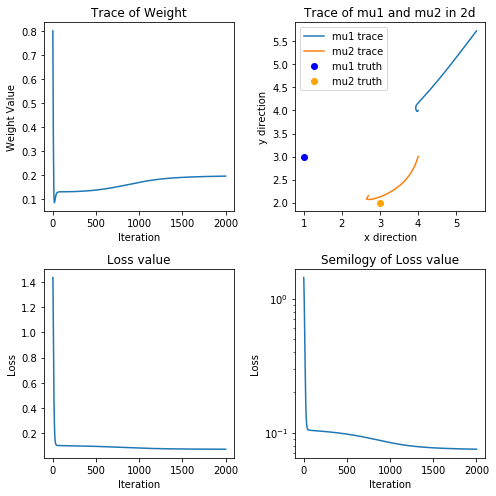

In [83]:
##initial = [0.8, 4, 4, 4, 3]
##std GD converges to local minimum
std_GD_test(0.1, np.array([0.8, 4, 4, 4, 3]), 2000, 2, 31, A, ytruth, "/Users/leiwanzhou/Desktop/l2_mix_5para/std-d8-4443-d1")

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060


3500
3501
3502
3503
3504
3505
3506
3507
3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699


5139
5140
5141
5142
5143
5144
5145
5146
5147
5148
5149
5150
5151
5152
5153
5154
5155
5156
5157
5158
5159
5160
5161
5162
5163
5164
5165
5166
5167
5168
5169
5170
5171
5172
5173
5174
5175
5176
5177
5178
5179
5180
5181
5182
5183
5184
5185
5186
5187
5188
5189
5190
5191
5192
5193
5194
5195
5196
5197
5198
5199
5200
5201
5202
5203
5204
5205
5206
5207
5208
5209
5210
5211
5212
5213
5214
5215
5216
5217
5218
5219
5220
5221
5222
5223
5224
5225
5226
5227
5228
5229
5230
5231
5232
5233
5234
5235
5236
5237
5238
5239
5240
5241
5242
5243
5244
5245
5246
5247
5248
5249
5250
5251
5252
5253
5254
5255
5256
5257
5258
5259
5260
5261
5262
5263
5264
5265
5266
5267
5268
5269
5270
5271
5272
5273
5274
5275
5276
5277
5278
5279
5280
5281
5282
5283
5284
5285
5286
5287
5288
5289
5290
5291
5292
5293
5294
5295
5296
5297
5298
5299
5300
5301
5302
5303
5304
5305
5306
5307
5308
5309
5310
5311
5312
5313
5314
5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
5338


6778
6779
6780
6781
6782
6783
6784
6785
6786
6787
6788
6789
6790
6791
6792
6793
6794
6795
6796
6797
6798
6799
6800
6801
6802
6803
6804
6805
6806
6807
6808
6809
6810
6811
6812
6813
6814
6815
6816
6817
6818
6819
6820
6821
6822
6823
6824
6825
6826
6827
6828
6829
6830
6831
6832
6833
6834
6835
6836
6837
6838
6839
6840
6841
6842
6843
6844
6845
6846
6847
6848
6849
6850
6851
6852
6853
6854
6855
6856
6857
6858
6859
6860
6861
6862
6863
6864
6865
6866
6867
6868
6869
6870
6871
6872
6873
6874
6875
6876
6877
6878
6879
6880
6881
6882
6883
6884
6885
6886
6887
6888
6889
6890
6891
6892
6893
6894
6895
6896
6897
6898
6899
6900
6901
6902
6903
6904
6905
6906
6907
6908
6909
6910
6911
6912
6913
6914
6915
6916
6917
6918
6919
6920
6921
6922
6923
6924
6925
6926
6927
6928
6929
6930
6931
6932
6933
6934
6935
6936
6937
6938
6939
6940
6941
6942
6943
6944
6945
6946
6947
6948
6949
6950
6951
6952
6953
6954
6955
6956
6957
6958
6959
6960
6961
6962
6963
6964
6965
6966
6967
6968
6969
6970
6971
6972
6973
6974
6975
6976
6977


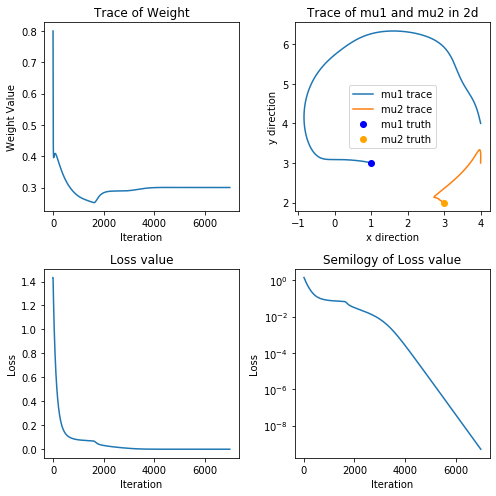

In [94]:
##Natural Gradient Descent converges to absolute truth slowly
##initial = [0.8, 4, 4, 4, 3]
Natural_GD_test(0.1, np.array([0.8, 4, 4, 4, 3]), 7000, k, 31, A, ytruth, "/Users/leiwanzhou/Desktop/l2_mix_5para/nat-d8-4443-d1")

Initial parameter values:
Weight: 0.8  mu1:[4.0, 4.0]  mu2:[4.0, 3.0]
Optimized parameter values:
Weight: 0.7  mu1:[3.0, 2.0]  mu2:[1.0, 3.0]
Time for 300 steps is 0.41420412063598633 seconds
Average time for each step is 0.0013806804021199543 seconds
The loss is 5.3967086661954855e-17.


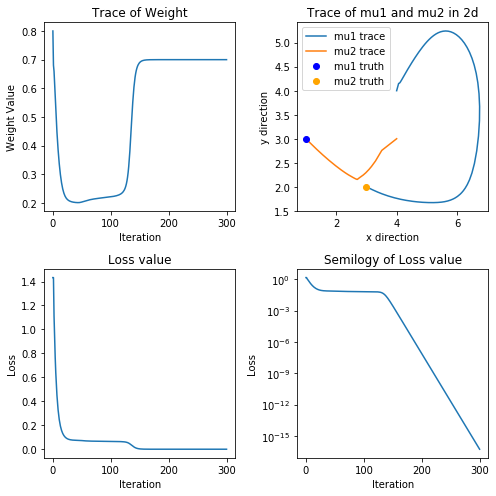

In [78]:
##initial = [0.8, 4, 4, 4, 3]
##l2 natural GD converges to global minimum quickly (in 300 iterations)
l2_Natural_GD_test(.1, np.array([0.8, 4, 4, 4, 3]), 300, 2, 31, A, ytruth, "/Users/leiwanzhou/Desktop/l2_mix_5para/l2-d8-4443-d1")

Initial parameter values:
Weight: 0.5  mu1:[1.0, 3.0]  mu2:[0.0, 0.0]
Optimized parameter values:
Weight: 0.81  mu1:[2.71, 2.16]  mu2:[-0.4, -0.35]
Time for 400 steps is 0.5131421089172363 seconds
Average time for each step is 0.001282855272293091 seconds
The loss is 0.0764668252458312.


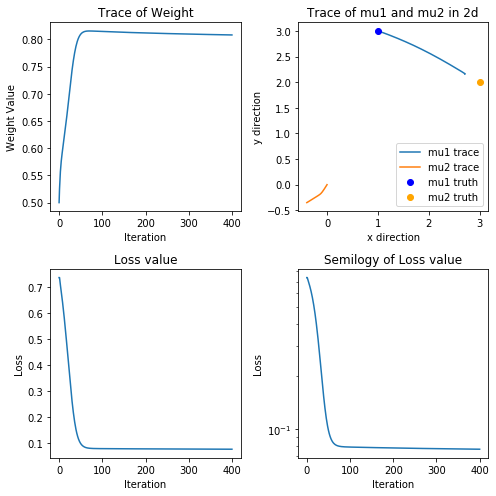

In [91]:
##initial = [0.5, 1, 3, 0, 0]
##std GD converges to local minimum
std_GD_test(.1, np.array([0.5, 1, 3, 0, 0]), 400, 2, 31, A, ytruth, "/Users/leiwanzhou/Desktop/l2_mix_5para/std-d5-1300-d1")

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060


3500
3501
3502
3503
3504
3505
3506
3507
3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699


5139
5140
5141
5142
5143
5144
5145
5146
5147
5148
5149
5150
5151
5152
5153
5154
5155
5156
5157
5158
5159
5160
5161
5162
5163
5164
5165
5166
5167
5168
5169
5170
5171
5172
5173
5174
5175
5176
5177
5178
5179
5180
5181
5182
5183
5184
5185
5186
5187
5188
5189
5190
5191
5192
5193
5194
5195
5196
5197
5198
5199
5200
5201
5202
5203
5204
5205
5206
5207
5208
5209
5210
5211
5212
5213
5214
5215
5216
5217
5218
5219
5220
5221
5222
5223
5224
5225
5226
5227
5228
5229
5230
5231
5232
5233
5234
5235
5236
5237
5238
5239
5240
5241
5242
5243
5244
5245
5246
5247
5248
5249
5250
5251
5252
5253
5254
5255
5256
5257
5258
5259
5260
5261
5262
5263
5264
5265
5266
5267
5268
5269
5270
5271
5272
5273
5274
5275
5276
5277
5278
5279
5280
5281
5282
5283
5284
5285
5286
5287
5288
5289
5290
5291
5292
5293
5294
5295
5296
5297
5298
5299
5300
5301
5302
5303
5304
5305
5306
5307
5308
5309
5310
5311
5312
5313
5314
5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
5338


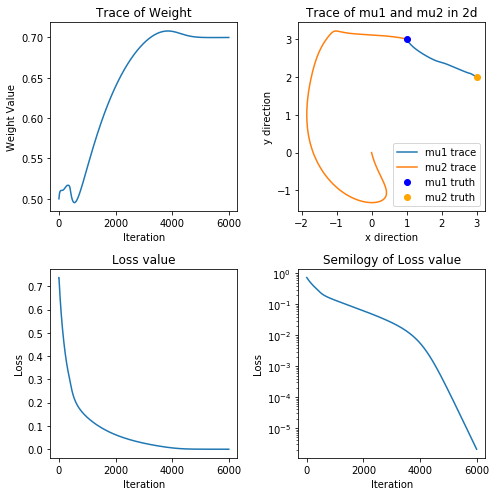

In [95]:
##initial = [0.5, 1, 3, 0, 0]
##natural GD converges to absolute truth
Natural_GD_test(.1, np.array([0.5, 1, 3, 0, 0]), 6000, 2, 31, A, ytruth, "/Users/leiwanzhou/Desktop/l2_mix_5para/nat-d5-1300-d1")

Initial parameter values:
Weight: 0.5  mu1:[1.0, 3.0]  mu2:[0.0, 0.0]
Optimized parameter values:
Weight: 0.7  mu1:[3.0, 2.0]  mu2:[1.0, 3.0]
Time for 400 steps is 0.5781350135803223 seconds
Average time for each step is 0.0014453375339508058 seconds
The loss is 1.7623695621564066e-30.


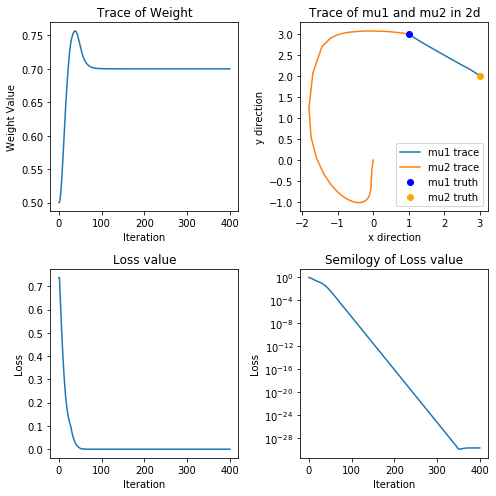

In [88]:
##initial = [0.5, 1, 3, 0, 0]
##l2 natural GD converges to absolute truth quickly in 200 iterations
l2_Natural_GD_test(.1, np.array([0.5, 1, 3, 0, 0]), 400, 2, 31, A, ytruth, "/Users/leiwanzhou/Desktop/l2_mix_5para/l2-d5-1300-d1")

Initial parameter values:
Weight: 0.5  mu1:[4.0, 1.5]  mu2:[0.0, 0.0]
Optimized parameter values:
Weight: 0.81  mu1:[2.71, 2.16]  mu2:[-0.39, -0.16]
Time for 400 steps is 0.45157909393310547 seconds
Average time for each step is 0.0011289477348327636 seconds
The loss is 0.07721825898015042.


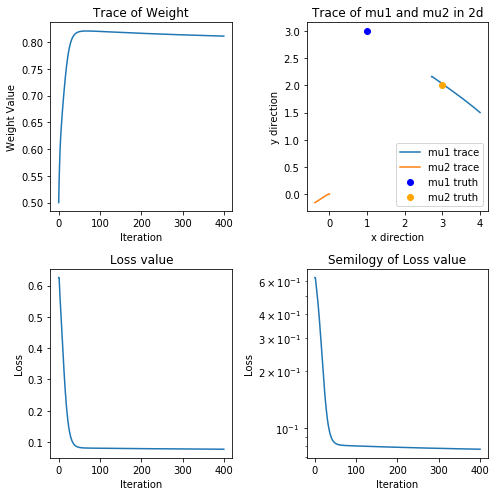

In [97]:
##initial para = [0.5, 4, 1.5, 0, 0]
##std GD converges to local minimum
std_GD_test(.1, np.array([0.5, 4, 1.5, 0, 0]), 400, 2, 31, A, ytruth, "/Users/leiwanzhou/Desktop/l2_mix_5para/std-d5-d541d500-d1" )

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061


3501
3502
3503
3504
3505
3506
3507
3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700


5140
5141
5142
5143
5144
5145
5146
5147
5148
5149
5150
5151
5152
5153
5154
5155
5156
5157
5158
5159
5160
5161
5162
5163
5164
5165
5166
5167
5168
5169
5170
5171
5172
5173
5174
5175
5176
5177
5178
5179
5180
5181
5182
5183
5184
5185
5186
5187
5188
5189
5190
5191
5192
5193
5194
5195
5196
5197
5198
5199
5200
5201
5202
5203
5204
5205
5206
5207
5208
5209
5210
5211
5212
5213
5214
5215
5216
5217
5218
5219
5220
5221
5222
5223
5224
5225
5226
5227
5228
5229
5230
5231
5232
5233
5234
5235
5236
5237
5238
5239
5240
5241
5242
5243
5244
5245
5246
5247
5248
5249
5250
5251
5252
5253
5254
5255
5256
5257
5258
5259
5260
5261
5262
5263
5264
5265
5266
5267
5268
5269
5270
5271
5272
5273
5274
5275
5276
5277
5278
5279
5280
5281
5282
5283
5284
5285
5286
5287
5288
5289
5290
5291
5292
5293
5294
5295
5296
5297
5298
5299
5300
5301
5302
5303
5304
5305
5306
5307
5308
5309
5310
5311
5312
5313
5314
5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
5338
5339


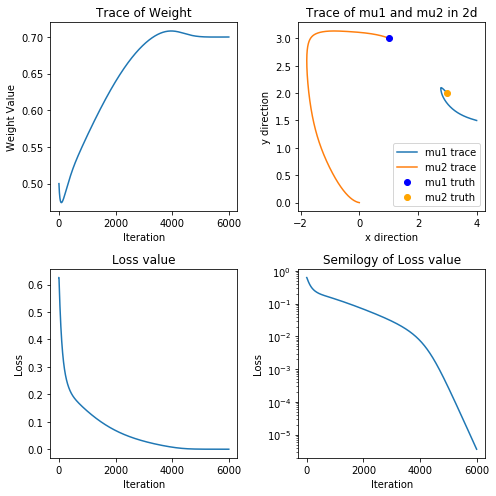

In [103]:
##initial para = [0.5, 4, 1.5, 0, 0]
##Natural GD converges to global minimun
Natural_GD_test(.1, np.array([0.5, 4, 1.5, 0, 0]), 6000, 2, 31, A, ytruth, "/Users/leiwanzhou/Desktop/l2_mix_5para/nat-d5-d541d500-d1")

Initial parameter values:
Weight: 0.5  mu1:[4.0, 1.5]  mu2:[0.0, 0.0]
Optimized parameter values:
Weight: 0.7  mu1:[3.0, 2.0]  mu2:[1.0, 3.0]
Time for 400 steps is 0.5539529323577881 seconds
Average time for each step is 0.0013848823308944703 seconds
The loss is 2.365214399096376e-30.


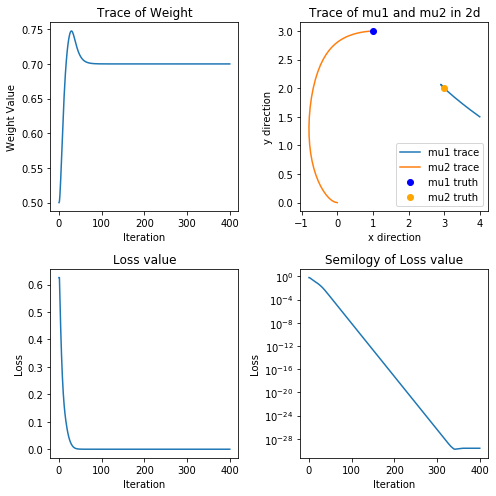

In [102]:
##initial para = [0.5, 4, 1.5, 0, 0]
##l2 Natural GD converges to global minimun quickly in 30 iterations
l2_Natural_GD_test(.1, np.array([0.5, 4, 1.5, 0, 0]), 400, 2, 31, A, ytruth, "/Users/leiwanzhou/Desktop/l2_mix_5para/l2-d5-d541d500-d1")

## GD on 2 mixture with one mean to be the parameters

In [27]:
#the derivative dp/dmu1:
def dpdmu1(w, x, mu1):
    t1 = expinner(x, mu1); t2 = (mu1-x);
    return -w*(1/(2*np.pi))*np.multiply(t2, t1[:, np.newaxis]);
    
#the derivative dp/dmu2:
def dpdmu2(w, x, mu2):
    t1 = expinner(x, mu2); t2 = (mu2-x);
    return (w-1)*(1/(2*np.pi))*np.multiply(t2, t1[:, np.newaxis]);

##this function returns the gradient of p and U w.r.t mu1 only
def gradient_mu1_all(X, w, mu1, mu2, ytruth):
    p = model(X, 2, np.array([mu1, mu2]), np.array([w])) - ytruth;
    dpmu1 = dpdmu1(w, X, mu1);
    Q = np.sum(np.multiply(dpmu1, p[:, np.newaxis]), axis=0);
    return [dpmu1, Q];

##this function returns the gradient of p and U w.r.t mu2 only
def gradient_mu2_all(X, w, mu1, mu2, ytruth):
    p = model(X, 2, np.array([mu1, mu2]), np.array([w])) - ytruth;
    dpmu2 = dpdmu2(w, X, mu2);
    Q = np.sum(np.multiply(dpmu2, p[:, np.newaxis]), axis=0);
    return [dpmu2, Q];

In [32]:
B.shape

(1600, 3200)

In [33]:
#m is the order of apprximation, the less m is, the quicker the algo 
#but less accurate the return value is
#m must be <= 3k-1
def Natural_dir_mu1(X, N, w, mu, ytruth, A, m):
    B = Bmatrix(X, N, w, mu, 2, A);
    B = B.toarray();
    q, r= linalg.qr(B.T, mode = 'economic');
    gradp, gradu = gradient_mu1_all(X, w[0], mu[0], mu[1], ytruth);
    Z = np.linalg.solve(r.T, -gradp);
    Y = np.matmul(q, Z);
    Q, R = linalg.qr(Y, mode = 'economic')
    diag = abs(np.diagonal(R))
    numseq, indexseq = quick_sort(list(diag), list(range(len(diag))))
    Rtil = R[indexseq[0:m], :]
    Q1, R1 = linalg.qr(Rtil.T, mode = 'economic');
    z = np.linalg.solve(R1, Q1.T @ gradu);
    y = np.linalg.solve(R1.T, z);
    x = Q1 @ y;
    return x;

def Natural2_dir_mu1(X, N, w, mu, ytruth, A):
    s = time.time();
    B = Bmatrix(X, N, w, mu, 2, A);
    B = B.toarray();
    q, r= linalg.qr(B.T, mode = 'economic');
    gradp, gradu = gradient_mu1_all(X, w[0], mu[0], mu[1], ytruth);
    Z = np.linalg.solve(r.T, -gradp);
    Y = np.matmul(q, Z);
    e = time.time();
    print("time to compute Y {}".format(e-s));
    Gw2inv = np.linalg.inv(Y.T@Y);
    w2_dir = Gw2inv@(gradient_mu1_all(X, w, mu[0], mu[1], ytruth)[1]);
    return w2_dir;

#m is the order of apprximation, the less m is, the quicker the algo 
#but less accurate the return value is
#m must be <= 3k-1
def Natural_dir_mu2(X, N, w, mu, ytruth, A, m):
    B = Bmatrix(X, N, w, mu, 2, A);
    B = B.toarray();
    q, r= linalg.qr(B.T, mode = 'economic');
    gradp, gradu = gradient_mu2_all(X, w[0], mu[0], mu[1], ytruth);
    Z = np.linalg.solve(r.T, -gradp);
    Y = np.matmul(q, Z);
    Q, R = linalg.qr(Y, mode = 'economic')
    diag = abs(np.diagonal(R))
    numseq, indexseq = quick_sort(list(diag), list(range(len(diag))))
    Rtil = R[indexseq[0:m], :]
    Q1, R1 = linalg.qr(Rtil.T, mode = 'economic');
    z = np.linalg.solve(R1, Q1.T @ gradu);
    y = np.linalg.solve(R1.T, z);
    x = Q1 @ y;
    return x;

##calculate the l2 natural gd direction without any reduction
##w is an array of weights, mu is an array of means
def l2_Natural_dirFull_mu1(X, mu, w, N, ytruth):
    J = dpdmu1(w[0], X, mu[0]);
    q, r= linalg.qr(J, mode = 'economic');
    drhoU = dUdrho(X, 2, mu, w, ytruth);
    return np.linalg.solve(r, -q.T @ drhoU);

##calculate the l2 natural gd direction without any reduction
##w is an array of weights, mu is an array of means
def l2_Natural_dirFull_mu2(X, mu, w, N, ytruth):
    J = dpdmu2(w[0], X, mu[1]);
    q, r= linalg.qr(J, mode = 'economic');
    drhoU = dUdrho(X, 2, mu, w, ytruth);
    return np.linalg.solve(r, -q.T @ drhoU);

In [34]:
J = dpdmu2(.3, X, np.array([5, 6]))
q, r= linalg.qr(J, mode = 'economic');
drhoU = dUdrho(X, 2, np.array([[1, 3], [1, 3]]), np.array([.3]), ytruth);
l2 = np.linalg.solve(r, -q.T @ drhoU);
print(l2);

[ 0.08383816 -0.18804004]


In [35]:
def cosine(v1, v2):
    return (v1.T @ v2)/(np.linalg.norm(v1)*np.linalg.norm(v2));

std = gradient_mu2_all(X, .3, np.array([1, 3]), np.array([1, 3]), ytruth)[1]
print(std);
print(cosine(std, l2))

[-0.44832366  0.35884424]
-0.8886498680810166


In [36]:
(np.linalg.inv(J.T @ J)@J.T).shape
l2= (np.linalg.inv(J.T @ J)@J.T)@(-drhoU)
print(l2)

[ 0.08383816 -0.18804004]


In [37]:
J.T @ J

array([[0.0435945 , 0.06741804],
       [0.06741804, 0.15924166]])

In [38]:
##constant grid
##this is the grid that is used to plot the loss function 
grid = 0.2;

##it plots the loss function with fixed w, mu2
##it also plots the convergence history of mu1 given the trace and tracevalue paras
def plot_loss_mu1(X, w, mu2, grid, xrange, yrange, trace, tracevalue, ytruth, savepath1, savepath2):
    x = np.arange(xrange[0],xrange[1],grid);
    y = np.arange(yrange[0],yrange[1],grid);
    P,Q = np.meshgrid(x,y)
    Z = np.zeros((x.size, y.size));
    for i in range(x.size):
        for j in range(y.size):
            Z[i, j] = loss(X, 2, np.array([np.array([grid*i+xrange[0], grid*j+yrange[0]]), mu2]), np.array([w]), ytruth);
    fig = plt.figure(figsize=(12, 8));
    axes = fig.gca(projection ='3d');
    axes.view_init(elev=50, azim=10);
    axes.plot(trace[:,1], trace[:,0], tracevalue, '*-', c = 'red')
    axes.plot_surface(P, Q, Z, alpha = 0.8);
    print(trace.shape);
    print(tracevalue.shape);
    plt.show();
    fig, ax = plt.subplots(figsize=(7, 7));
    level = np.arange(0, .3, 0.015);
    CS = ax.contour(Q,P,Z,levels = level);
    ax.clabel(CS, inline=True, fontsize=10);
    ax.plot(trace[:, 0], trace[:, 1], "*-", c='red');
    ax.set_title('Loss Function w.r.t mu1')
    plt.savefig(savepath1, dpi=300);
    fig, ax = plt.subplots(1, 2, figsize=(8, 4));
    ax[0].plot(tracevalue, label = 'the loss value');
    ax[1].semilogy(tracevalue, label = 'semilogy loss value')
    ax[0].legend();
    ax[1].legend();
    ax[0].set_xlabel("number of iteration")
    ax[1].set_xlabel("number of iteration")
    ax[0].set_ylabel("Loss value")
    fig.suptitle('Loss along the Trace');
    plt.savefig(savepath2, dpi=300);
    
def plot_loss_mu2(X, w, mu1, grid, xrange, yrange, trace, tracevalue, ytruth, savepath1, savepath2):
    x = np.arange(xrange[0],xrange[1],grid);
    y = np.arange(yrange[0],yrange[1],grid);
    P,Q = np.meshgrid(x,y)
    Z = np.zeros((x.size, y.size));
    for i in range(x.size):
        for j in range(y.size):
            Z[i, j] = loss(X, 2, np.array([mu1, np.array([grid*i+xrange[0], grid*j+yrange[0]])]), 
                          np.array([w]), ytruth);
    fig = plt.figure(figsize=(12, 8));
    axes = fig.gca(projection ='3d');
    axes.view_init(elev=50, azim=10);
    axes.scatter(trace[:,1], trace[:,0], tracevalue, '*-' ,c = 'red')
    axes.plot_surface(P, Q, Z, alpha = 0.8);
    print(trace.shape);
    print(tracevalue.shape);
    plt.show();
    fig, ax = plt.subplots(figsize=(7, 7));
    level = np.arange(0, 1.2, 0.05);
    CS = ax.contour(Q,P,Z,levels = level);
    ax.clabel(CS, inline=True, fontsize=10);
    ax.plot(trace[:, 0], trace[:, 1], "*-", c='red');
    ax.set_title('Loss Function w.r.t mu2')
    plt.savefig(savepath1, dpi=300);
    fig, ax = plt.subplots(1, 2, figsize=(8, 4));
    ax[0].plot(tracevalue, label = 'the loss value');
    ax[1].semilogy(tracevalue, label = 'semilogy loss value')
    ax[0].legend();
    ax[1].legend();
    ax[0].set_xlabel("number of iteration")
    ax[1].set_xlabel("number of iteration")
    ax[0].set_ylabel("Loss value")
    fig.suptitle('Loss along the Trace');
    plt.savefig(savepath2, dpi=300);

In [39]:
##natural gradient descent on mu1 only with fixed w and mu2
def Natural_GD_mu1(X, w, mu2, lr, initial, iteration, plotrange, ytruth, savepath1, savepath2):
    para = initial; trace = [para]; tracevalue = [loss(X, 2, np.array([para, mu2]), np.array([w]), ytruth)];
    start = time.time();
    for i in range(iteration):
        print(i)
        direct = Natural_dir_mu1(X, N, np.array([w]), np.array([para, mu2]), ytruth, A, 2);
        para = para - lr*direct;
        trace.append(para);
        tracevalue.append(loss(X, 2, np.array([para, mu2]), np.array([w]), ytruth));
    end = time.time();
    trace = np.array(trace); tracevalue = np.array(tracevalue);
    plot_loss_mu1(X, w, mu2, grid, plotrange[0], plotrange[1],trace, tracevalue, ytruth, savepath1, savepath2);
    print("Initial parameter values:");
    print("mu1:[{},{}] ".format(initial[0], initial[1]))
    print("Optimized parameter values:");
    print("mu1:[{}, {}] ".format(round(para[0], 2), round(para[1], 2)));
    print("Time for {} steps is {} seconds.".format(iteration, end-start));
    print("The average time for each step is {} seconds.".format((end-start)/iteration));
    return [trace, tracevalue];
    
##natural gradient descent on mu2 only with fixed w and mu1
def Natural_GD_mu2(X, w, mu1, lr, initial, iteration, plotrange, ytruth, savepath1, savepath2):
    para = initial; trace = [para]; tracevalue = [loss(X, 2, np.array([mu1, para]), np.array([w]), ytruth)];
    start = time.time();
    for i in range(iteration):
        print(i)
        direct = Natural_dir_mu2(X, N, np.array([w]), np.array([mu1, para]), ytruth, A, 2);
        para = para - lr*direct;
        trace.append(para);
        tracevalue.append(loss(X, 2, np.array([mu1, para]), np.array([w]), ytruth));
    end = time.time();
    trace = np.array(trace); tracevalue = np.array(tracevalue);
    plot_loss_mu2(X, w, mu1, grid, plotrange[0], plotrange[1], trace, tracevalue, ytruth, savepath1, savepath2);
    print("Initial parameter values:");
    print("mu2:[{},{}] ".format(initial[0], initial[1]))
    print("Optimized parameter values:");
    print("mu2:[{}, {}] ".format(round(para[0], 2), round(para[1], 2)));
    print("Time for {} steps is {} seconds.".format(iteration, end-start));
    print("The average time for each step is {} seconds.".format((end-start)/iteration));
    return [trace, tracevalue];
    
##std gradient descent on mu1 only with fixed w and mu2
def std_GD_mu1(X, w, mu2, lr, initial, iteration, plotrange, ytruth, savepath1, savepath2):
    para = initial; trace = [para]; tracevalue = [loss(X, 2, np.array([para, mu2]), np.array([w]), ytruth)];
    start = time.time();
    for i in range(iteration):
        p, direct = gradient_mu1_all(X, w, para, mu2, ytruth)
        para = para - lr*direct;
        trace.append(para);
        tracevalue.append(loss(X, 2, np.array([para, mu2]), np.array([w]), ytruth));
    end = time.time();
    trace = np.array(trace); tracevalue = np.array(tracevalue);
    plot_loss_mu1(X, w, mu2, grid, plotrange[0], plotrange[1],trace, tracevalue, ytruth, savepath1, savepath2);
    print("Initial parameter values:");
    print("mu1:[{},{}] ".format(initial[0], initial[1]))
    print("Optimized parameter values:");
    print("mu1:[{}, {}] ".format(round(para[0], 2), round(para[1], 2)));
    print("Time for {} steps is {} seconds.".format(iteration, end-start));
    print("The average time for each step is {} seconds.".format((end-start)/iteration));
    return [trace, tracevalue];
    
##std gradient descent on mu1 only with fixed w and mu2
def std_GD_mu2(X, w, mu1, lr, initial, iteration, plotrange, ytruth, savepath1, savepath2):
    para = initial; trace = [para]; tracevalue = [loss(X, 2, np.array([mu1, para]), np.array([w]), ytruth)];
    start = time.time();
    for i in range(iteration):
        p, direct = gradient_mu2_all(X, w, mu1, para, ytruth)
        para = para - lr*direct;
        trace.append(para);
        tracevalue.append(loss(X, 2, np.array([mu1, para]), np.array([w]), ytruth));
    end = time.time();
    trace = np.array(trace); tracevalue = np.array(tracevalue);
    plot_loss_mu2(X, w, mu1, grid, plotrange[0], plotrange[1],trace, tracevalue, ytruth, savepath1, savepath2);
    print("Initial parameter values:");
    print("mu1:[{},{}] ".format(initial[0], initial[1]))
    print("Optimized parameter values:");
    print("mu1:[{}, {}] ".format(round(para[0], 2), round(para[1], 2)));
    print("Time for {} steps is {} seconds.".format(iteration, end-start));
    print("The average time for each step is {} seconds.".format((end-start)/iteration));
    return [trace, tracevalue];
    
##l2 natural gradient descent on mu1 only with fixed w and mu2
def l2_Natural_GD_mu1(X, w, mu2, lr, initial, iteration, plotrange, ytruth, savepath1, savepath2):
    para = initial; trace = [para]; tracevalue = [loss(X, 2, np.array([para, mu2]), np.array([w]), ytruth)];
    start = time.time();
    for i in range(iteration):
        direct = l2_Natural_dirFull_mu1(X, np.array([para, mu2]), np.array([w]), 31, ytruth);
        para = para + lr*direct;
        trace.append(para);
        tracevalue.append(loss(X, 2, np.array([para, mu2]), np.array([w]), ytruth));
    end = time.time();
    trace = np.array(trace); tracevalue = np.array(tracevalue);
    plot_loss_mu1(X, w, mu2, grid, plotrange[0], plotrange[1],trace, tracevalue, ytruth, savepath1, savepath2);
    print("Initial parameter values:");
    print("mu1:[{},{}] ".format(initial[0], initial[1]))
    print("Optimized parameter values:");
    print("mu1:[{}, {}] ".format(round(para[0], 2), round(para[1], 2)));
    print("Time for {} steps is {} seconds.".format(iteration, end-start));
    print("The average time for each step is {} seconds.".format((end-start)/iteration));
    return [trace, tracevalue];

##l2 natural gradient descent on mu1 only with fixed w and mu1
def l2_Natural_GD_mu2(X, w, mu1, lr, initial, iteration, plotrange, ytruth, savepath1, savepath2):
    para = initial; trace = [para]; tracevalue = [loss(X, 2, np.array([mu1, para]), np.array([w]), ytruth)];
    start = time.time();
    for i in range(iteration):
        direct = l2_Natural_dirFull_mu2(X, np.array([mu1, para]), np.array([w]), 31, ytruth);
        para = para + lr*direct;
        trace.append(para);
        tracevalue.append(loss(X, 2, np.array([mu1, para]), np.array([w]), ytruth));
    end = time.time();
    trace = np.array(trace); tracevalue = np.array(tracevalue);
    plot_loss_mu2(X, w, mu1, grid, plotrange[0], plotrange[1],trace, tracevalue, ytruth, savepath1, savepath2);
    print("Initial parameter values:");
    print("mu2:[{},{}] ".format(initial[0], initial[1]))
    print("Optimized parameter values:");
    print("mu2:[{}, {}] ".format(round(para[0], 2), round(para[1], 2)));
    print("Time for {} steps is {} seconds.".format(iteration, end-start));
    print("The average time for each step is {} seconds.".format((end-start)/iteration));
    return [trace, tracevalue];

In [40]:
##this function compute three distances of the trace
##argument trace is the array of mu1 
##argument fix_mu2 is the fixed mu2
##argument fix_w is the fixed weight 
def compute_length_mu1(X, N, A, trace, fix_mu2, fix_w):
    stdlength = 0; w2length = 0; l2length = 0;
    for i in range(len(trace)-1):
        print(i);
        theta_diff = trace[i+1] - trace[i];
        B = Bmatrix(X, 31, np.array(fix_w), np.array([trace[i+1], fix_mu2]), 2, A);
        B = B.toarray();
        q, r= linalg.qr(B.T, mode = 'economic');
        gradp = dpdmu1(np.array(fix_w), X, trace[i+1]);
        Z = np.linalg.solve(r.T, -gradp);
        Y = np.matmul(q, Z);
        stdlength+=np.linalg.norm(theta_diff, 2);
        w2length+=np.linalg.norm(Y@theta_diff, 2);
        l2length+=np.linalg.norm(gradp@theta_diff, 2);
    return [stdlength, w2length, l2length];

def compute_length_mu2(X, N, A, trace, fix_mu1, fix_w):
    stdlength = 0; w2length = 0; l2length = 0;
    for i in range(len(trace)-1):
        print(i);
        theta_diff = trace[i+1] - trace[i];
        B = Bmatrix(X, 31, np.array(fix_w), np.array([fix_mu1, trace[i+1]]), 2, A);
        B = B.toarray();
        q, r= linalg.qr(B.T, mode = 'economic');
        gradp = dpdmu2(np.array(fix_w), X, trace[i+1]);
        Z = np.linalg.solve(r.T, -gradp);
        Y = np.matmul(q, Z);
        stdlength+=np.linalg.norm(theta_diff, 2);
        w2length+=np.linalg.norm(Y@theta_diff, 2);
        l2length+=np.linalg.norm(gradp@theta_diff, 2);
    return [stdlength, w2length, l2length];

## Test on mu1 only First

In [41]:
prange = np.array([[-1.5, 6.5], [-1.5, 6.5]]);

(701, 2)
(701,)


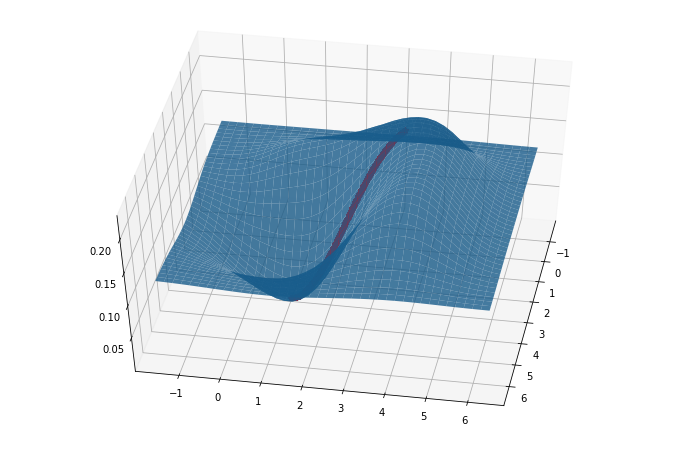

Initial parameter values:
mu1:[3.5,1.5] 
Optimized parameter values:
mu1:[1.01, 3.0] 
Time for 700 steps is 0.524482250213623 seconds.
The average time for each step is 0.0007492603574480329 seconds.


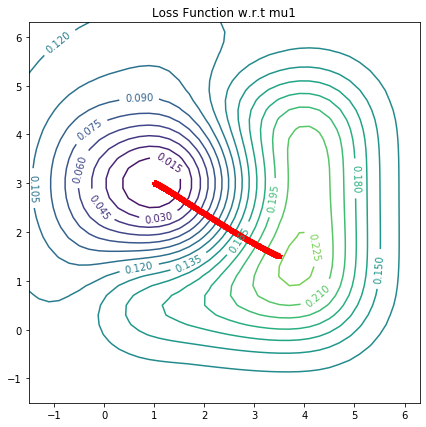

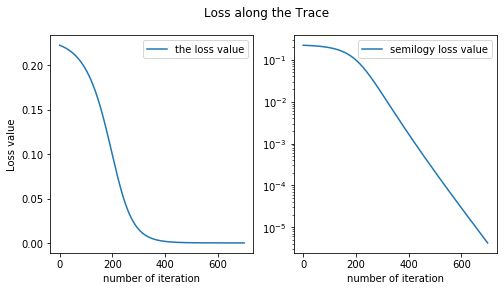

In [103]:
##initial mu1 [3.5, 1.5]
prange = np.array([[-1.5, 6.5], [-1.5, 6.5]]);
savepath1 = "/Users/leiwanzhou/Desktop/l2_mix_4para/std-mu1-d3-323d51d5-d1-trace"
savepath2 = "/Users/leiwanzhou/Desktop/l2_mix_4para/std-mu1-d3-323d51d5-d1-contour"
std_GD_mu1(X, 0.3, np.array([3, 2]), .1, np.array([3.5, 1.5]), 700, prange, ytruth, savepath1, savepath2);

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
(2001, 2)
(2001,)


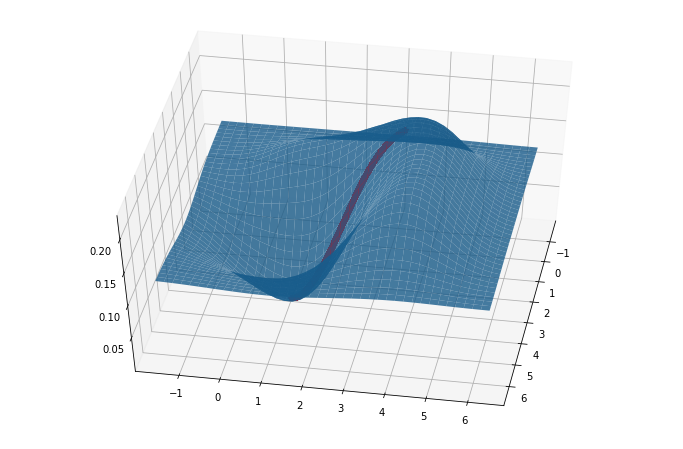

Initial parameter values:
mu1:[3.5,1.5] 
Optimized parameter values:
mu1:[1.02, 2.99] 
Time for 2000 steps is 312.056697845459 seconds.
The average time for each step is 0.1560283489227295 seconds.


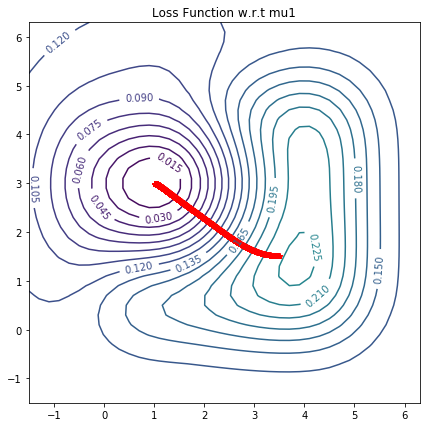

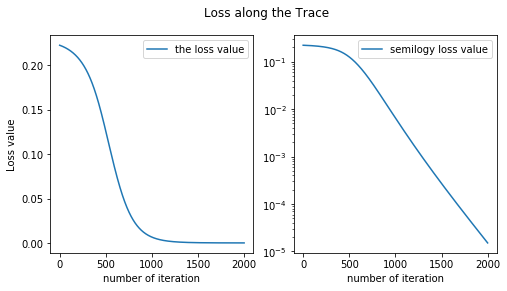

In [131]:
##initial mu1 [3.5, 1.5] 
##Wasserstein nat GD converges to global minimum slowly in 2000 iterations
savepath1 = "/Users/leiwanzhou/Desktop/l2_mix_4para/nat-mu1-d3-323d51d5-d1-trace"
savepath2 = "/Users/leiwanzhou/Desktop/l2_mix_4para/nat-mu1-d3-323d51d5-d1-contour"
Natural_GD_mu1(X, 0.3, np.array([3, 2]), .1, np.array([3.5, 1.5]), 2000, prange, ytruth, savepath1, savepath2);

(201, 2)
(201,)


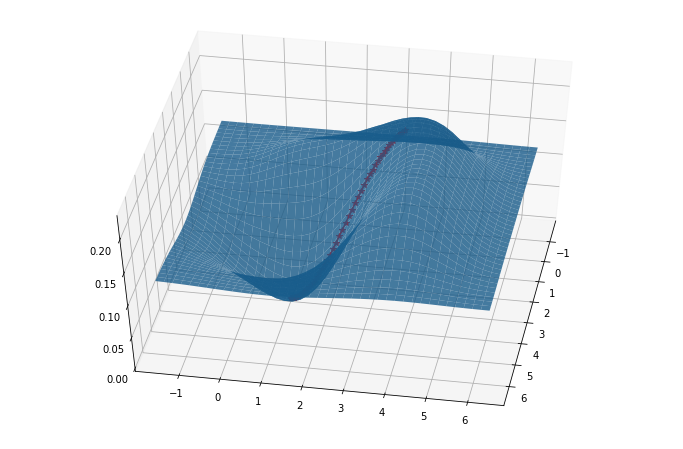

Initial parameter values:
mu1:[3.5,1.5] 
Optimized parameter values:
mu1:[1.0, 3.0] 
Time for 200 steps is 0.230072021484375 seconds.
The average time for each step is 0.001150360107421875 seconds.


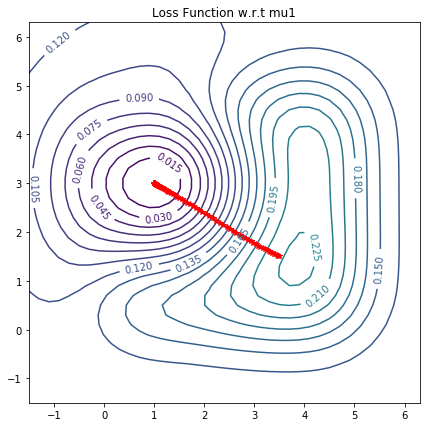

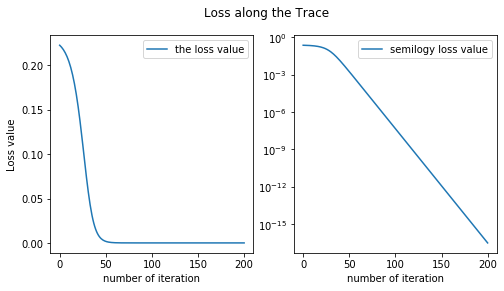

In [128]:
##initial mu1 [3.5, 1.5]
savepath1 = "/Users/leiwanzhou/Desktop/l2_mix_4para/l2-mu1-d3-323d51d5-d1-trace"
savepath2 = "/Users/leiwanzhou/Desktop/l2_mix_4para/l2-mu1-d3-323d51d5-d1-contour"
l2_Natural_GD_mu1(X, 0.3, np.array([3, 2]), .1, np.array([3.5, 1.5]), 200, prange, ytruth, savepath1, savepath2);

In [4]:
import numpy as np;
A = np.array([[5, 6], [7, 8]]);
Ainv = np.array([[-4, 3], [7/2, -5/2]]);
A@Ainv

array([[1., 0.],
       [0., 1.]])

(701, 2)
(701,)


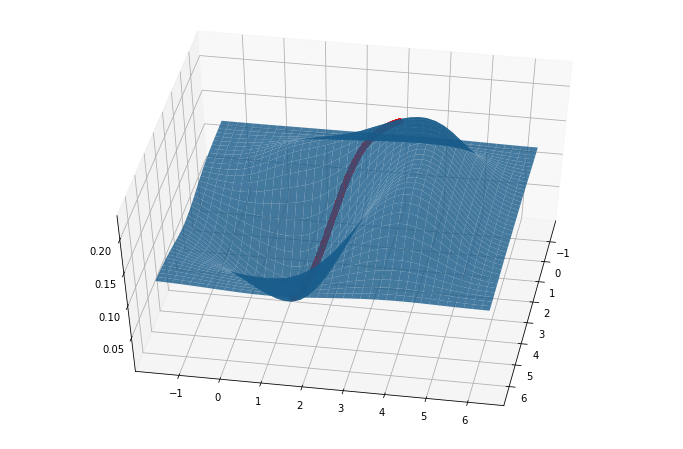

Initial parameter values:
mu1:[3.3,1.0] 
Optimized parameter values:
mu1:[1.02, 2.99] 
Time for 700 steps is 0.5128920078277588 seconds.
The average time for each step is 0.0007327028683253697 seconds.


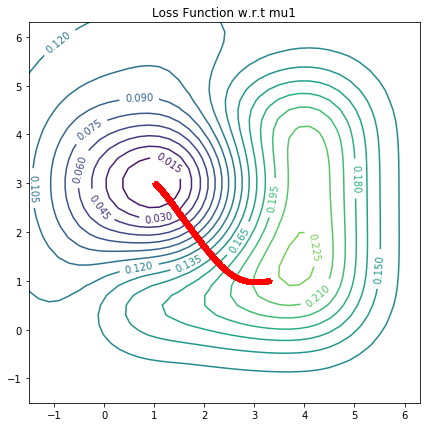

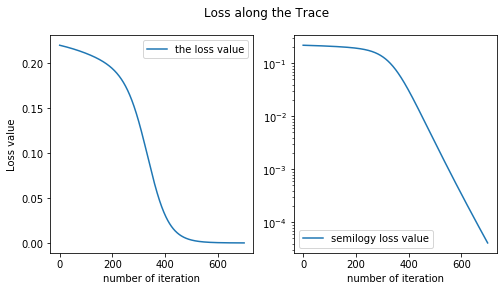

In [51]:
##initial d3 3d3132
#std GD
savepath1 = "/Users/leiwanzhou/Desktop/l2_mix_4para/std-mu1-d3-3d332-d1-trace"
savepath2 = "/Users/leiwanzhou/Desktop/l2_mix_4para/std-mu1-d3-3d332-d1-contour"
stdGD_mu1_3d51d232,_ = std_GD_mu1(X, 0.3, np.array([3, 2]), .1, np.array([3.3, 1]), 700, prange, ytruth, savepath1, savepath2);

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
(2001, 2)
(2001,)


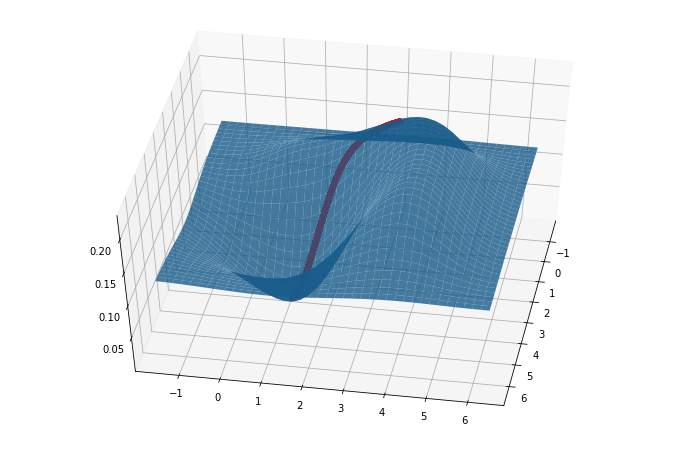

Initial parameter values:
mu1:[3.3,1.0] 
Optimized parameter values:
mu1:[1.02, 2.99] 
Time for 2000 steps is 288.4474289417267 seconds.
The average time for each step is 0.14422371447086335 seconds.


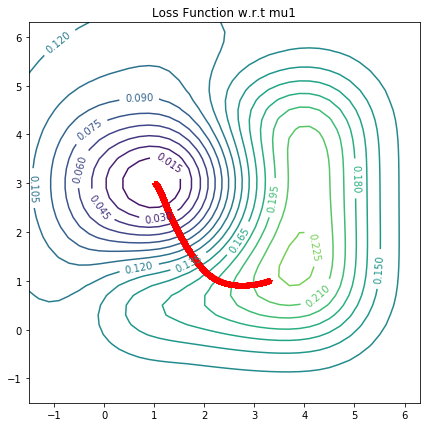

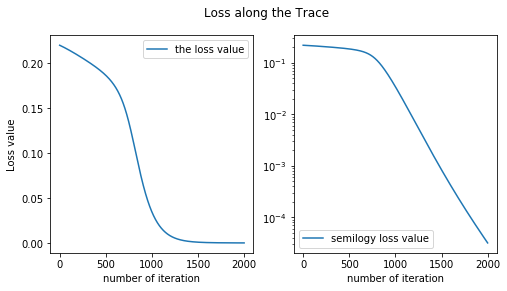

In [53]:
##initial d3 3d3132
#w2 Ntl GD
savepath1 = "/Users/leiwanzhou/Desktop/l2_mix_4para/nat-mu1-d3-3d3132-d1-trace"
savepath2 = "/Users/leiwanzhou/Desktop/l2_mix_4para/nat-mu1-d3-3d3132-d1-contour"
natGD_mu1_3d51d232,_ = Natural_GD_mu1(X, 0.3, np.array([3, 2]), .1, np.array([3.3, 1]), 2000, prange, ytruth, savepath1, savepath2);

(201, 2)
(201,)


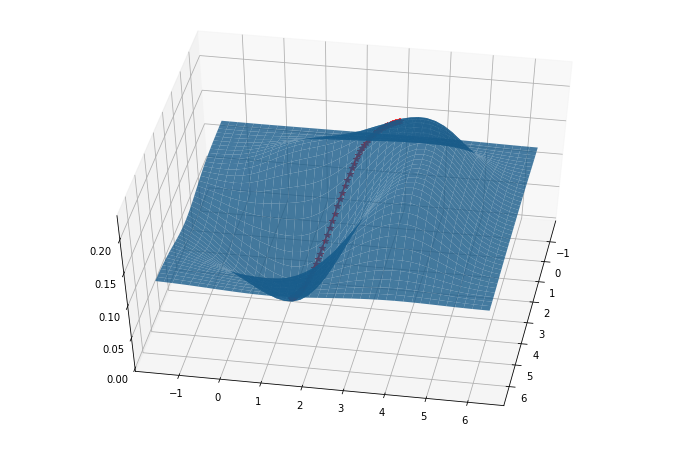

Initial parameter values:
mu1:[3.3,1.0] 
Optimized parameter values:
mu1:[1.0, 3.0] 
Time for 200 steps is 0.18242788314819336 seconds.
The average time for each step is 0.0009121394157409668 seconds.


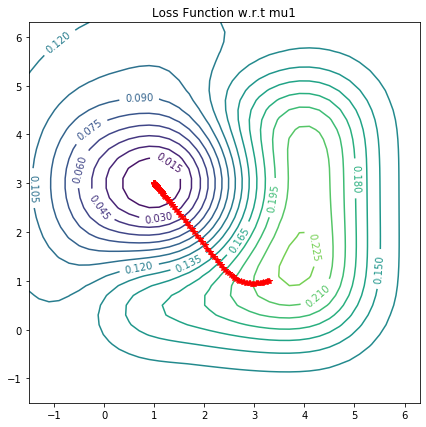

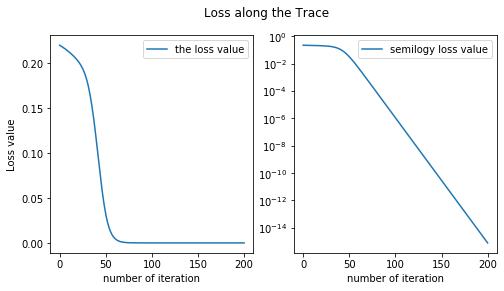

In [54]:
##initial d3 3d3132
#l2 Ntl GD
savepath1 = "/Users/leiwanzhou/Desktop/l2_mix_4para/l2-mu1-d3-3d3132-d1-trace"
savepath2 = "/Users/leiwanzhou/Desktop/l2_mix_4para/l2-mu1-d3-3d3132-d1-contour"
l2GD_mu1_3d51d232,_ = l2_Natural_GD_mu1(X, 0.3, np.array([3, 2]), .1, np.array([3.3, 1]), 200, prange, ytruth, savepath1, savepath2);

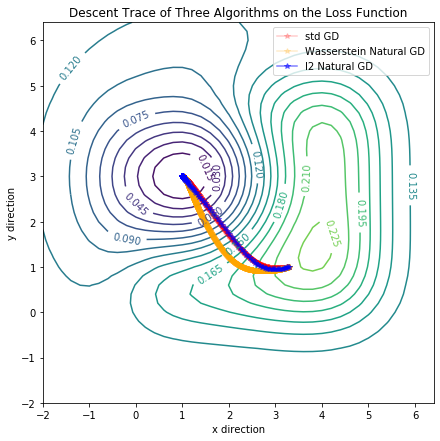

In [55]:
##Plot the three traces togther in one picture
savepath = "/Users/leiwanzhou/Desktop/l2_mix_4para/mu1stdnatl2-init-d3-3d3132-d1-together"
xrange = [-2, 6.5];
yrange = [-2, 6.5]
x = np.arange(xrange[0],xrange[1],grid);
y = np.arange(yrange[0],yrange[1],grid);
P,Q = np.meshgrid(x,y)
Z = np.zeros((x.size, y.size));
for i in range(x.size):
    for j in range(y.size):
        Z[i, j] = loss(X, 2, np.array([np.array([grid*i+xrange[0], grid*j+yrange[0]]), np.array([3, 2])]), np.array([.3]), ytruth);
fig, ax = plt.subplots(figsize=(7, 7));
level = np.arange(0, .3, 0.015);
CS = ax.contour(Q,P,Z,levels = level);
ax.clabel(CS, inline=True, fontsize=10);
ax.plot(stdGD_mu1_3d51d232[:, 0], stdGD_mu1_3d51d232[:, 1], "*-", c='red', alpha = 0.2, label = 'std GD');
ax.plot(natGD_mu1_3d51d232[:, 0], natGD_mu1_3d51d232[:, 1], "*-", c='orange', alpha = 0.2, label = 'Wasserstein Natural GD');
ax.plot(l2GD_mu1_3d51d232[:, 0], l2GD_mu1_3d51d232[:, 1], "*-", c='blue', alpha = 0.5, label = 'l2 Natural GD');
ax.legend()
ax.set_title('Descent Trace of Three Algorithms on the Loss Function')
ax.set_xlabel('x direction');
ax.set_ylabel('y direction')
plt.savefig(savepath, dpi=300);

In [56]:
stdGD_len1, stdGD_len2, stdGD_len3 = compute_length_mu1(X, 31, A, stdGD_mu1_3d51d232, np.array([3, 2]), np.array([.3]));

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [57]:
print(stdGD_len1);
print(stdGD_len2);
print(stdGD_len3);

3.198277468069055
5.195522681267233
1.1230292180787727


In [58]:
natGD_len1, natGD_len2, natGD_len3 = compute_length_mu1(X, 31, A, natGD_mu1_3d51d232, np.array([3, 2]), np.array([.3]));

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999


In [59]:
print(natGD_len1);
print(natGD_len2);
print(natGD_len3);

3.4377012759092116
5.313357323981004
1.1955851191503528


In [60]:
l2GD_len1, l2GD_len2, l2GD_len3 = compute_length_mu1(X, 31, A, l2GD_mu1_3d51d232, np.array([3, 2]), np.array([.3]));

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199


In [61]:
print(l2GD_len1);
print(l2GD_len2);
print(l2GD_len3);

3.2464612043132806
5.279858366832914
1.1368007491734333


# Trace Length Comparison
initial: w=0.3, mu2_fix = [3, 2], initial_mu1 = [3.3, 1]
All of the algorithms converge to global minimum.

# L2 distance:
$\color{red}{\text{std GD trace: 3.198277468069055}}$ 

$\color{green}{\text{W2 Natural GD trace: 3.4377012759092116}}$             

$\color{orange}{\text{L2 Ntural GD trace: 3.2464612043132806}}$           
# W2 Natural Distance:
$\color{red}{\text{std GD trace: 5.195522681267233}}$ 

$\color{green}{\text{W2 Natural GD trace: 5.313357323981004}}$             

$\color{orange}{\text{L2 Ntural GD trace: 5.279858366832914}}$  

# L2 Natural Distance:
$\color{red}{\text{std GD trace: 1.1230292180787727}}$ 

$\color{green}{\text{W2 Natural GD trace: 1.1955851191503528}}$   


$\color{orange}{\text{L2 Ntural GD trace: 1.1368007491734333}}$  


(801, 2)
(801,)


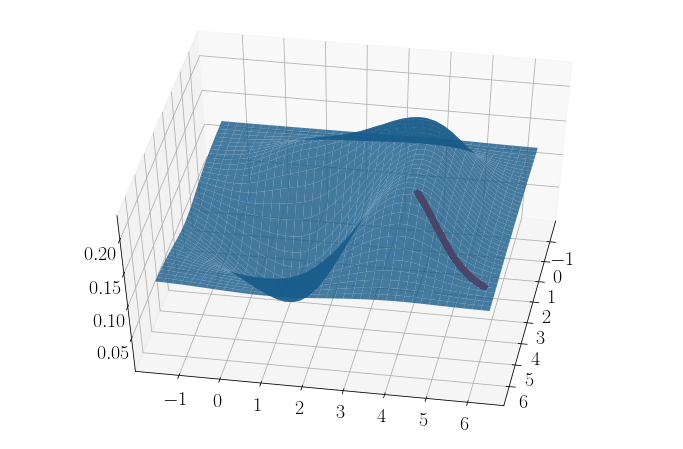

Initial parameter values:
mu1:[4.2,4.0] 
Optimized parameter values:
mu1:[6.02, 5.31] 
Time for 800 steps is 0.6042871475219727 seconds.
The average time for each step is 0.0007553589344024658 seconds.


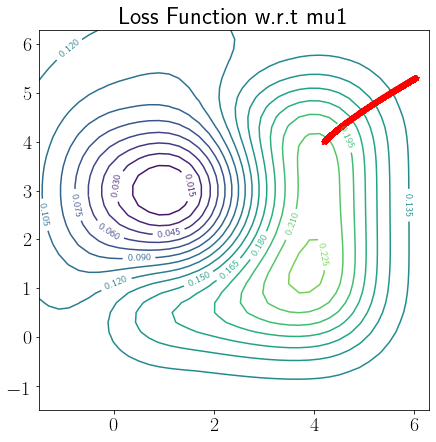

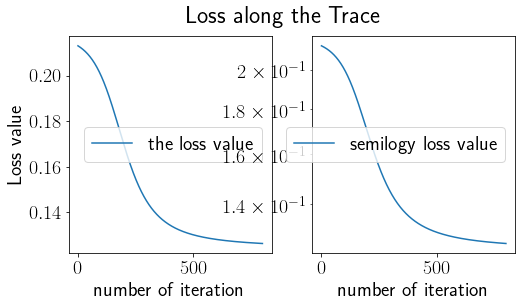

In [45]:
##initial mu1 [4.2, 4]
savepath1 = "/Users/leiwanzhou/Desktop/l2_mix_4para/std-mu1-d3-324d24-d1-trace"
savepath2 = "/Users/leiwanzhou/Desktop/l2_mix_4para/std-mu1-d3-324d24-d1-contour"
std_mu1_4d24,_ = std_GD_mu1(X, 0.3, np.array([3, 2]), .1, np.array([4.2, 4]), 800, 
                            prange, ytruth, savepath1, savepath2);

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060


3500
3501
3502
3503
3504
3505
3506
3507
3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699


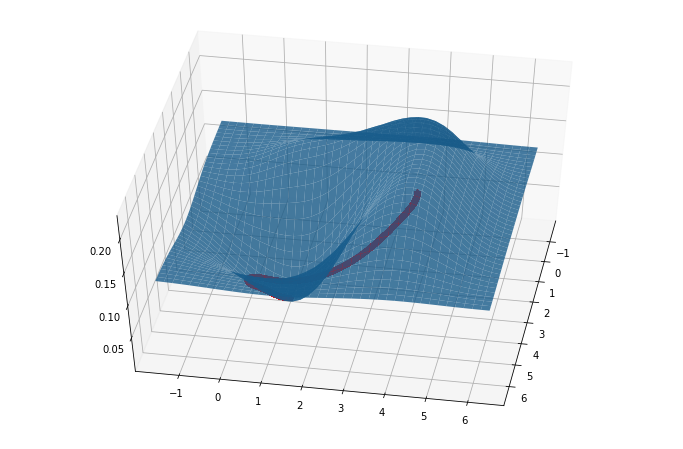

Initial parameter values:
mu1:[4.2,4.0] 
Optimized parameter values:
mu1:[0.98, 3.0] 
Time for 4000 steps is 616.0899069309235 seconds.
The average time for each step is 0.15402247673273087 seconds.


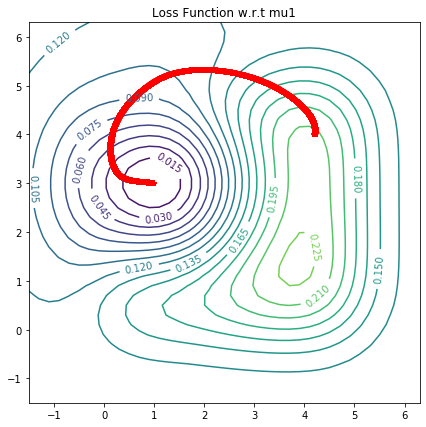

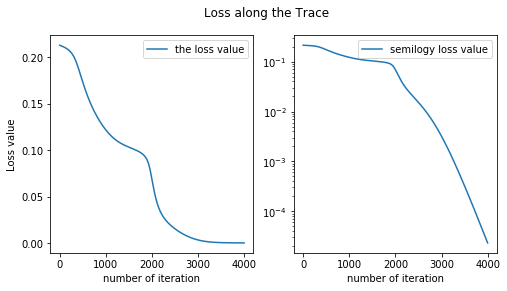

In [18]:
##initial mu1 [4.2, 4]
##Wasserstein Natural GD converges to global minimum slowly
savepath1 = "/Users/leiwanzhou/Desktop/l2_mix_4para/nat-mu1-d3-324d24-d1-trace"
savepath2 = "/Users/leiwanzhou/Desktop/l2_mix_4para/nat-mu1-d3-324d24-d1-contour"
nat_GD_mu1_trace,_ = Natural_GD_mu1(X, .3, np.array([3, 2]), .1, np.array([4.2, 4]), 4000, prange, ytruth, savepath1, savepath2);


In [19]:
np.savetxt('/Users/leiwanzhou/Desktop/l2_mix_4para/trace/nat-tracemu1-init4d2432wd3-lrd1-iter4000.csv', nat_GD_mu1_trace, fmt='%.18e', delimiter=',');

In [39]:
nat_GD_mu1_trace = np.genfromtxt('/Users/leiwanzhou/Desktop/l2_mix_4para/trace/nat-tracemu1-init4d2432wd3-lrd1-iter4000.csv', delimiter = ',');

(101, 2)
(101,)


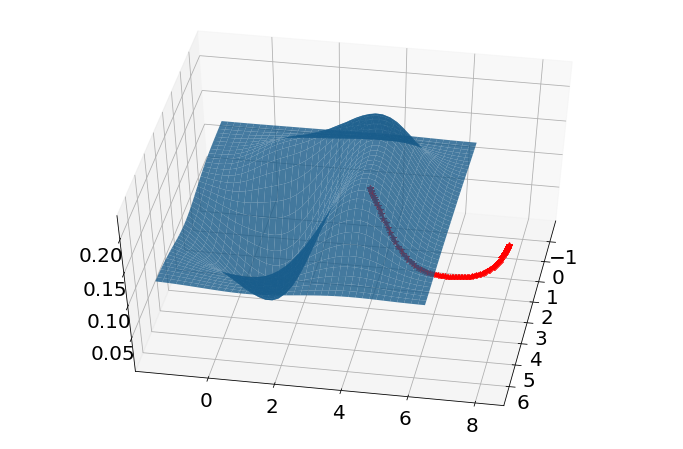

Initial parameter values:
mu1:[4.2,4.0] 
Optimized parameter values:
mu1:[8.15, 3.26] 
Time for 100 steps is 0.1170969009399414 seconds.
The average time for each step is 0.001170969009399414 seconds.


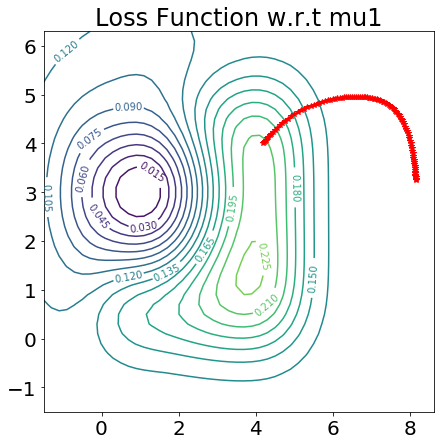

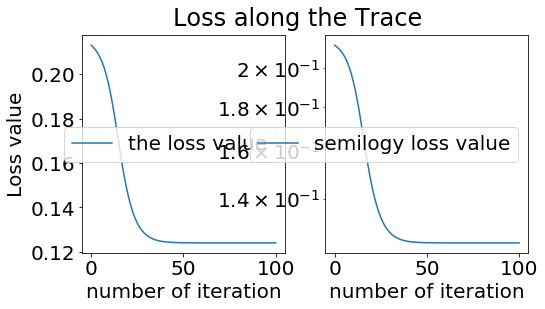

In [25]:
##initial mu1 [4.2, 4]
##l2 natural GD fails to converge
savepath1 = "/Users/leiwanzhou/Desktop/l2_mix_4para/l2-mu1-d3-324d24-d1-trace"
savepath2 = "/Users/leiwanzhou/Desktop/l2_mix_4para/l2-mu1-d3-324d24-d1-contour"
l2_GD_mu1_4d24,_ = l2_Natural_GD_mu1(X, .3, np.array([3, 2]), .1, np.array([4.2, 4]), 100, prange, ytruth, savepath1, savepath2);



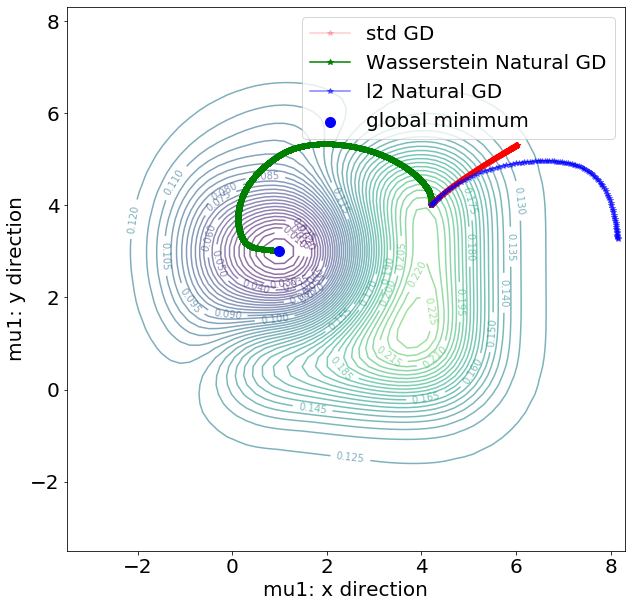

In [26]:
##Plot the three traces togther in one picture
savepath = "/Users/leiwanzhou/Desktop/l2_mix_4para/mu1stdnatl2-together"
xrange = [-3.5, 8.5];
yrange = [-3.5, 8.5]
x = np.arange(xrange[0],xrange[1],grid);
y = np.arange(yrange[0],yrange[1],grid);
plt.rcParams.update({'font.size': 20})
P,Q = np.meshgrid(x,y)
Z = np.zeros((x.size, y.size));
for i in range(x.size):
    for j in range(y.size):
        Z[i, j] = loss(X, 2, np.array([np.array([grid*i+xrange[0], grid*j+yrange[0]]), np.array([3, 2])]), np.array([.3]), ytruth);
fig, ax = plt.subplots(figsize=(10, 10));
level = np.arange(0, .3, 0.005);
CS = ax.contour(Q,P,Z,levels = level, alpha = 0.6, zorder=0);
ax.clabel(CS, inline=True, fontsize=10);
ax.plot(std_mu1_4d24[:, 0], std_mu1_4d24[:, 1], "*-", c='red', alpha = 0.2, label = 'std GD', zorder=10);
ax.plot(nat_GD_mu1_trace[:, 0], nat_GD_mu1_trace[:, 1], "*-", c='green', label = 'Wasserstein Natural GD', zorder=5);
ax.plot(l2_GD_mu1_4d24[:, 0], l2_GD_mu1_4d24[:, 1], "*-", c='blue', alpha = 0.5, label = 'l2 Natural GD', zorder=20);
plt.scatter(1, 3, c='blue', s=100, zorder=30, label='global minimum');
ax.legend()
ax.set_xlabel('mu1: x direction');
ax.set_ylabel('mu1: y direction')
plt.savefig(savepath, dpi=300);

In [24]:
stdGD_len1, stdGD_len2, stdGD_len3 = compute_length_mu1(X, 31, A, std_GD_mu1_trace, np.array([3, 2]), np.array([.3]));

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [25]:
print(stdGD_len1);
print(stdGD_len2);
print(stdGD_len3);

2.2538496945048956
3.915215212232547
0.5023838718293213


In [26]:
w2GD_len1, w2GD_len2, w2GD_len3 = compute_length_mu1(X, 31, A, nat_GD_mu1_trace, np.array([3, 2]), np.array([.3]));

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060


3501
3502
3503
3504
3505
3506
3507
3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700


In [27]:
print(w2GD_len1);
print(w2GD_len2);
print(w2GD_len3);

6.8348635700551466
7.83379663111537
1.5295969159881255


In [28]:
l2GD_len1, l2GD_len2, l2GD_len3 = compute_length_mu1(X, 31, A, l2_GD_mu1_trace, np.array([3, 2]), np.array([.3]));

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99


In [29]:
print(l2GD_len1);
print(l2GD_len2);
print(l2GD_len3);

5.2853857242074325
4.425683899944422
0.5604871373643074


# Trace Length Comparison
initial: w=0.3, mu2_fix = [3, 2], initial_mu1 = [4.2, 4]

Only W2 natural GD converges to global minimum, both std and l2 Natural GD converges to local minimum. 

# L2 Distance:
$\color{red}{\text{std GD trace: 2.2538}}$ 

$\color{green}{\text{W2 natural GD trace: 6.8349}}$             


$\color{orange}{\text{l2 natural GD trace: 5.2854}}$    

# W2 Natural Distance
$\color{red}{\text{std GD trace: 3.9152}}$ 

$\color{green}{\text{W2 natural GD trace: 7.8338}}$             


$\color{orange}{\text{l2 natural GD trace: 4.4257}}$

# L2 Natural Distance
$\color{red}{\text{std GD trace: 0.5024}}$ 

$\color{green}{\text{W2 natural GD trace: 1.5296}}$             


$\color{orange}{\text{l2 natural GD trace: 0.5605}}$


## Test on mu2 only

(4001, 2)
(4001,)


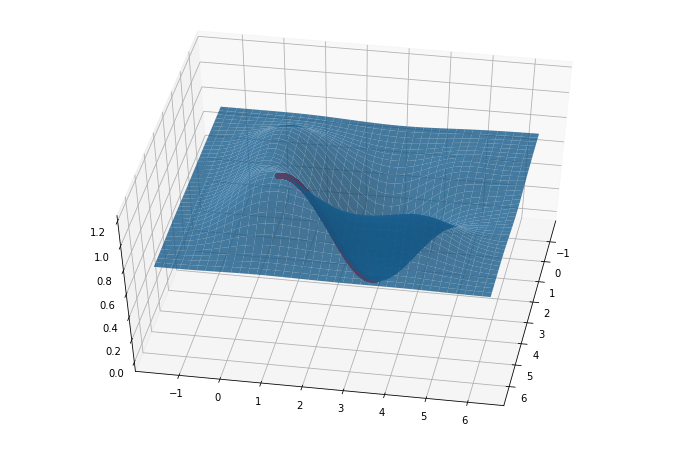

Initial parameter values:
mu1:[1,4] 
Optimized parameter values:
mu1:[3.0, 2.0] 
Time for 4000 steps is 3.1112911701202393 seconds.
The average time for each step is 0.0007778227925300598 seconds.


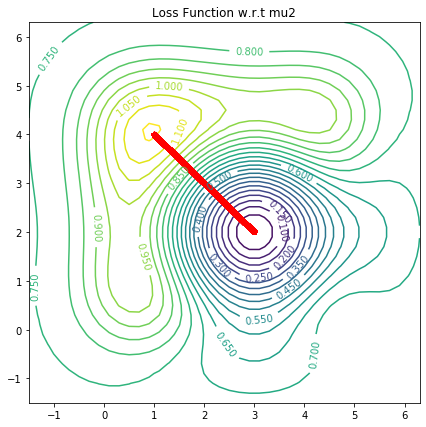

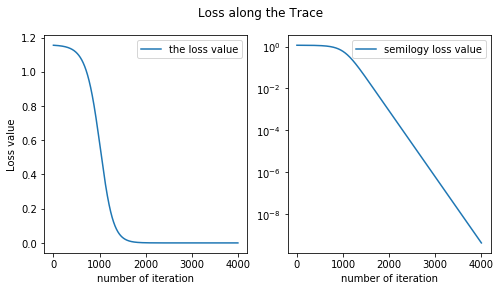

In [28]:
##fix w=.3, mu1=[1, 3], initial mu2 = [1, 4]
##std GD converges to global minimum
savepath1 = "/Users/leiwanzhou/Desktop/l2_mix_4para/std-mu2-d3-1314-d005-trace"
savepath2 = "/Users/leiwanzhou/Desktop/l2_mix_4para/std-mu2-d3-1314-d005-contour"
stdGD_mu2_trace_1314,_ = std_GD_mu2(X, .3, np.array([1, 3]), .005, np.array([1, 4]), 4000, prange, ytruth, savepath1, savepath2);

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060


3500
3501
3502
3503
3504
3505
3506
3507
3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699


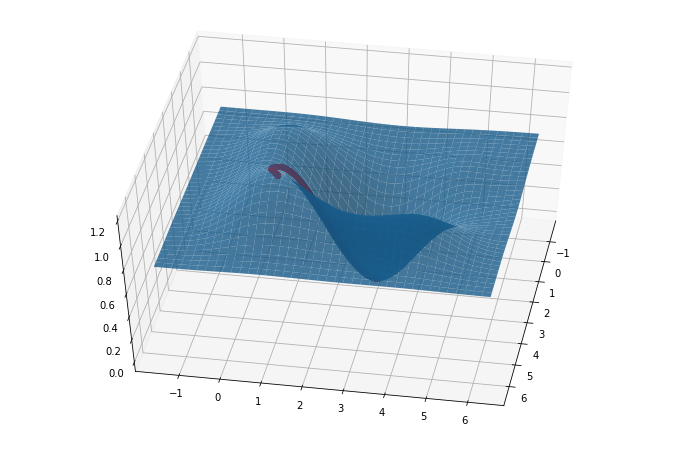

Initial parameter values:
mu2:[1,4] 
Optimized parameter values:
mu2:[3.0, 2.0] 
Time for 4000 steps is 877.5326993465424 seconds.
The average time for each step is 0.21938317483663558 seconds.


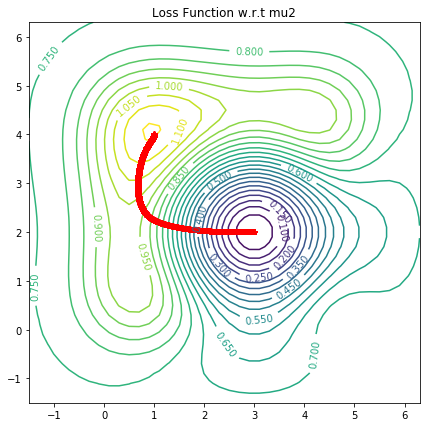

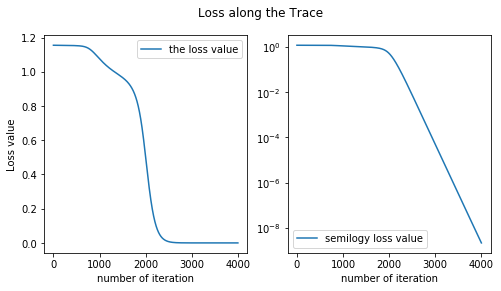

In [35]:
##fix w=.3, mu1=[1, 3], initial mu2 = [1, 4]
##Wasserstein Natural GD converges to global minimum
savepath1 = "/Users/leiwanzhou/Desktop/l2_mix_4para/nat-mu2-d3-1314-d1-trace"
savepath2 = "/Users/leiwanzhou/Desktop/l2_mix_4para/nat-mu2-d3-1314-d1-contour"
natGD_mu2_1314,_ = Natural_GD_mu2(X, .3, np.array([1, 3]), .1, np.array([1, 4]), 4000, prange, ytruth, savepath1, savepath2);

(4001, 2)
(4001,)


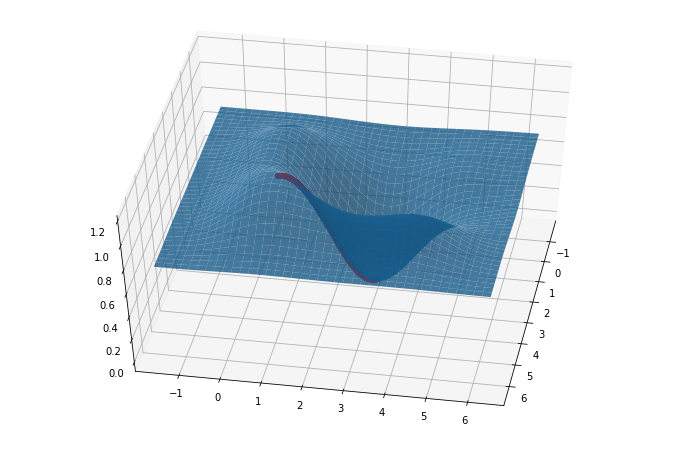

Initial parameter values:
mu2:[1,4] 
Optimized parameter values:
mu2:[3.0, 2.0] 
Time for 4000 steps is 3.635317087173462 seconds.
The average time for each step is 0.0009088292717933655 seconds.


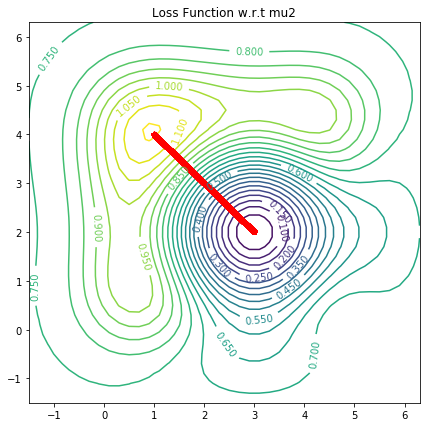

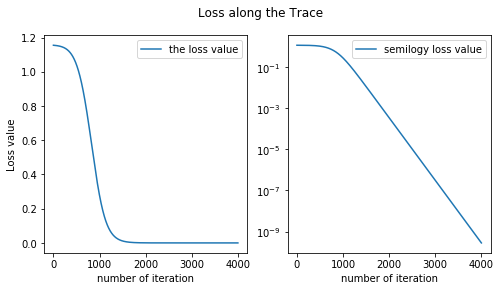

In [34]:
##fix w=.3, mu1=[1, 3], initial mu2 = [1, 4]
##l2 Natural GD converges to global minimum quickly 10 iterations
savepath1 = "/Users/leiwanzhou/Desktop/l2_mix_4para/l2-mu2-d3-1314-d0035-trace"
savepath2 = "/Users/leiwanzhou/Desktop/l2_mix_4para/l2-mu2-d3-1314-d0035-contour"
l2GD_mu2_1314,_ = l2_Natural_GD_mu2(X, .3, np.array([1, 3]), .0035, np.array([1, 4]), 4000, prange, ytruth, savepath1, savepath2);

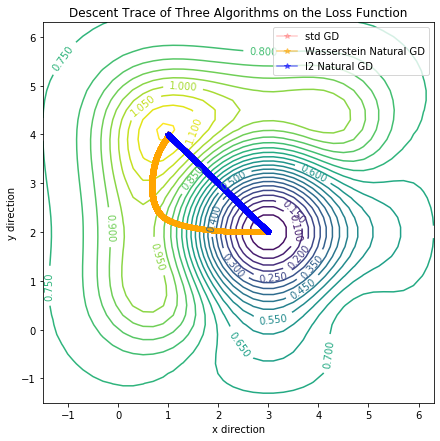

In [36]:
##plot three traces together in one contour plot
savepath = "/Users/leiwanzhou/Desktop/l2_mix_4para/mu2stdnatl2-together-d3-1314-d005d1d0035"
xrange = [-1.5, 6.5];
yrange = [-1.5, 6.5]
x = np.arange(xrange[0],xrange[1],grid);
y = np.arange(yrange[0],yrange[1],grid);
P,Q = np.meshgrid(x,y)
Z = np.zeros((x.size, y.size));
for i in range(x.size):
        for j in range(y.size):
            Z[i, j] = loss(X, 2, np.array([np.array([1, 3]), np.array([grid*i+xrange[0], grid*j+yrange[0]])]), 
                          np.array([.3]), ytruth);
fig, ax = plt.subplots(figsize=(7, 7));
level = np.arange(0, 1.2, 0.05);
CS = ax.contour(Q,P,Z,levels = level);
ax.clabel(CS, inline=True, fontsize=10);
ax.plot(stdGD_mu2_trace_1314[:, 0], stdGD_mu2_trace_1314[:, 1], "*-", c='red', alpha = 0.2, label = 'std GD');
ax.plot(natGD_mu2_1314[:, 0], natGD_mu2_1314[:, 1], "*-", c='orange', alpha = 0.5, label = 'Wasserstein Natural GD');
ax.plot(l2GD_mu2_1314[:, 0], l2GD_mu2_1314[:, 1], "*-", c='blue', alpha = .5, label = 'l2 Natural GD');
ax.legend()
ax.set_title('Descent Trace of Three Algorithms on the Loss Function')
ax.set_xlabel('x direction');
ax.set_ylabel('y direction')
plt.savefig(savepath, dpi=300);

In [37]:
stdGD_len1, stdGD_len2, stdGD_len3 = compute_length_mu2(X, 31, A, stdGD_mu2_trace_1314, np.array([1, 3]), np.array([.3]));

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060


3500
3501
3502
3503
3504
3505
3506
3507
3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699


In [38]:
print(stdGD_len1);
print(stdGD_len2);
print(stdGD_len3);

2.828393295682299
14.313752997298716
2.3321898646594454


In [39]:
natGD_len1, natGD_len2, natGD_len3 = compute_length_mu2(X, 31, A, natGD_mu2_1314, np.array([1, 3]), np.array([.3]));

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060


3500
3501
3502
3503
3504
3505
3506
3507
3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699


In [40]:
print(natGD_len1);
print(natGD_len2);
print(natGD_len3);

3.972547677652624
13.979396775876864
3.1165666902501337


In [39]:
l2GD_len1, l2GD_len2, l2GD_len3 = compute_length_mu2(X, 31, A, l2GD_mu2_1314, np.array([1, 3]), np.array([.3]));

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061


3502
3503
3504
3505
3506
3507
3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700
3701


In [40]:
print(l2GD_len1);
print(l2GD_len2);
print(l2GD_len3);

2.8283993882078646
14.3130675730731
2.3322097206203716


# Trace Length Comparison
initial: w=0.3, mu1_fix = [1, 3], initial_mu2 = [1, 4]
All of the algorithms converge to global minimum.

# L2 Distance:
$\color{red}{\text{std GD trace: 2.828393295682299}}$ 

$\color{green}{\text{W2 natural GD trace: 3.972547677652624}}$           


$\color{orange}{\text{l2 natural GD trace: 2.8283993882078646}}$    

# W2 Natural Distance
$\color{green}{\text{std GD trace: 14.313752997298716}}$ 

$\color{red}{\text{W2 natural GD trace: 13.979396775876864}}$             

$\color{orange}{\text{l2 natural GD trace: 14.3130675730731}}$

# L2 Natural Distance
$\color{red}{\text{std GD trace: 2.3321898646594454}}$ 

$\color{green}{\text{W2 natural GD trace: 3.1165666902501337}}$             

$\color{orange}{\text{l2 natural GD trace: 2.3322097206203716}}$

(2001, 2)
(2001,)


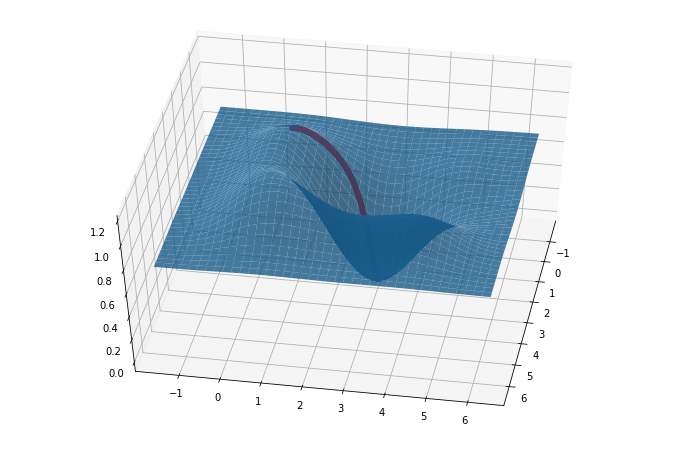

Initial parameter values:
mu1:[0.7,0.7] 
Optimized parameter values:
mu1:[3.0, 2.0] 
Time for 2000 steps is 1.5580840110778809 seconds.
The average time for each step is 0.0007790420055389405 seconds.


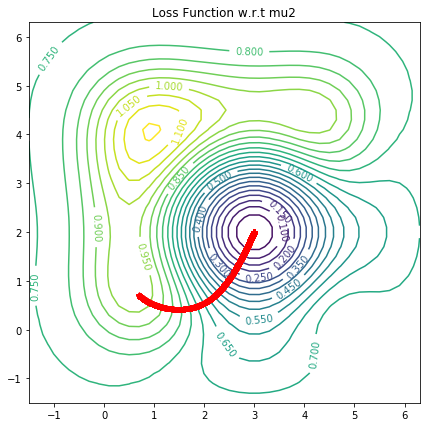

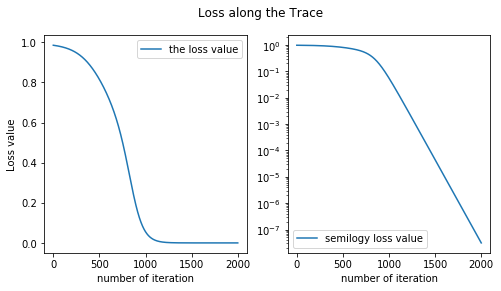

In [17]:
##fix w=.3, mu1=[1, 3], initial mu2 = [0.7, 0.7]
##std GD
savepath1 = "/Users/leiwanzhou/Desktop/l2_mix_4para/std-mu2-d3-13d7d7-d01-trace"
savepath2 = "/Users/leiwanzhou/Desktop/l2_mix_4para/std-mu2-d3-13dd7-d01-contour"
stdGD_mu2_trace_13d5d7,_ = std_GD_mu2(X, .3, np.array([1, 3]), .01, np.array([.7, .7]), 2000, prange, ytruth, savepath1, savepath2);

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
(2001, 2)
(2001,)


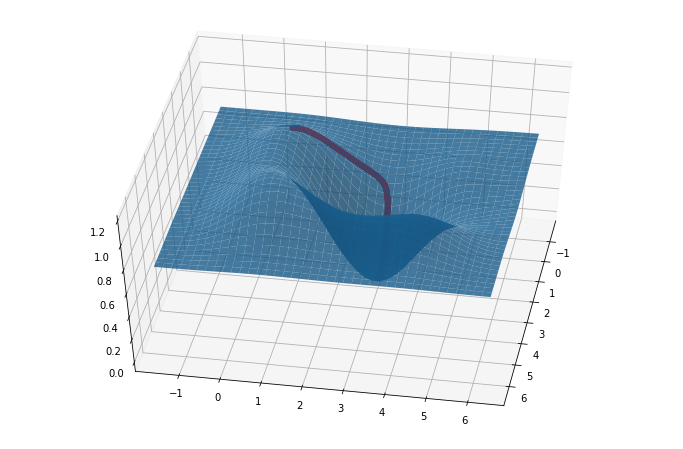

Initial parameter values:
mu2:[0.7,0.7] 
Optimized parameter values:
mu2:[3.01, 1.98] 
Time for 2000 steps is 394.21748518943787 seconds.
The average time for each step is 0.19710874259471894 seconds.


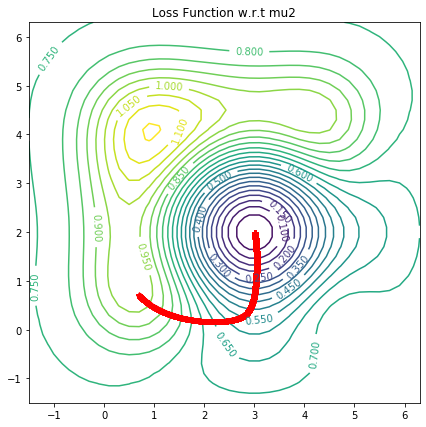

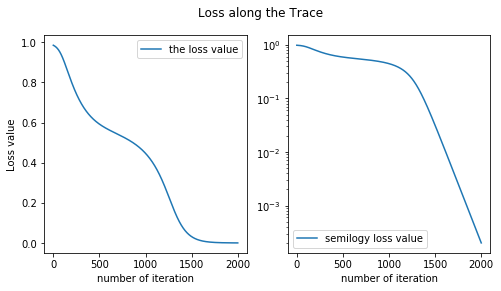

In [18]:
##fix w=.3, mu1=[1, 3], initial mu2 = [0.7, 0.7]
##w2 natural GD
savepath1 = "/Users/leiwanzhou/Desktop/l2_mix_4para/w2-mu2-d3-13d7d7-d1-trace"
savepath2 = "/Users/leiwanzhou/Desktop/l2_mix_4para/w2-mu2-d3-13dd7-d1-contour"
w2GD_mu2_trace_13d5d7,_ = Natural_GD_mu2(X, .3, np.array([1, 3]), .1, np.array([.7, .7]), 2000, prange, ytruth, savepath1, savepath2);

(2001, 2)
(2001,)


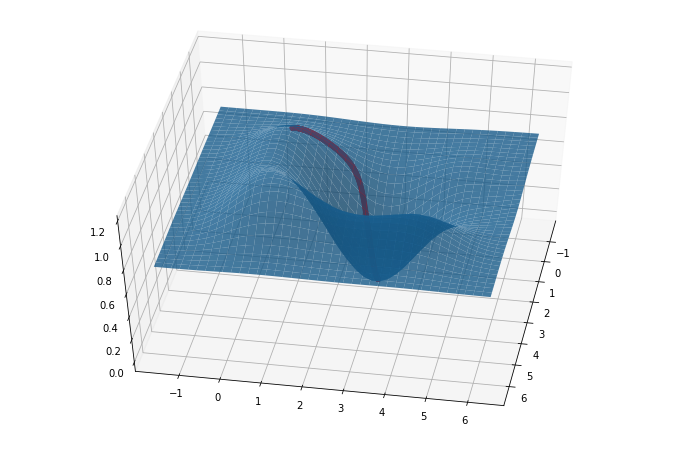

Initial parameter values:
mu2:[0.7,0.7] 
Optimized parameter values:
mu2:[3.0, 2.0] 
Time for 2000 steps is 3.434286117553711 seconds.
The average time for each step is 0.0017171430587768555 seconds.


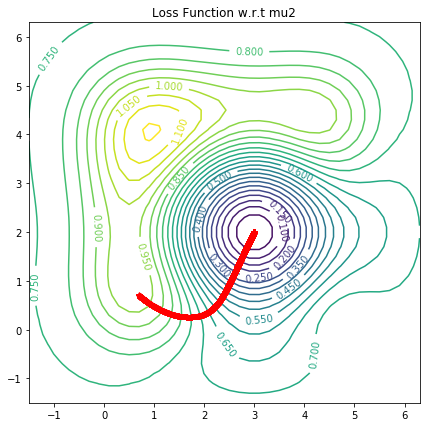

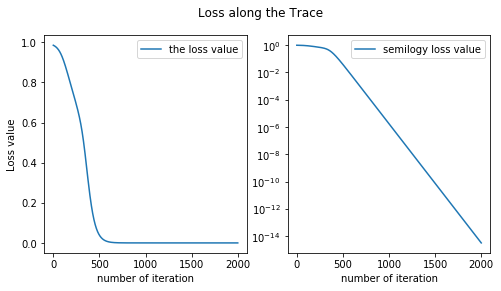

In [19]:
##fix w=.3, mu1=[1, 3], initial mu2 = [0.7, 0.7]
##l2 natural GD
savepath1 = "/Users/leiwanzhou/Desktop/l2_mix_4para/l2-mu2-d3-13d7d7-d01-trace"
savepath2 = "/Users/leiwanzhou/Desktop/l2_mix_4para/l2-mu2-d3-13dd7-d01-contour"
l2GD_mu2_trace_13d5d7,_ = l2_Natural_GD_mu2(X, .3, np.array([1, 3]), .01, np.array([.7, .7]), 2000, prange, ytruth, savepath1, savepath2);

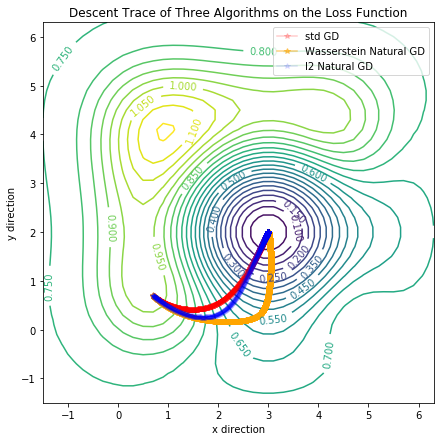

In [21]:
##plot three traces together in one contour plot
savepath = "/Users/leiwanzhou/Desktop/l2_mix_4para/mu2stdnatl2-together-d3-13d7d7-d1-lrd01d1d01"
xrange = [-1.5, 6.5];
yrange = [-1.5, 6.5]
x = np.arange(xrange[0],xrange[1],grid);
y = np.arange(yrange[0],yrange[1],grid);
P,Q = np.meshgrid(x,y)
Z = np.zeros((x.size, y.size));
for i in range(x.size):
        for j in range(y.size):
            Z[i, j] = loss(X, 2, np.array([np.array([1, 3]), np.array([grid*i+xrange[0], grid*j+yrange[0]])]), 
                          np.array([.3]), ytruth);
fig, ax = plt.subplots(figsize=(7, 7));
level = np.arange(0, 1.2, 0.05);
CS = ax.contour(Q,P,Z,levels = level);
ax.clabel(CS, inline=True, fontsize=10);
ax.plot(stdGD_mu2_trace_13d5d7[:, 0], stdGD_mu2_trace_13d5d7[:, 1], "*-", c='red', alpha = 0.2, label = 'std GD');
ax.plot(w2GD_mu2_trace_13d5d7[:, 0], w2GD_mu2_trace_13d5d7[:, 1], "*-", c='orange', alpha = 0.5, label = 'Wasserstein Natural GD');
ax.plot(l2GD_mu2_trace_13d5d7[:, 0], l2GD_mu2_trace_13d5d7[:, 1], "*-", c='blue', alpha = .1, label = 'l2 Natural GD');
ax.legend()
ax.set_title('Descent Trace of Three Algorithms on the Loss Function')
ax.set_xlabel('x direction');
ax.set_ylabel('y direction')
plt.savefig(savepath, dpi=300);

In [22]:
stdGD_len1, stdGD_len2, stdGD_len3 = compute_length_mu2(X, 31, A, stdGD_mu2_trace_13d5d7, np.array([1, 3]), np.array([.3]));

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999


In [23]:
print(stdGD_len1);
print(stdGD_len2);
print(stdGD_len3);

3.1895545801331426
11.068373261139454
2.2826400593488096


In [24]:
w2GD_len1, w2GD_len2, w2GD_len3 = compute_length_mu2(X, 31, A, w2GD_mu2_trace_13d5d7, np.array([1, 3]), np.array([.3]));

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999


In [25]:
print(w2GD_len1);
print(w2GD_len2);
print(w2GD_len3);

4.0162996548422445
12.52960713718762
2.6675029306965325


In [26]:
l2GD_len1, l2GD_len2, l2GD_len3 = compute_length_mu2(X, 31, A, l2GD_mu2_trace_13d5d7, np.array([1, 3]), np.array([.3]));

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999


In [27]:
print(l2GD_len1);
print(l2GD_len2);
print(l2GD_len3);

3.423443201799503
11.602263442451667
2.3639289676184028


# Trace Length Comparison
initial: w=0.3, mu1_fix = [1, 3], initial_mu2 = [.7, .7]

All of the three algorithms converge to the global minimum in three different traces.

# L2 Distance:
$\color{red}{\text{std GD trace: 3.1895545801331426}}$ 

$\color{green}{\text{W2 natural GD trace: 4.0162996548422445}}$           


$\color{orange}{\text{l2 natural GD trace: 3.423443201799503}}$    

# W2 Natural Distance
$\color{red}{\text{std GD trace: 11.068373261139454}}$ 

$\color{green}{\text{W2 natural GD trace: 12.52960713718762}}$             

$\color{orange}{\text{l2 natural GD trace: 11.602263442451667}}$

# L2 Natural Distance
$\color{red}{\text{std GD trace: 2.2826400593488096}}$ 

$\color{green}{\text{W2 natural GD trace: 2.6675029306965325}}$             

$\color{orange}{\text{l2 natural GD trace: 2.3639289676184028}}$



(301, 2)
(301,)


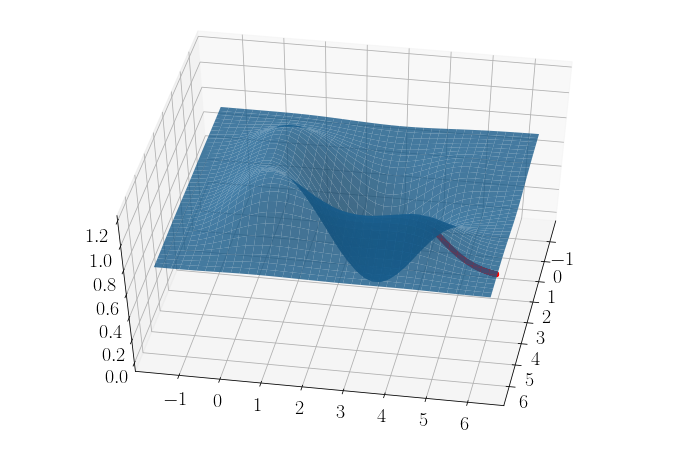

Initial parameter values:
mu1:[4.7,4.6] 
Optimized parameter values:
mu1:[6.28, 5.27] 
Time for 300 steps is 0.25537109375 seconds.
The average time for each step is 0.0008512369791666667 seconds.


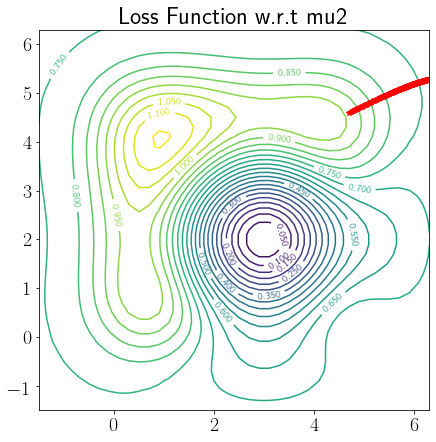

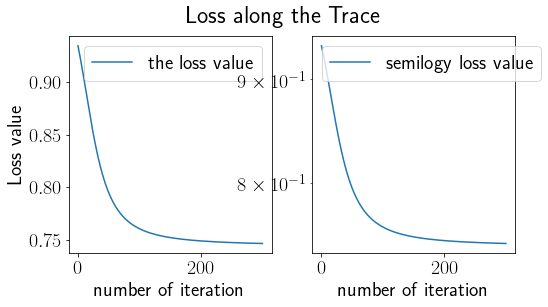

In [49]:
##fix w=.3, mu1=[1, 3], initial mu2 = [4.7, 4.6]
##std GD converges to bad local minimum
savepath1 = "/Users/leiwanzhou/Desktop/l2_mix_4para/std-mu2-d3-134d74d6-d1-trace"
savepath2 = "/Users/leiwanzhou/Desktop/l2_mix_4para/std-mu2-d3-134d74d6-d1-contour"
std_mu2_4d74d6,_ = std_GD_mu2(X, .3, np.array([1, 3]), .1, np.array([4.7, 4.6]), 300, prange, ytruth, savepath1, savepath2);

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060


3500
3501
3502
3503
3504
3505
3506
3507
3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699


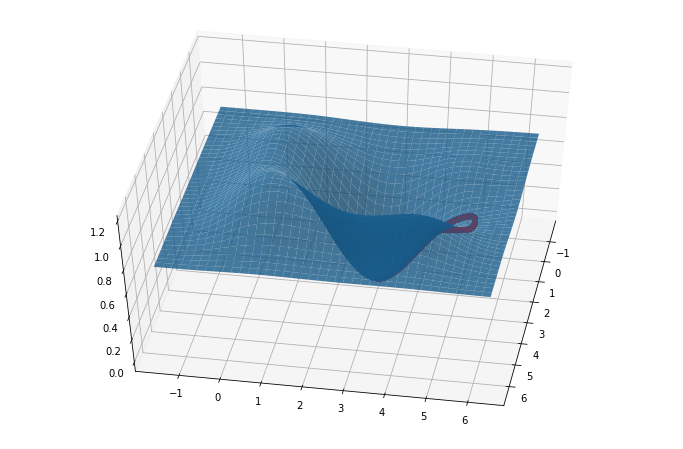

Initial parameter values:
mu2:[4.7,4.6] 
Optimized parameter values:
mu2:[3.0, 2.0] 
Time for 5000 steps is 797.3921053409576 seconds.
The average time for each step is 0.15947842106819152 seconds.


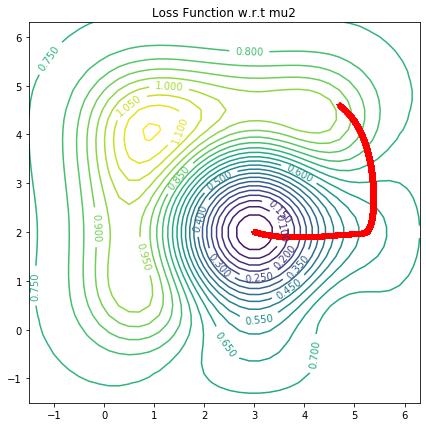

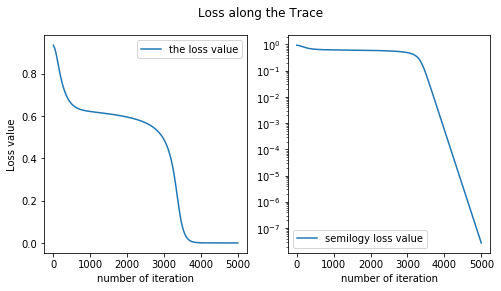

In [87]:
##fix w=.3, mu1=[1, 3], initial mu2 = [4.7, 4.6]
##Wasserstein GD converges to global minimum slowly
savepath1 = "/Users/leiwanzhou/Desktop/l2_mix_4para/nat-mu2-d3-134d74d6-d1-trace"
savepath2 = "/Users/leiwanzhou/Desktop/l2_mix_4para/nat-mu2-d3-134d74d6-d1-contour"
nat_mu2_4d74d6,_ = Natural_GD_mu2(X, .3, np.array([1, 3]), .1, np.array([4.7, 4.6]), 5000, prange, ytruth, savepath1, savepath2);

In [88]:
np.savetxt('/Users/leiwanzhou/Desktop/l2_mix_4para/trace/nat-tracemu2-init4d74d6wd3-lrd1-iter5000.csv', nat_mu2_4d74d6, fmt='%.18e', delimiter=',');

In [50]:
nat_mu2_4d74d6 = np.genfromtxt('/Users/leiwanzhou/Desktop/l2_mix_4para/trace/nat-tracemu2-init4d74d6wd3-lrd1-iter5000.csv', delimiter = ',');

(201, 2)
(201,)


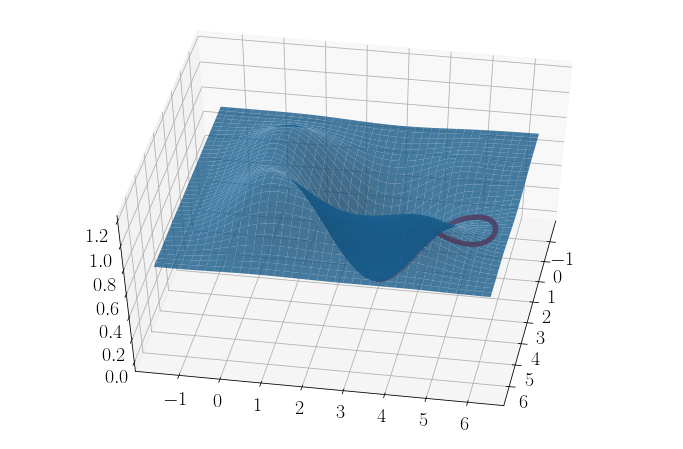

Initial parameter values:
mu2:[4.7,4.6] 
Optimized parameter values:
mu2:[3.0, 2.0] 
Time for 200 steps is 0.20830988883972168 seconds.
The average time for each step is 0.0010415494441986084 seconds.


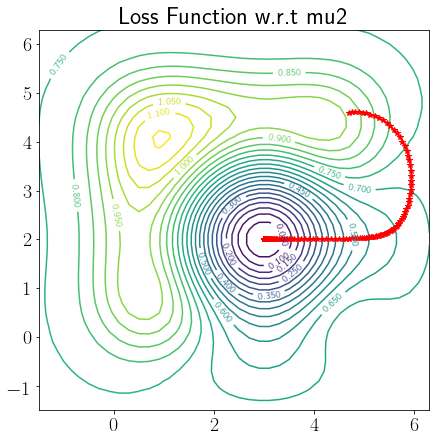

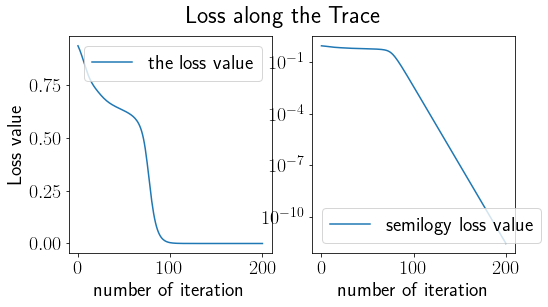

In [51]:
##fix w=.3, mu1=[1, 3], initial mu2 = [4.7, 4.6]
##l2 natural GD converges to global minimum quickly in 200 iterations
##big step size can skip local minimum
savepath1 = "/Users/leiwanzhou/Desktop/l2_mix_4para/l2-mu2-d3-134d74d6-d1-trace"
savepath2 = "/Users/leiwanzhou/Desktop/l2_mix_4para/l2-mu2-d3-134d74d6-d1-contour"
l2_mu2_4d74d6,_ = l2_Natural_GD_mu2(X, .3, np.array([1, 3]), .1, np.array([4.7, 4.6]), 200, prange, ytruth, savepath1, savepath2);

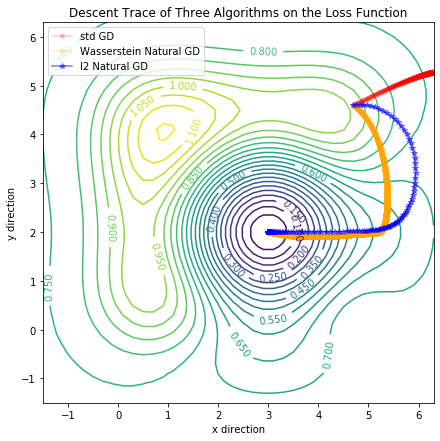

In [33]:
##plot three traces together in one contour plot
savepath = "/Users/leiwanzhou/Desktop/l2_mix_4para/mu2stdnatl2-together-d3-134d74d6-d1"
xrange = [-1.5, 6.5];
yrange = [-1.5, 6.5]
x = np.arange(xrange[0],xrange[1],grid);
y = np.arange(yrange[0],yrange[1],grid);
P,Q = np.meshgrid(x,y)
Z = np.zeros((x.size, y.size));
for i in range(x.size):
        for j in range(y.size):
            Z[i, j] = loss(X, 2, np.array([np.array([1, 3]), np.array([grid*i+xrange[0], grid*j+yrange[0]])]), 
                          np.array([.3]), ytruth);
fig, ax = plt.subplots(figsize=(7, 7));
level = np.arange(0, 1.2, 0.05);
CS = ax.contour(Q,P,Z,levels = level);
ax.clabel(CS, inline=True, fontsize=10);
ax.plot(std_mu2_4d74d6[:, 0], std_mu2_4d74d6[:, 1], "*-", c='red', alpha = 0.2, label = 'std GD');
ax.plot(nat_mu2_4d74d6[:, 0], nat_mu2_4d74d6[:, 1], "*-", c='orange', alpha = 0.2, label = 'Wasserstein Natural GD');
ax.plot(l2_mu2_4d74d6[:, 0], l2_mu2_4d74d6[:, 1], "*-", c='blue', alpha = 0.5, label = 'l2 Natural GD');
ax.legend()
ax.set_title('Descent Trace of Three Algorithms on the Loss Function')
ax.set_xlabel('x direction');
ax.set_ylabel('y direction')
plt.savefig(savepath, dpi=300);

(401, 2)
(401,)


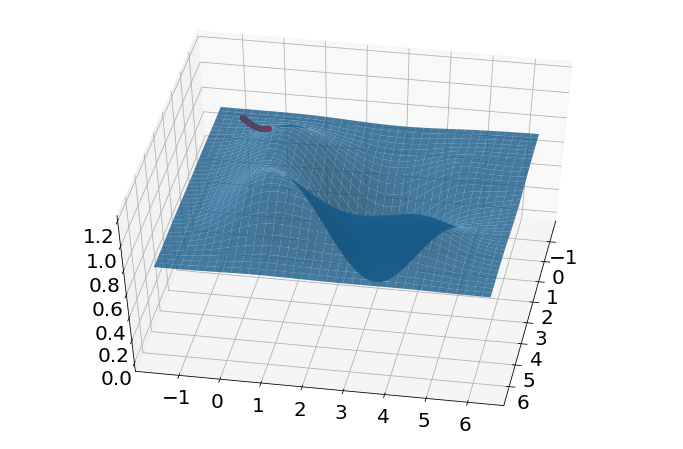

Initial parameter values:
mu1:[0,0] 
Optimized parameter values:
mu1:[-0.87, -1.06] 
Time for 400 steps is 0.3451271057128906 seconds.
The average time for each step is 0.0008628177642822266 seconds.


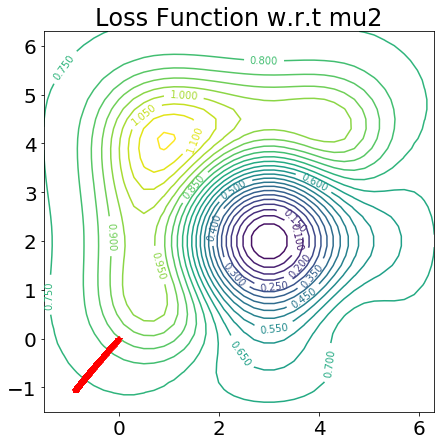

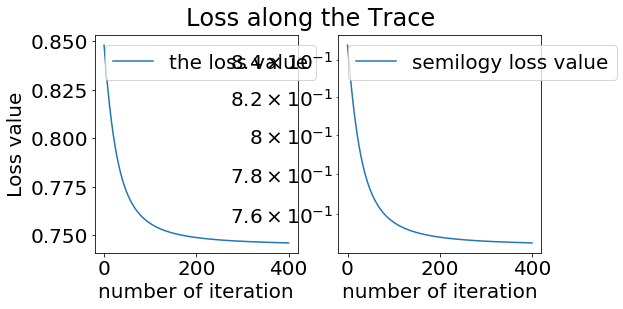

In [21]:
##fix w=.3, mu1=[1, 3], initial mu2 = [0, 0]
##std GD converges to bad local minimum
savepath1 = "/Users/leiwanzhou/Desktop/l2_mix_4para/std-mu2-d3-400-d1-trace"
savepath2 = "/Users/leiwanzhou/Desktop/l2_mix_4para/std-mu2-d3-400-d1-contour"
std_GD_mu2_trace2,_ = std_GD_mu2(X, .3, np.array([1, 3]), .1, np.array([0, 0]), 400, prange, ytruth, savepath1, savepath2);

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061


3502
3503
3504
3505
3506
3507
3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700
3701


5142
5143
5144
5145
5146
5147
5148
5149
5150
5151
5152
5153
5154
5155
5156
5157
5158
5159
5160
5161
5162
5163
5164
5165
5166
5167
5168
5169
5170
5171
5172
5173
5174
5175
5176
5177
5178
5179
5180
5181
5182
5183
5184
5185
5186
5187
5188
5189
5190
5191
5192
5193
5194
5195
5196
5197
5198
5199
5200
5201
5202
5203
5204
5205
5206
5207
5208
5209
5210
5211
5212
5213
5214
5215
5216
5217
5218
5219
5220
5221
5222
5223
5224
5225
5226
5227
5228
5229
5230
5231
5232
5233
5234
5235
5236
5237
5238
5239
5240
5241
5242
5243
5244
5245
5246
5247
5248
5249
5250
5251
5252
5253
5254
5255
5256
5257
5258
5259
5260
5261
5262
5263
5264
5265
5266
5267
5268
5269
5270
5271
5272
5273
5274
5275
5276
5277
5278
5279
5280
5281
5282
5283
5284
5285
5286
5287
5288
5289
5290
5291
5292
5293
5294
5295
5296
5297
5298
5299
5300
5301
5302
5303
5304
5305
5306
5307
5308
5309
5310
5311
5312
5313
5314
5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
5338
5339
5340
5341


6782
6783
6784
6785
6786
6787
6788
6789
6790
6791
6792
6793
6794
6795
6796
6797
6798
6799
6800
6801
6802
6803
6804
6805
6806
6807
6808
6809
6810
6811
6812
6813
6814
6815
6816
6817
6818
6819
6820
6821
6822
6823
6824
6825
6826
6827
6828
6829
6830
6831
6832
6833
6834
6835
6836
6837
6838
6839
6840
6841
6842
6843
6844
6845
6846
6847
6848
6849
6850
6851
6852
6853
6854
6855
6856
6857
6858
6859
6860
6861
6862
6863
6864
6865
6866
6867
6868
6869
6870
6871
6872
6873
6874
6875
6876
6877
6878
6879
6880
6881
6882
6883
6884
6885
6886
6887
6888
6889
6890
6891
6892
6893
6894
6895
6896
6897
6898
6899
6900
6901
6902
6903
6904
6905
6906
6907
6908
6909
6910
6911
6912
6913
6914
6915
6916
6917
6918
6919
6920
6921
6922
6923
6924
6925
6926
6927
6928
6929
6930
6931
6932
6933
6934
6935
6936
6937
6938
6939
6940
6941
6942
6943
6944
6945
6946
6947
6948
6949
6950
6951
6952
6953
6954
6955
6956
6957
6958
6959
6960
6961
6962
6963
6964
6965
6966
6967
6968
6969
6970
6971
6972
6973
6974
6975
6976
6977
6978
6979
6980
6981


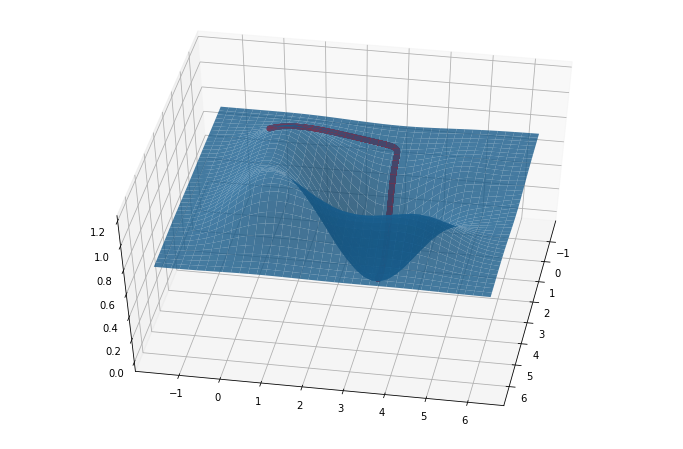

Initial parameter values:
mu2:[0,0] 
Optimized parameter values:
mu2:[3.0, 2.0] 
Time for 7000 steps is 1048.7380909919739 seconds.
The average time for each step is 0.1498197272845677 seconds.


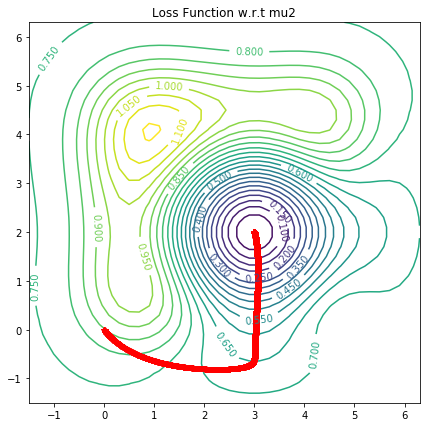

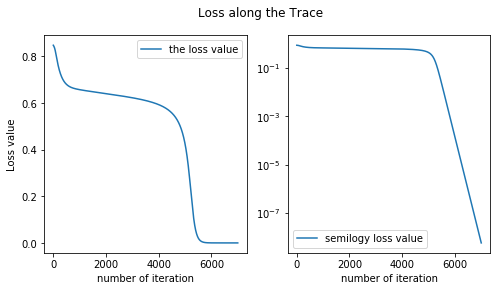

In [44]:
##fix w=.3, mu1=[1, 3], initial mu2 = [0, 0]
##Wasserstein Natural GD converges to global truth
savepath1 = "/Users/leiwanzhou/Desktop/l2_mix_4para/nat-mu2-d3-7000-d1-trace"
savepath2 = "/Users/leiwanzhou/Desktop/l2_mix_4para/nat-mu2-d3-7000-d1-contour"
nat_GD_mu2_trace2,_ = Natural_GD_mu2(X, .3, np.array([1, 3]), .1, np.array([0, 0]), 7000, prange, ytruth, savepath1, savepath2);

In [46]:
np.savetxt('/Users/leiwanzhou/Desktop/l2_mix_4para/trace/nat-tracemu2-init1300wd3-lrd1-iter7000.csv', nat_GD_mu2_trace2, fmt='%.18e', delimiter=',');

In [18]:
nat_GD_mu2_trace2 = np.genfromtxt('/Users/leiwanzhou/Desktop/l2_mix_4para/trace/nat-tracemu2-init1300wd3-lrd1-iter7000.csv', delimiter = ',');

(201, 2)
(201,)


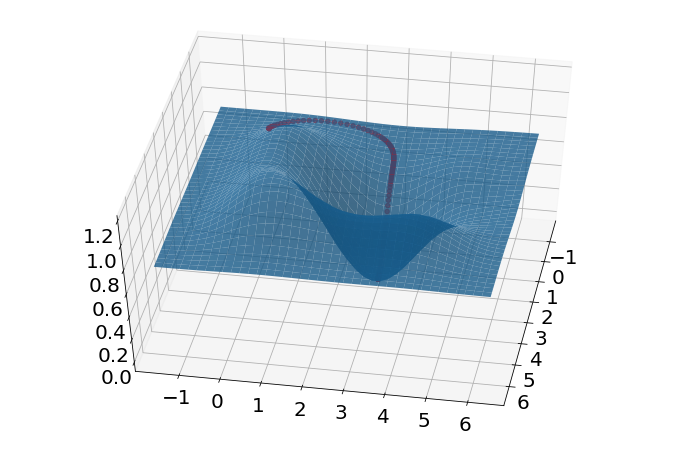

Initial parameter values:
mu2:[0,0] 
Optimized parameter values:
mu2:[3.0, 2.0] 
Time for 200 steps is 0.2255091667175293 seconds.
The average time for each step is 0.0011275458335876466 seconds.


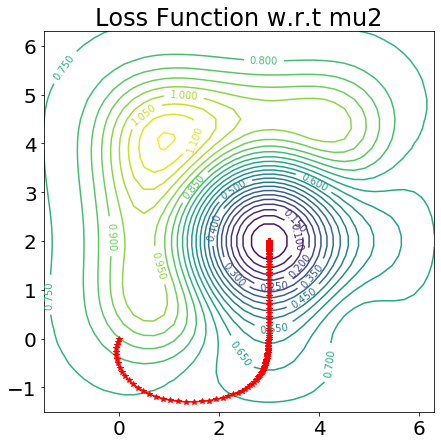

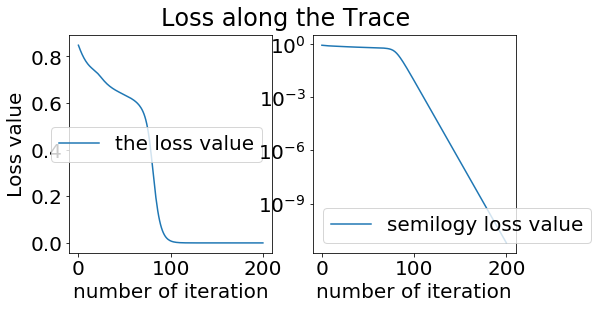

In [19]:
##fix w=.3, mu1=[1, 3], initial mu2 = [0, 0]
##l2 Natural GD converges to global minimum
savepath1 = "/Users/leiwanzhou/Desktop/l2_mix_4para/l2-mu2-d3-2000-d1-trace"
savepath2 = "/Users/leiwanzhou/Desktop/l2_mix_4para/l2-mu2-d3-2000-d1-contour"
l2_GD_mu2_trace2,_ = l2_Natural_GD_mu2(X, .3, np.array([1, 3]), .1, np.array([0, 0]), 200, prange, ytruth, savepath1, savepath2);

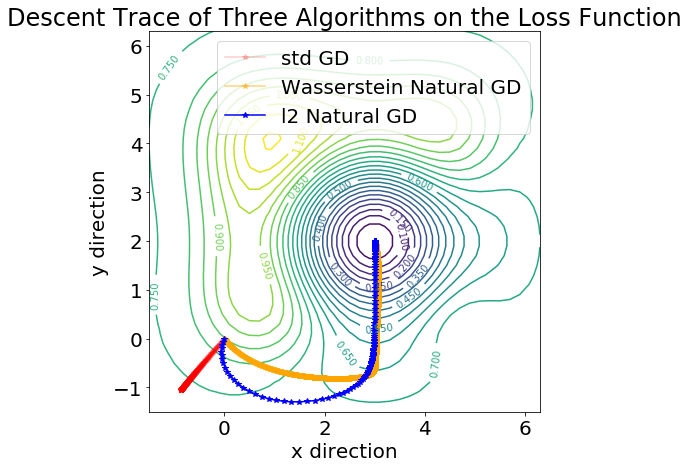

In [22]:
##plot three traces together in one contour plot
savepath = "/Users/leiwanzhou/Desktop/l2_mix_4para/mu2stdnatl2-together-d3-2000-d1"
xrange = [-1.5, 6.5];
yrange = [-1.5, 6.5]
x = np.arange(xrange[0],xrange[1],grid);
y = np.arange(yrange[0],yrange[1],grid);
P,Q = np.meshgrid(x,y)
Z = np.zeros((x.size, y.size));
for i in range(x.size):
        for j in range(y.size):
            Z[i, j] = loss(X, 2, np.array([np.array([1, 3]), np.array([grid*i+xrange[0], grid*j+yrange[0]])]), 
                          np.array([.3]), ytruth);
fig, ax = plt.subplots(figsize=(7, 7));
level = np.arange(0, 1.2, 0.05);
CS = ax.contour(Q,P,Z,levels = level);
ax.clabel(CS, inline=True, fontsize=10);
ax.plot(std_GD_mu2_trace2[:, 0], std_GD_mu2_trace2[:, 1], "*-", c='red', alpha = 0.2, label = 'std GD');
ax.plot(nat_GD_mu2_trace2[:, 0], nat_GD_mu2_trace2[:, 1], "*-", c='orange', alpha = 0.5, label = 'Wasserstein Natural GD');
ax.plot(l2_GD_mu2_trace2[:, 0], l2_GD_mu2_trace2[:, 1], "*-", c='blue', alpha = 1, label = 'l2 Natural GD');
ax.legend()
ax.set_title('Descent Trace of Three Algorithms on the Loss Function')
ax.set_xlabel('x direction');
ax.set_ylabel('y direction')
plt.savefig(savepath, dpi=300);

In [24]:
stdtrace_len1, stdtrace_len2, stdtrace_len3 = compute_length_mu2(X, 31, A, std_GD_mu2_trace2, np.array([1, 3]), np.array([.3]));

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [25]:
print(stdtrace_len1);
print(stdtrace_len2);
print(stdtrace_len3);

1.3708274182765217
4.57005860817838
0.4920583616597538


In [26]:
w2trace_len1, w2trace_len2, w2trace_len3 = compute_length_mu2(X, 31, A, nat_GD_mu2_trace2, np.array([1, 3]), np.array([.3]));

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061


3501
3502
3503
3504
3505
3506
3507
3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700


5141
5142
5143
5144
5145
5146
5147
5148
5149
5150
5151
5152
5153
5154
5155
5156
5157
5158
5159
5160
5161
5162
5163
5164
5165
5166
5167
5168
5169
5170
5171
5172
5173
5174
5175
5176
5177
5178
5179
5180
5181
5182
5183
5184
5185
5186
5187
5188
5189
5190
5191
5192
5193
5194
5195
5196
5197
5198
5199
5200
5201
5202
5203
5204
5205
5206
5207
5208
5209
5210
5211
5212
5213
5214
5215
5216
5217
5218
5219
5220
5221
5222
5223
5224
5225
5226
5227
5228
5229
5230
5231
5232
5233
5234
5235
5236
5237
5238
5239
5240
5241
5242
5243
5244
5245
5246
5247
5248
5249
5250
5251
5252
5253
5254
5255
5256
5257
5258
5259
5260
5261
5262
5263
5264
5265
5266
5267
5268
5269
5270
5271
5272
5273
5274
5275
5276
5277
5278
5279
5280
5281
5282
5283
5284
5285
5286
5287
5288
5289
5290
5291
5292
5293
5294
5295
5296
5297
5298
5299
5300
5301
5302
5303
5304
5305
5306
5307
5308
5309
5310
5311
5312
5313
5314
5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
5338
5339
5340


6780
6781
6782
6783
6784
6785
6786
6787
6788
6789
6790
6791
6792
6793
6794
6795
6796
6797
6798
6799
6800
6801
6802
6803
6804
6805
6806
6807
6808
6809
6810
6811
6812
6813
6814
6815
6816
6817
6818
6819
6820
6821
6822
6823
6824
6825
6826
6827
6828
6829
6830
6831
6832
6833
6834
6835
6836
6837
6838
6839
6840
6841
6842
6843
6844
6845
6846
6847
6848
6849
6850
6851
6852
6853
6854
6855
6856
6857
6858
6859
6860
6861
6862
6863
6864
6865
6866
6867
6868
6869
6870
6871
6872
6873
6874
6875
6876
6877
6878
6879
6880
6881
6882
6883
6884
6885
6886
6887
6888
6889
6890
6891
6892
6893
6894
6895
6896
6897
6898
6899
6900
6901
6902
6903
6904
6905
6906
6907
6908
6909
6910
6911
6912
6913
6914
6915
6916
6917
6918
6919
6920
6921
6922
6923
6924
6925
6926
6927
6928
6929
6930
6931
6932
6933
6934
6935
6936
6937
6938
6939
6940
6941
6942
6943
6944
6945
6946
6947
6948
6949
6950
6951
6952
6953
6954
6955
6956
6957
6958
6959
6960
6961
6962
6963
6964
6965
6966
6967
6968
6969
6970
6971
6972
6973
6974
6975
6976
6977
6978
6979


In [27]:
print(w2trace_len1);
print(w2trace_len2);
print(w2trace_len3);

5.920422828880443
17.337015155060833
2.7269754050208146


In [28]:
l2trace_len1, l2trace_len2, l2trace_len3 = compute_length_mu2(X, 31, A, l2_GD_mu2_trace2, np.array([1, 3]), np.array([.3]));

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199


In [29]:
print(l2trace_len1);
print(l2trace_len2);
print(l2trace_len3);

6.602908121099841
20.86902373021113
2.7466316033979976


## Length Comparison
initial: w=0.3, mu1_fix = [1, 3], mu2_initial=[0, 0]
std GD converges to local minimum while W2 and l2 Natural GD converges to global minimum.

# L2 Distance:
$\color{red}{\text{std GD trace: 1.3708274182765217}}$ 

$\color{orange}{\text{W2 natural GD trace: 5.920422828880443}}$           


$\color{green}{\text{l2 natural GD trace: 6.602908121099841}}$    

# W2 Natural Distance
$\color{red}{\text{std GD trace: 4.57005860817838}}$ 

$\color{orange}{\text{W2 natural GD trace: 17.3370151550608332}}$             

$\color{green}{\text{l2 natural GD trace: 20.86902373021113}}$

# L2 Natural Distance
$\color{red}{\text{std GD trace: 0.4920583616597538}}$ 

$\color{orange}{\text{W2 natural GD trace: 2.7269754050208146}}$             

$\color{green}{\text{l2 natural GD trace: 2.7466316033979976}}$


In [31]:
##test the time consumption of computing W2 natural GD direction
def Natural_dir_mu1_test(X, N, w, mu, ytruth, A, m):
    start = time.time();
    B = Bmatrix(X, N, w, mu, 2, A);
    B = B.toarray();
    qr1start = time.time();
    q, r= linalg.qr(B.T, mode = 'economic');
    qr1end = time.time();
    gradp, gradu = gradient_mu1_all(X, w[0], mu[0], mu[1], ytruth);
    Z = np.linalg.solve(r.T, -gradp);
    Y = np.matmul(q, Z);
    qr2start = time.time();
    Q, R = linalg.qr(Y, mode = 'economic')
    qr2end = time.time();
    diag = abs(np.diagonal(R))
    numseq, indexseq = quick_sort(list(diag), list(range(len(diag))))
    Rtil = R[indexseq[0:m], :]
    qr3start = time.time();
    Q1, R1 = linalg.qr(Rtil.T, mode = 'economic');
    qr3end = time.time();
    z = np.linalg.solve(R1, Q1.T @ gradu);
    y = np.linalg.solve(R1.T, z);
    x = Q1 @ y;
    end = time.time();
    return [end-start, qr1end-qr1start, qr2end-qr2start, qr3end-qr3start];

# Compare the Length of Each of the 3 steps In 3 different Metrics

In [32]:
#given the initial mu1, calculate the steps and calculate their
#lengths in three metrics
def compare_step_mu1(initial_mu1, fix_mu2, w, lr, X, A, ytruth):
    p, gradU = gradient_mu1_all(X, w, initial_mu1, fix_mu2, ytruth);
    std_theta = initial_mu1 - lr*gradU;
    w2_direct = Natural_dir_mu1(X, 31, w, np.array([initial_mu1, fix_mu2]), ytruth, A, 2);
    w2_theta = initial_mu1 - lr*w2_direct;
    l2_direct = l2_Natural_dirFull_mu1(X, np.array([initial_mu1, fix_mu2]), w, 31, ytruth);
    l2_theta = initial_mu1 + lr*l2_direct;
    print("The initial para for mu1 is: [{}, {}]".format(initial_mu1[0], initial_mu1[1]));
    B = Bmatrix(X, 31, w, np.array([initial_mu1, fix_mu2]), 2, A);
    B = B.toarray();
    q, r= linalg.qr(B.T, mode = 'economic');
    gradp = dpdmu1(w, X, initial_mu1);
    Z = np.linalg.solve(r.T, -gradp);
    Y = np.matmul(q, Z);
    #compute three lengths for std GD trace step
    std_std = np.linalg.norm(std_theta-initial_mu1, 2);
    std_w2 = np.linalg.norm(Y@(std_theta-initial_mu1), 2);
    std_l2 = np.linalg.norm(gradp@(std_theta-initial_mu1), 2);
    print("Std GD step:");
    print("L2 metric: {}".format(std_std));
    print("W2 natural metric: {}".format(std_w2));
    print("L2 natural metric: {}".format(std_l2));
    print();
    #compute three lengths for w2 nat GD trace step
    w2_std = np.linalg.norm(w2_theta-initial_mu1, 2);
    w2_w2 = np.linalg.norm(Y@(w2_theta-initial_mu1), 2);
    w2_l2 = np.linalg.norm(gradp@(w2_theta-initial_mu1), 2);
    print("W2 Natural GD step:");
    print("L2 metric: {}".format(w2_std));
    print("W2 natural metric: {}".format(w2_w2));
    print("L2 natural metric: {}".format(w2_l2));
    print();
    #compute three lengths for l2 nat GD trace step
    l2_std = np.linalg.norm(l2_theta-initial_mu1, 2);
    l2_w2 = np.linalg.norm(Y@(l2_theta-initial_mu1), 2);
    l2_l2 = np.linalg.norm(gradp@(l2_theta-initial_mu1), 2);
    print("L2 Natural GD step:");
    print("L2 metric: {}".format(l2_std));
    print("W2 natural metric: {}".format(l2_w2));
    print("L2 natural metric: {}".format(l2_l2));
    #plot three steps
    a1 = std_theta - initial_mu1;
    a2 = w2_theta - initial_mu1;
    a3 = l2_theta - initial_mu1;
    plt.figure(figsize=(6, 6), dpi=100)
    arr1 = plt.arrow(initial_mu1[0], initial_mu1[1], a1[0], a1[1], width=0.0001, fc='r', ec='r');
    arr2 = plt.arrow(initial_mu1[0], initial_mu1[1], a2[0], a2[1], width=0.0001, fc='green', ec='green');
    arr3 = plt.arrow(initial_mu1[0], initial_mu1[1], a3[0], a3[1], width=0.0001, fc='blue', ec='blue');
    plt.xlim([initial_mu1[0]-abs(a3[0]), initial_mu1[0]+abs(a3[0])]);
    plt.ylim([initial_mu1[1]-abs(a3[1]), initial_mu1[1]+abs(a3[1])]);
    plt.legend([arr1, arr2, arr3], ['std GD','W2 nat GD','L2 nat GD'])
    return [std_std, std_w2, std_l2, w2_std, w2_w2, w2_l2, l2_std, l2_w2, l2_l2];   

# Std GD
$$\theta^{l+1} = argmin_{\theta}\{ f(\rho(\theta)) + \frac{||\theta-\theta_l||_2^2}{2\tau}\} \approx \theta_l + 
argmin_h\{ f(\rho(\theta_l)) + \nabla_\theta f^Th + \frac{1}{2\tau}h^Th \}$$
therefore, 
$$\theta_{l+1} - \theta_l = argmin_h\{ f(\rho(\theta_l)) + \nabla_\theta f^Th + \frac{1}{2\tau}h^Th \} = h^* = -\tau\nabla_\theta f^T$$
so, 
$$||\theta_{l+1} - \theta_l||_2 = \tau||\nabla_\theta f^T||_2$$
and
$$||\theta_{l+1} - \theta_l||_{W_2} = \tau||Y\nabla_\theta f^T||_2$$
and 
$$||\theta_{l+1} - \theta_l||_{L_2} = \tau||\nabla_\theta  \rho \nabla_\theta f^T||_2$$

# W2 Natural GD
$$\theta^{l+1} = argmin_{\theta}\{ f(\rho(\theta)) + \frac{W_2^2(\rho(\theta), \rho(\theta_l)}{2\tau} \}$$
$$\approx \theta_l + 
argmin_h\{ f(\rho(\theta_l)) + \nabla_\theta f^Th + \frac{1}{2\tau}h^T(Y^TY)h \}$$
therefore, 
$$\theta_{l+1} - \theta_l = argmin_h\{ f(\rho(\theta_l)) + \nabla_\theta f^Th + \frac{1}{2\tau}h^T(Y^TY)h \} = h^* = -\tau(Y^TY)^{-1}\nabla_{\theta}f^T$$
so, 
$$||\theta_{l+1} - \theta_l||_2 = \tau||(Y^TY)^{-1}\nabla_\theta f^T||_2$$
and, 
$$||\theta_{l+1} - \theta_l||_{W_2} = \tau||Y(Y^TY)^{-1}\nabla_\theta f^T||_2$$
and, 
$$||\theta_{l+1} - \theta_l||_{L_2} = \tau||\nabla_{\theta}\rho(Y^TY)^{-1}\nabla_\theta f^T||_2$$

# L2 Natural GD
$$\theta^{l+1} = argmin_{\theta}\{ f(\rho(\theta)) + \frac{||\rho(\theta)-\rho(\theta_l)||_2^2}{2\tau} \}$$
$$\approx \theta_l + 
argmin_h\{ f(\rho(\theta_l)) + \nabla_\theta f^Th + \frac{1}{2\tau}h^T(\nabla_{\theta}\rho^T \nabla_{\theta}\rho)h \}$$
therefore, 
$$\theta_{l+1} - \theta_l = argmin_h\{ f(\rho(\theta_l)) + \nabla_\theta f^Th + \frac{1}{2\tau}h^T(\nabla_{\theta}\rho^T \nabla_{\theta}\rho)h \} = h^* = -\tau(\nabla_{\theta}\rho^T \nabla_{\theta}\rho)^{-1}\nabla_\theta f^T$$
so, 
$$||\theta_{l+1} - \theta_l||_2 = \tau||(\nabla_{\theta}\rho^T \nabla_{\theta}\rho)^{-1}\nabla_\theta f^T||_2$$
and
$$||\theta_{l+1} - \theta_l||_{W_2} = \tau||Y(\nabla_{\theta}\rho^T \nabla_{\theta}\rho)^{-1}\nabla_\theta f^T||_2$$
and 
$$||\theta_{l+1} - \theta_l||_{L_2} = \tau||\nabla_\theta  \rho (\nabla_{\theta}\rho^T \nabla_{\theta}\rho)^{-1}\nabla_\theta f^T||_2$$

$$\forall \theta,$$
$$f(\rho(\theta_{l+1})) + \frac{||\theta_{l+1}-\theta_l||_2^2}{2\tau}
\leq f(\rho(\theta_{l+1})) + \frac{W_2^2(\rho(\theta_{l+1}, \rho(\theta_l)))}{2\tau}$$

In [33]:
def compare_mu1(initial_mu1, fix_mu2, w, X, A, ytruth):
    p, gradU = gradient_mu1_all(X, w, initial_mu1, fix_mu2, ytruth);
    gradp = dpdmu1(w, X, initial_mu1);
    B = Bmatrix(X, 31, w, np.array([initial_mu1, fix_mu2]), 2, A);
    B = B.toarray();
    q, r= linalg.qr(B.T, mode = 'economic');
    gradp = dpdmu1(w, X, initial_mu1);
    Z = np.linalg.solve(r.T, -gradp);
    Y = np.matmul(q, Z);
    YtYinv = np.linalg.inv(Y.T@Y);
    PtPinv = np.linalg.inv(gradp.T@gradp);
    std_std = np.linalg.norm(gradU, 2);
    std_w2 = np.linalg.norm(Y@gradU, 2);
    std_l2 = np.linalg.norm(gradp@gradU, 2);
    w2_std = np.linalg.norm(YtYinv@gradU, 2);
    w2_w2 = np.linalg.norm(Y@YtYinv@gradU, 2);
    w2_l2 = np.linalg.norm(gradp@YtYinv@gradU, 2);
    l2_std = np.linalg.norm(PtPinv@gradU, 2);
    l2_w2 = np.linalg.norm(Y@PtPinv@gradU, 2);
    l2_l2 = np.linalg.norm(gradp@PtPinv@gradU, 2);
    print("Std GD step:");
    print("L2 metric: {}".format(std_std));
    print("W2 natural metric: {}".format(std_w2));
    print("L2 natural metric: {}".format(std_l2));
    print();
    print("W2 Natural GD step:");
    print("L2 metric: {}".format(w2_std));
    print("W2 natural metric: {}".format(w2_w2));
    print("L2 natural metric: {}".format(w2_l2));
    print();
    print("L2 Natural GD step:");
    print("L2 metric: {}".format(l2_std));
    print("W2 natural metric: {}".format(l2_w2));
    print("L2 natural metric: {}".format(l2_l2));  

The initial para for mu1 is: [4, 1]
Std GD step:
L2 metric: 0.002400099286817678
W2 natural metric: 0.006028850874470252
L2 natural metric: 0.0007138713313131239

W2 Natural GD step:
L2 metric: 0.0006130933013146351
W2 natural metric: 0.0010267504263649352
L2 natural metric: 0.00017716531616610132

L2 Natural GD step:
L2 metric: 0.02713875321194076
W2 natural metric: 0.06802063911036442
L2 natural metric: 0.008070202043404223


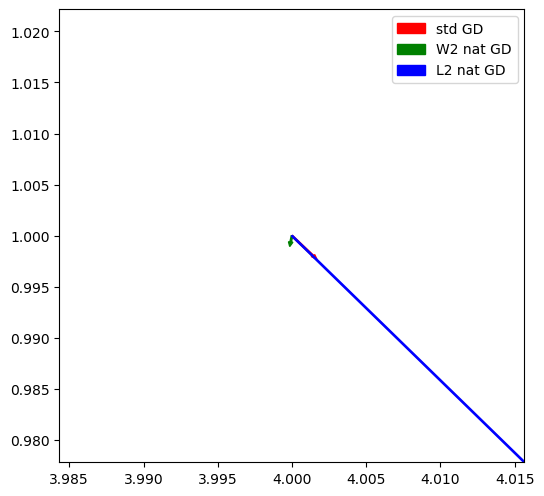

In [22]:
compare_step_mu1(np.array([4, 1]), np.array([3, 2]), np.array([.3]), .1, X, A, ytruth);

In [117]:
compare_mu1(np.array([4, 1]), np.array([3, 2]), np.array([.3]), X, A, ytruth);

Std GD step:
L2 metric: 0.024000992868179003
W2 natural metric: 0.060288508744708834
L2 natural metric: 0.007138713313131909

W2 Natural GD step:
L2 metric: 0.006130933013146214
W2 natural metric: 0.010267504263651014
L2 natural metric: 0.0017716531616609886

L2 Natural GD step:
L2 metric: 0.27138753211940564
W2 natural metric: 0.6802063911036387
L2 natural metric: 0.08070202043404162


# Use Hutchinson Method to Approximate Wasserstein and L2 natural Matrix

In [34]:
##the function uses Hutchinson method to approximate the matrix G
##Y: the matrix Y or drhodtheta that we use to compute G
##N: number of discretization in each dimension
##m: number of random vector we want to use to approximate
def appr_G(Y, N, m):
    H = np.random.normal(0, 1, size = [Y.shape[0], m]);
    YtH = Y.T @ H;
    G = YtH@YtH.T;
    return G/m;

# 1 k=2, 5 parameters
Approximate the Wasserstein Matrix G_w2

In [24]:
w = np.array([.3]); mu = np.array([[4, 4], [3, 2]]);
B = Bmatrix(X, 31, w, mu, 2, A);
B = B.toarray();
q, r= linalg.qr(B.T, mode = 'economic');
gradp, gradu = U_grad(X, mu, w, 2, 31, ytruth);
Z = np.linalg.solve(r.T, -gradp);
Y = np.matmul(q, Z);
Gw2_2 = Y.T @ Y;
norm = [];
M = [10, 20, 40, 80, 100, 150, 200, 300, 400, 500, 600, 700, 800, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000];
for i in range(len(M)):
    n = 0;
    m = M[i];
    for i in range(20):
        n += np.linalg.norm(appr_G(Y, 31, m)-Gw2_2, ord='fro');
    n /= 20;
    norm.append(n);

KeyboardInterrupt: 

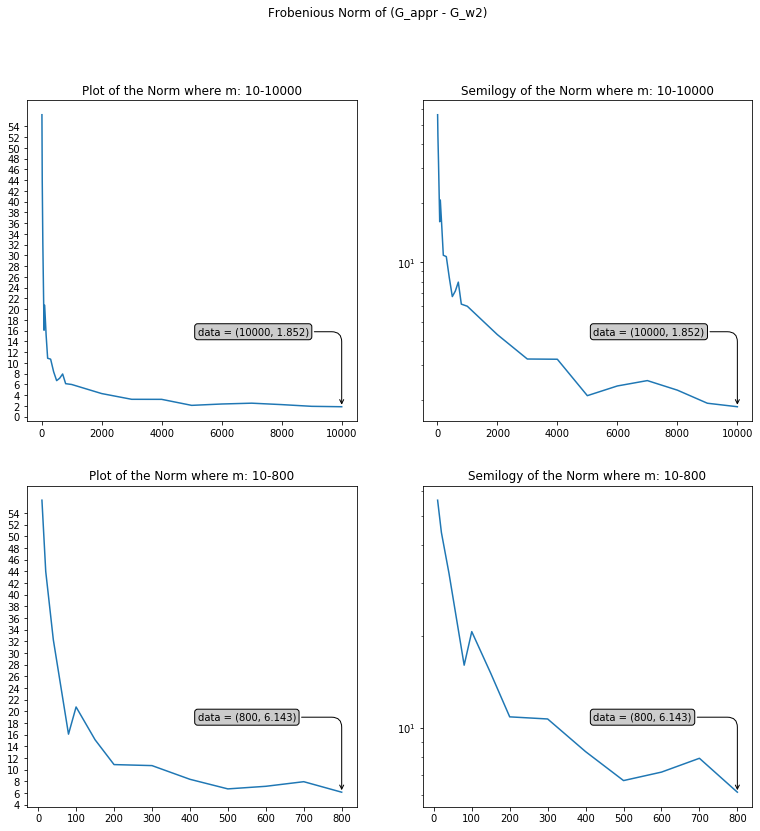

In [21]:
f, ax = plt.subplots(2,2,figsize=(13,13))
bbox = dict(boxstyle ="round", fc ="0.8")
arrowprops = dict(
    arrowstyle = "->",
    connectionstyle = "angle, angleA = 0, \
    angleB = 90, rad = 10")
ax[0][0].yaxis.set_ticks(np.arange(0,55,2))
ax[0][0].plot(M, norm);
ax[0][0].annotate('data = (%.0f, %.3f)'%(M[-1], norm[-1]),
            (M[-1], norm[-1]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[0][0].title.set_text("Plot of the Norm where m: 10-10000");
ax[0][1].semilogy(M, norm);
ax[0][1].annotate('data = (%.0f, %.3f)'%(M[-1], norm[-1]),
            (M[-1], norm[-1]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[0][1].title.set_text("Semilogy of the Norm where m: 10-10000");
ax[1][0].yaxis.set_ticks(np.arange(0,55,2))
ax[1][0].plot(M[0:13], norm[0:13]);
ax[1][0].annotate('data = (%.0f, %.3f)'%(M[12], norm[12]),
            (M[12], norm[12]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[1][0].title.set_text("Plot of the Norm where m: 10-800");
ax[1][1].semilogy(M[0:13], norm[0:13]);
ax[1][1].annotate('data = (%.0f, %.3f)'%(M[12], norm[12]),
            (M[12], norm[12]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[1][1].title.set_text("Semilogy of the Norm where m: 10-800");
f.suptitle("Frobenious Norm of (G_appr - G_w2)")
savp = "/Users/leiwanzhou/Desktop/l2_mix_5para/appr_G/appr_Gw2_k2"
plt.savefig(savp, dpi=300);

Compute the L2 Natural Matrix G_l2

In [167]:
J= p_grad(X, mu, w, 2, 31);
G_l2_2 = J.T @ J;
norm2 = [];
M = [10, 20, 40, 80, 100, 150, 200, 300, 400, 500, 600, 700, 800, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000];
for i in range(len(M)):
    n = 0;
    m = M[i];
    for i in range(20):
        n += np.linalg.norm(appr_G(J, 31, m)-G_l2_2, ord='fro');
    n /= 20;
    norm2.append(n);

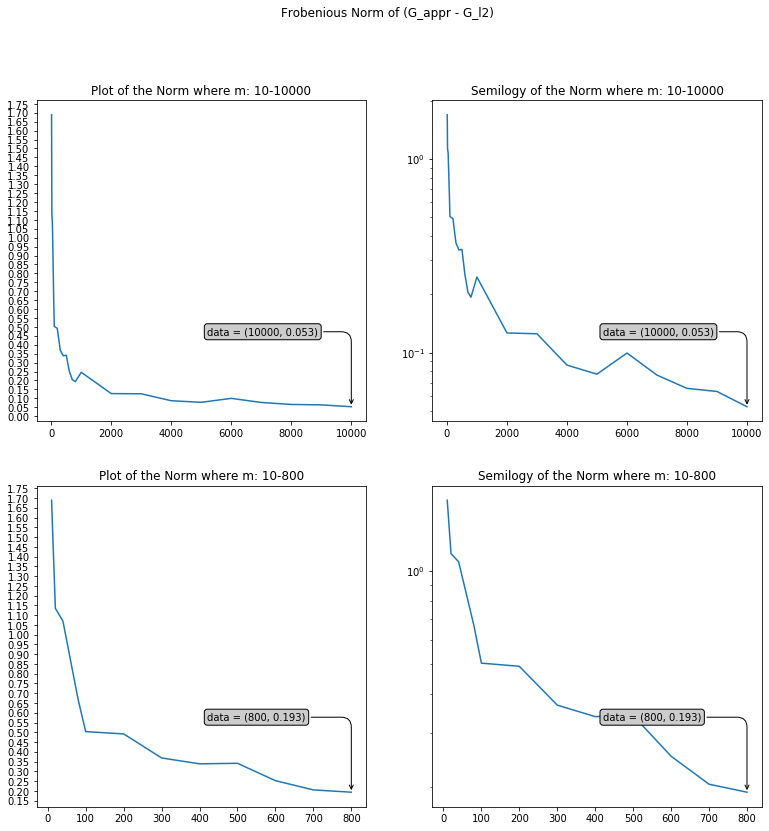

In [173]:
f, ax = plt.subplots(2,2,figsize=(13,13))
bbox = dict(boxstyle ="round", fc ="0.8")
arrowprops = dict(
    arrowstyle = "->",
    connectionstyle = "angle, angleA = 0, \
    angleB = 90, rad = 10")
ax[0][0].yaxis.set_ticks(np.arange(0,2,0.05))
ax[0][0].plot(M, norm2);
ax[0][0].annotate('data = (%.0f, %.3f)'%(M[-1], norm2[-1]),
            (M[-1], norm2[-1]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[0][0].title.set_text("Plot of the Norm where m: 10-10000");
ax[0][1].semilogy(M, norm2);
ax[0][1].annotate('data = (%.0f, %.3f)'%(M[-1], norm2[-1]),
            (M[-1], norm2[-1]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[0][1].title.set_text("Semilogy of the Norm where m: 10-10000");
ax[1][0].yaxis.set_ticks(np.arange(0,2,.05))
ax[1][0].plot(M[0:13], norm2[0:13]);
ax[1][0].annotate('data = (%.0f, %.3f)'%(M[12], norm2[12]),
            (M[12], norm2[12]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[1][0].title.set_text("Plot of the Norm where m: 10-800");
ax[1][1].semilogy(M[0:13], norm2[0:13]);
ax[1][1].annotate('data = (%.0f, %.3f)'%(M[12], norm2[12]),
            (M[12], norm2[12]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[1][1].title.set_text("Semilogy of the Norm where m: 10-800");
f.suptitle("Frobenious Norm of (G_appr - G_l2)")
savp = "/Users/leiwanzhou/Desktop/l2_mix_5para/appr_G/appr_Gl2_k2"
plt.savefig(savp, dpi=300);

# Approximate in Higher Dimension k = 5

In [24]:
mu5_truth, w5_truth = generate_random_para(5);
mu, w = generate_random_para(5);

Approximate G_w2

In [30]:
ytruth5 = model(X, 5, mu5_truth, w5_truth);
B = Bmatrix(X, 31, w, mu, 5, A);
B = B.toarray();
q, r= linalg.qr(B.T, mode = 'economic');
gradp, gradu = U_grad(X, mu, w, 5, 31, ytruth5);
Z = np.linalg.solve(r.T, -gradp);
Y = np.matmul(q, Z);
Gw2_5 = Y.T @ Y;
norm = [];
M = [10, 20, 40, 80, 100, 150, 200, 300, 400, 500, 600, 700, 800, 1000, 2000, 4000, 6000, 8000, 10000, 15000, 20000, 25000, 30000, 40000];
for i in range(len(M)):
    n = 0;
    m = M[i];
    for i in range(20):
        n += np.linalg.norm(appr_G(Y, 31, m)-Gw2_5, ord='fro');
    n /= 20;
    norm.append(n);

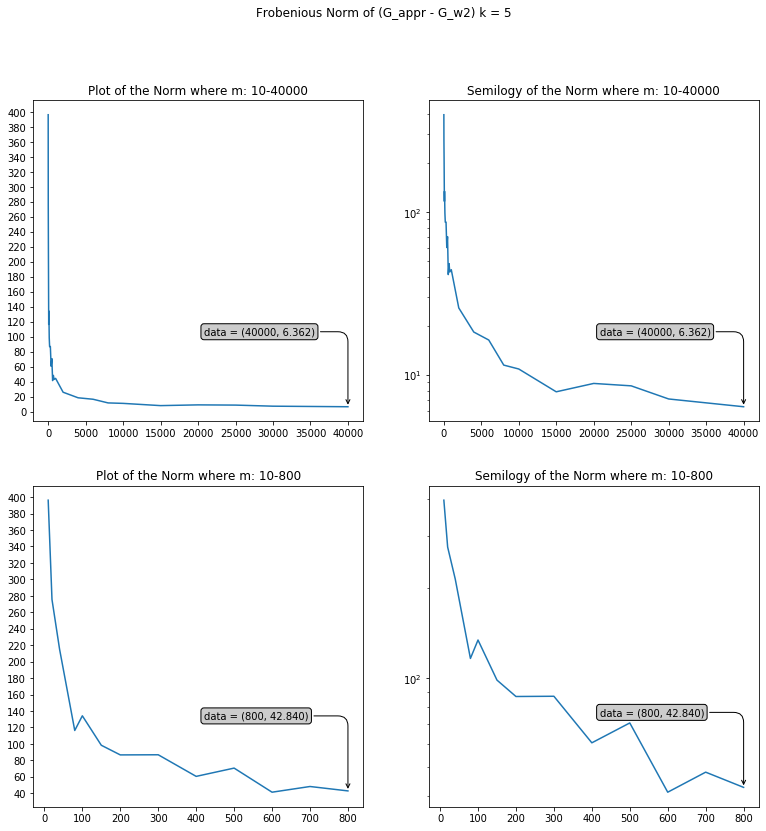

In [50]:
f, ax = plt.subplots(2,2,figsize=(13,13))
bbox = dict(boxstyle ="round", fc ="0.8")
arrowprops = dict(
    arrowstyle = "->",
    connectionstyle = "angle, angleA = 0, \
    angleB = 90, rad = 10")
ax[0][0].yaxis.set_ticks(np.arange(0,450,20))
ax[0][0].plot(M, norm);
ax[0][0].annotate('data = (%.0f, %.3f)'%(M[-1], norm[-1]),
            (M[-1], norm[-1]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[0][0].title.set_text("Plot of the Norm where m: 10-40000");
ax[0][1].semilogy(M, norm);
ax[0][1].annotate('data = (%.0f, %.3f)'%(M[-1], norm[-1]),
            (M[-1], norm[-1]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[0][1].title.set_text("Semilogy of the Norm where m: 10-40000");
ax[1][0].yaxis.set_ticks(np.arange(0,450,20))
ax[1][0].plot(M[0:13], norm[0:13]);
ax[1][0].annotate('data = (%.0f, %.3f)'%(M[12], norm[12]),
            (M[12], norm[12]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[1][0].title.set_text("Plot of the Norm where m: 10-800");
ax[1][1].semilogy(M[0:13], norm[0:13]);
ax[1][1].annotate('data = (%.0f, %.3f)'%(M[12], norm[12]),
            (M[12], norm[12]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[1][1].title.set_text("Semilogy of the Norm where m: 10-800");
f.suptitle("Frobenious Norm of (G_appr - G_w2) k = 5")
savp = "/Users/leiwanzhou/Desktop/l2_mix_5para/appr_G/appr_Gw2_k5"
plt.savefig(savp, dpi=300);

Approximate G_l2

In [57]:
J= p_grad(X, mu, w, 5, 31);
G_l2_5 = J.T @ J;
norm2 = [];
M = [10, 20, 40, 80, 100, 150, 200, 300, 400, 500, 600, 700, 800, 1000, 2000, 3000, 4000, 5000, 6000, 8000, 10000, 15000, 20000];
for i in range(len(M)):
    n = 0;
    m = M[i];
    for i in range(20):
        n += np.linalg.norm(appr_G(J, 31, m)-G_l2_5, ord='fro');
    n /= 20;
    norm2.append(n);

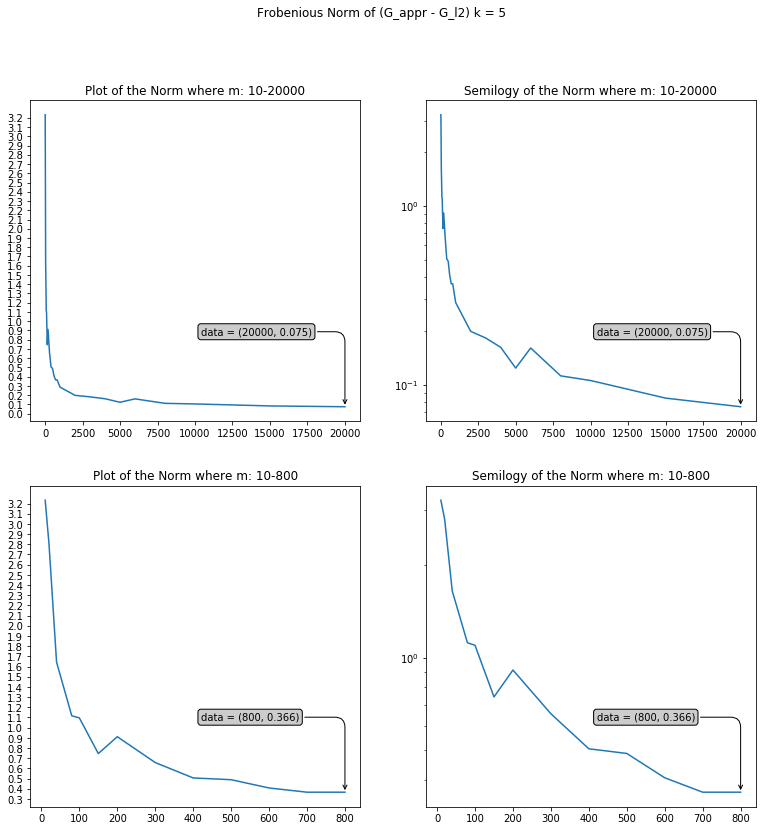

In [58]:
f, ax = plt.subplots(2,2,figsize=(13,13))
bbox = dict(boxstyle ="round", fc ="0.8")
arrowprops = dict(
    arrowstyle = "->",
    connectionstyle = "angle, angleA = 0, \
    angleB = 90, rad = 10")
ax[0][0].yaxis.set_ticks(np.arange(0,3.3,0.1))
ax[0][0].plot(M, norm2);
ax[0][0].annotate('data = (%.0f, %.3f)'%(M[-1], norm2[-1]),
            (M[-1], norm2[-1]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[0][0].title.set_text("Plot of the Norm where m: 10-20000");
ax[0][1].semilogy(M, norm2);
ax[0][1].annotate('data = (%.0f, %.3f)'%(M[-1], norm2[-1]),
            (M[-1], norm2[-1]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[0][1].title.set_text("Semilogy of the Norm where m: 10-20000");
ax[1][0].yaxis.set_ticks(np.arange(0,3.3,.1))
ax[1][0].plot(M[0:13], norm2[0:13]);
ax[1][0].annotate('data = (%.0f, %.3f)'%(M[12], norm2[12]),
            (M[12], norm2[12]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[1][0].title.set_text("Plot of the Norm where m: 10-800");
ax[1][1].semilogy(M[0:13], norm2[0:13]);
ax[1][1].annotate('data = (%.0f, %.3f)'%(M[12], norm2[12]),
            (M[12], norm2[12]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[1][1].title.set_text("Semilogy of the Norm where m: 10-800");
f.suptitle("Frobenious Norm of (G_appr - G_l2) k = 5")
savp = "/Users/leiwanzhou/Desktop/l2_mix_5para/appr_G/appr_Gl2_k5"
plt.savefig(savp, dpi=300);

# Approximate G when k = 10
Approximate G_w2

In [22]:
mu10_truth, w10_truth = generate_random_para(10);
mu, w = generate_random_para(10);

In [62]:
ytruth10 = model(X, 10, mu10_truth, w10_truth);
B = Bmatrix(X, 31, w, mu, 10, A);
B = B.toarray();
q, r= linalg.qr(B.T, mode = 'economic');
gradp, gradu = U_grad(X, mu, w, 10, 31, ytruth10);
Z = np.linalg.solve(r.T, -gradp);
Y = np.matmul(q, Z);
Gw2_10 = Y.T @ Y;
norm = [];
M = [10, 20, 40, 80, 100, 150, 200, 300, 400, 500, 600, 700, 800, 1000, 2000, 4000, 6000, 8000, 10000, 15000, 20000, 25000, 30000, 40000];
for i in range(len(M)):
    n = 0;
    m = M[i];
    for i in range(20):
        n += np.linalg.norm(appr_G(Y, 31, m)-Gw2_10, ord='fro');
    n /= 20;
    norm.append(n);

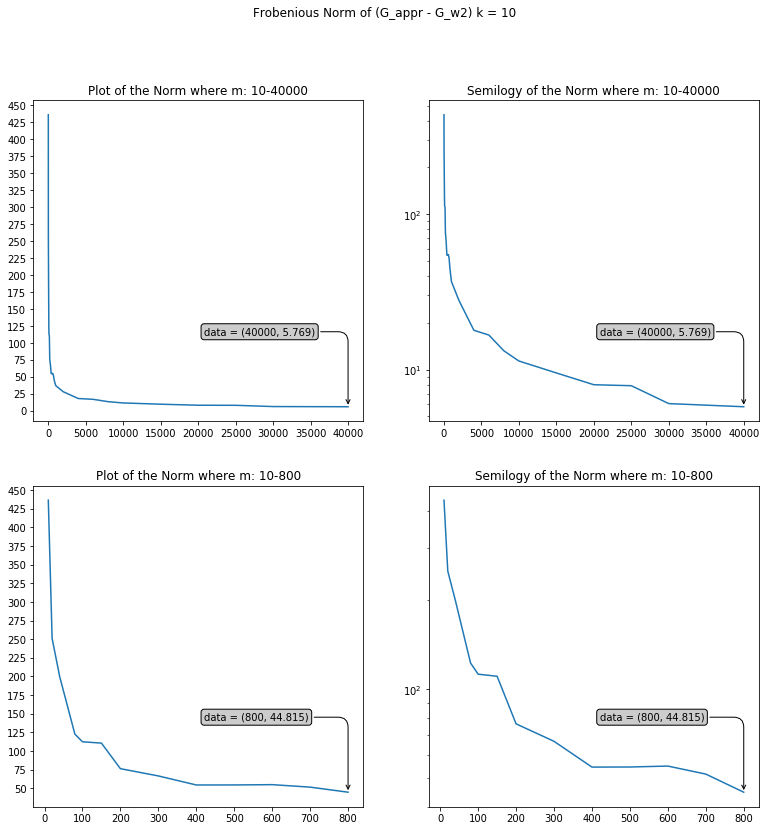

In [66]:
f, ax = plt.subplots(2,2,figsize=(13,13))
bbox = dict(boxstyle ="round", fc ="0.8")
arrowprops = dict(
    arrowstyle = "->",
    connectionstyle = "angle, angleA = 0, \
    angleB = 90, rad = 10")
ax[0][0].yaxis.set_ticks(np.arange(0,700,25))
ax[0][0].plot(M, norm);
ax[0][0].annotate('data = (%.0f, %.3f)'%(M[-1], norm[-1]),
            (M[-1], norm[-1]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[0][0].title.set_text("Plot of the Norm where m: 10-40000");
ax[0][1].semilogy(M, norm);
ax[0][1].annotate('data = (%.0f, %.3f)'%(M[-1], norm[-1]),
            (M[-1], norm[-1]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[0][1].title.set_text("Semilogy of the Norm where m: 10-40000");
ax[1][0].yaxis.set_ticks(np.arange(0,700,25))
ax[1][0].plot(M[0:13], norm[0:13]);
ax[1][0].annotate('data = (%.0f, %.3f)'%(M[12], norm[12]),
            (M[12], norm[12]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[1][0].title.set_text("Plot of the Norm where m: 10-800");
ax[1][1].semilogy(M[0:13], norm[0:13]);
ax[1][1].annotate('data = (%.0f, %.3f)'%(M[12], norm[12]),
            (M[12], norm[12]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[1][1].title.set_text("Semilogy of the Norm where m: 10-800");
f.suptitle("Frobenious Norm of (G_appr - G_w2) k = 10")
savp = "/Users/leiwanzhou/Desktop/l2_mix_5para/appr_G/appr_Gw2_k10"
plt.savefig(savp, dpi=300);

Approximate G_l2

In [26]:
J= p_grad(X, mu, w, 10, 31);
Gl2_10 = J.T @ J;
norm2 = [];
M = [10, 20, 40, 80, 100, 150, 200, 300, 400, 500, 600, 700, 800, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 10000, 15000, 20000];
for i in range(len(M)):
    n = 0;
    m = M[i];
    for i in range(20):
        n += np.linalg.norm(appr_G(J, 31, m)-Gl2_10, ord='fro');
    n /= 20;
    norm2.append(n);

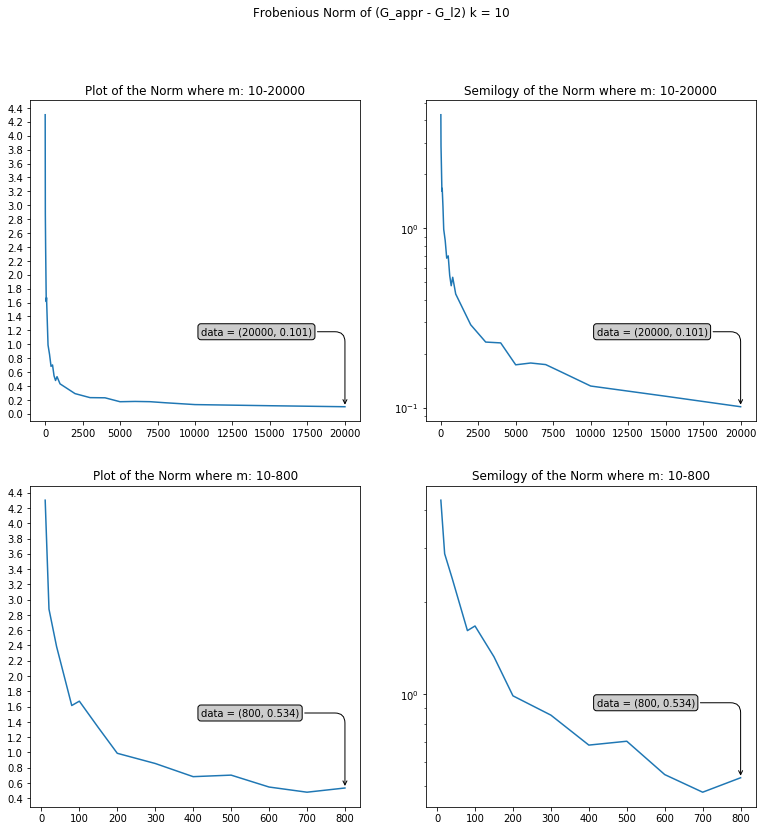

In [29]:
f, ax = plt.subplots(2,2,figsize=(13,13))
bbox = dict(boxstyle ="round", fc ="0.8")
arrowprops = dict(
    arrowstyle = "->",
    connectionstyle = "angle, angleA = 0,
    angleB = 90, rad = 10")
ax[0][0].yaxis.set_ticks(np.arange(0,4.6,0.2))
ax[0][0].plot(M, norm2);  
ax[0][0].annotate('data = (%.0f, %.3f)'%(M[-1], norm2[-1]),
            (M[-1], norm2[-1]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[0][0].title.set_text("Plot of the Norm where m: 10-20000");
ax[0][1].semilogy(M, norm2);
ax[0][1].annotate('data = (%.0f, %.3f)'%(M[-1], norm2[-1]),
            (M[-1], norm2[-1]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[0][1].title.set_text("Semilogy of the Norm where m: 10-20000");
ax[1][0].yaxis.set_ticks(np.arange(0,4.6,.2))
ax[1][0].plot(M[0:13], norm2[0:13]);
ax[1][0].annotate('data = (%.0f, %.3f)'%(M[12], norm2[12]),
            (M[12], norm2[12]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[1][0].title.set_text("Plot of the Norm where m: 10-800");
ax[1][1].semilogy(M[0:13], norm2[0:13]);
ax[1][1].annotate('data = (%.0f, %.3f)'%(M[12], norm2[12]),
            (M[12], norm2[12]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[1][1].title.set_text("Semilogy of the Norm where m: 10-800");
f.suptitle("Frobenious Norm of (G_appr - G_l2) k = 10")
savp = "/Users/leiwanzhou/Desktop/l2_mix_5para/appr_G/appr_Gl2_k10"
plt.savefig(savp, dpi=300);

# Approximate when k = 30
For matrix G_w2

In [31]:
mu30_truth, w30_truth = generate_random_para(30);
mu, w = generate_random_para(30);

In [41]:
ytruth30 = model(X, 30, mu30_truth, w30_truth);
B = Bmatrix(X, 31, w, mu, 30, A);
B = B.toarray();
q, r= linalg.qr(B.T, mode = 'economic');
gradp, gradu = U_grad(X, mu, w, 30, 31, ytruth30);
Z = np.linalg.solve(r.T, -gradp);
Y = np.matmul(q, Z);
Gw2_30 = Y.T @ Y;
norm = [];
M = [10, 50, 100, 200, 300, 400, 500, 600, 800, 1000, 2000, 4000, 6000, 8000, 10000, 15000, 20000, 25000, 30000, 40000, 50000, 60000, 70000, 80000];
for i in range(len(M)):
    n = 0;
    m = M[i];
    for i in range(20):
        n += np.linalg.norm(appr_G(Y, 31, m)-Gw2_30, ord=2);
    n /= 20;
    norm.append(n);

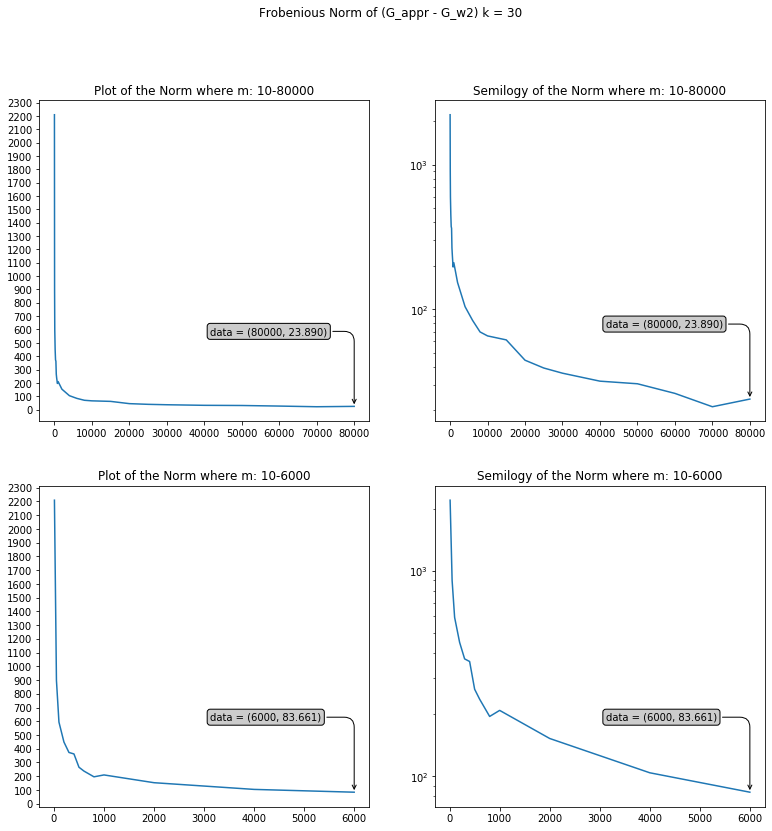

In [43]:
f, ax = plt.subplots(2,2,figsize=(13,13))
bbox = dict(boxstyle ="round", fc ="0.8")
arrowprops = dict(
    arrowstyle = "->",
    connectionstyle = "angle, angleA = 0, \
    angleB = 90, rad = 10")
ax[0][0].yaxis.set_ticks(np.arange(0,2500,100))
ax[0][0].plot(M, norm);
ax[0][0].annotate('data = (%.0f, %.3f)'%(M[-1], norm[-1]),
            (M[-1], norm[-1]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[0][0].title.set_text("Plot of the Norm where m: 10-80000");
ax[0][1].semilogy(M, norm);
ax[0][1].annotate('data = (%.0f, %.3f)'%(M[-1], norm[-1]),
            (M[-1], norm[-1]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[0][1].title.set_text("Semilogy of the Norm where m: 10-80000");
ax[1][0].yaxis.set_ticks(np.arange(0,2500,100))
ax[1][0].plot(M[0:13], norm[0:13]);
ax[1][0].annotate('data = (%.0f, %.3f)'%(M[12], norm[12]),
            (M[12], norm[12]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[1][0].title.set_text("Plot of the Norm where m: 10-6000");
ax[1][1].semilogy(M[0:13], norm[0:13]);
ax[1][1].annotate('data = (%.0f, %.3f)'%(M[12], norm[12]),
            (M[12], norm[12]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[1][1].title.set_text("Semilogy of the Norm where m: 10-6000");
f.suptitle("Frobenious Norm of (G_appr - G_w2) k = 30")
savp = "/Users/leiwanzhou/Desktop/l2_mix_5para/appr_G/appr_Gw2_k30_l2norm"
plt.savefig(savp, dpi=300);

Approximate G_l2

In [38]:
J= p_grad(X, mu, w, 30, 31);
Gl2_30 = J.T @ J;
norm2 = [];
M = [10, 20, 40, 80, 100, 150, 200, 300, 400, 500, 600, 700, 800, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 10000, 15000, 20000];
for i in range(len(M)):
    n = 0;
    m = M[i];
    for i in range(20):
        n += np.linalg.norm(appr_G(J, 31, m)-Gl2_30, ord='fro');
    n /= 20;
    norm2.append(n);

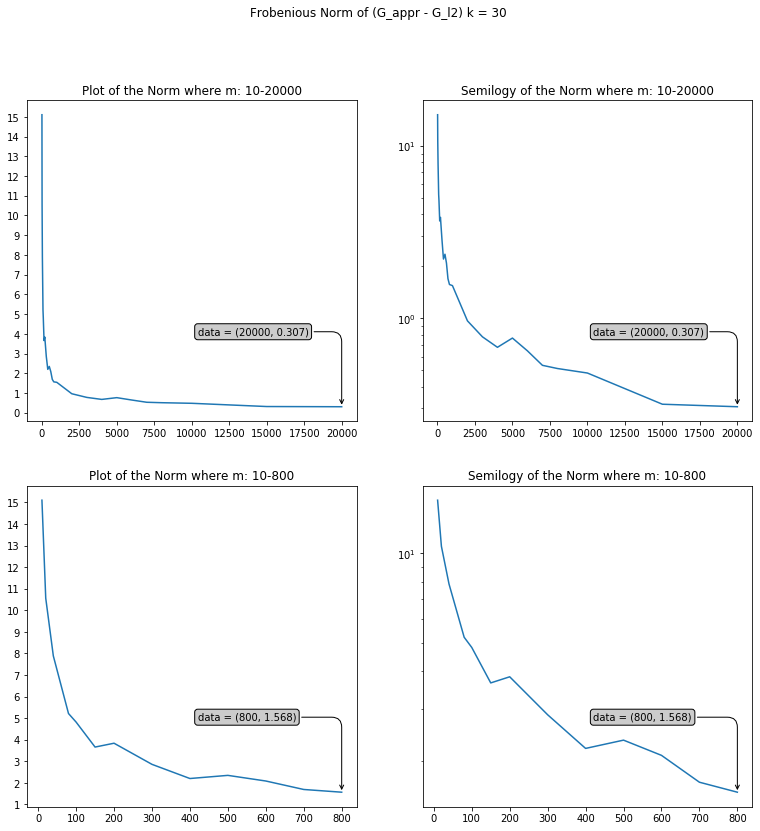

In [40]:
f, ax = plt.subplots(2,2,figsize=(13,13))
bbox = dict(boxstyle ="round", fc ="0.8")
arrowprops = dict(
    arrowstyle = "->",
    connectionstyle = "angle, angleA = 0, \
    angleB = 90, rad = 10")
ax[0][0].yaxis.set_ticks(np.arange(0,16,1))
ax[0][0].plot(M, norm2);
ax[0][0].annotate('data = (%.0f, %.3f)'%(M[-1], norm2[-1]),
            (M[-1], norm2[-1]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[0][0].title.set_text("Plot of the Norm where m: 10-20000");
ax[0][1].semilogy(M, norm2);
ax[0][1].annotate('data = (%.0f, %.3f)'%(M[-1], norm2[-1]),
            (M[-1], norm2[-1]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[0][1].title.set_text("Semilogy of the Norm where m: 10-20000");
ax[1][0].yaxis.set_ticks(np.arange(0,16,1))
ax[1][0].plot(M[0:13], norm2[0:13]);
ax[1][0].annotate('data = (%.0f, %.3f)'%(M[12], norm2[12]),
            (M[12], norm2[12]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[1][0].title.set_text("Plot of the Norm where m: 10-800");
ax[1][1].semilogy(M[0:13], norm2[0:13]);
ax[1][1].annotate('data = (%.0f, %.3f)'%(M[12], norm2[12]),
            (M[12], norm2[12]), xytext =(-2 * 72,
                                     72), 
            textcoords ='offset points',
            bbox = bbox, arrowprops = arrowprops)
ax[1][1].title.set_text("Semilogy of the Norm where m: 10-800");
f.suptitle("Frobenious Norm of (G_appr - G_l2) k = 30")
savp = "/Users/leiwanzhou/Desktop/l2_mix_5para/appr_G/appr_Gl2_k30"
plt.savefig(savp, dpi=300);

# Plot the Vector Field of the Gradient of L2 loss function

# Vector Field of std GD on mu1

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


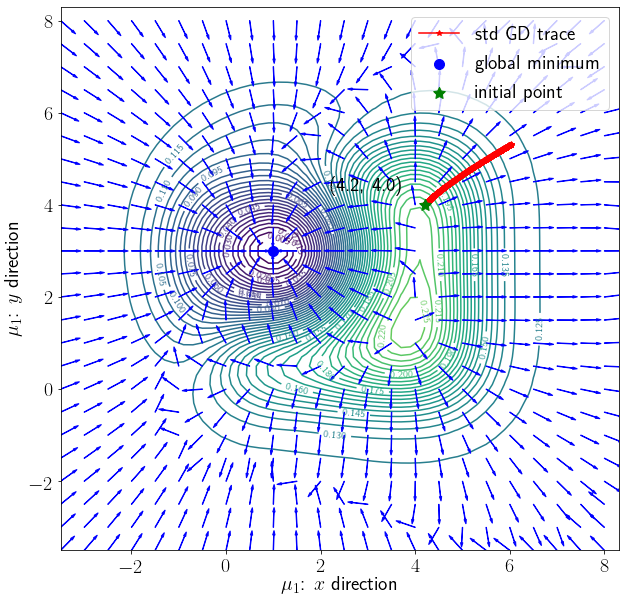

In [29]:
matlib.rcParams['text.usetex'] = True;
savpath =  "/Users/leiwanzhou/Desktop/l2_mix_4para/vector_field/mu1_stdGDflow_stdtrace4d24.eps"
xrange = [-3.5, 8.5];
yrange = [-3.5, 8.5];
x = np.arange(xrange[0],xrange[1],grid);
y = np.arange(yrange[0],yrange[1],grid);
plt.rcParams.update({'font.size': 20})
P,Q = np.meshgrid(x,y)
Z = np.zeros((x.size, y.size));
for i in range(x.size):
        for j in range(y.size):
            Z[i, j] = loss(X, 2, np.array([np.array([grid*i+xrange[0], grid*j+yrange[0]]), np.array([3, 2])]), 
                          np.array([.3]), ytruth);
fig, ax = plt.subplots(figsize=(10, 10));
level = np.arange(0, 0.3, 0.005);
CS = ax.contour(Q,P,Z,levels = level, zorder = 0);
ax.clabel(CS, inline=True, fontsize=10);
for i in np.arange(-3.5, 8.5, 0.5):
    for j in np.arange(-3.5, 8.5, 0.5):
        mu1 = np.array([i, j]);
        p, direct = gradient_mu1_all(X, np.array([.3]), mu1, np.array([3, 2]), ytruth);
        length = np.linalg.norm(direct);
        if (length<0.00000000001):
            plt.scatter(i, j, c = 'blue', label = 'global minimum', s=100);
            continue;
        direct = -direct/length;
        plt.arrow(i, j, direct[0]/3, direct[1]/3, width=0.01, fc='blue', ec='blue', head_length = 0.1, head_width = 0.05);
plt.plot(std_mu1_4d24[:, 0], std_mu1_4d24[:, 1], '*-', c='r', label = 'std GD trace', zorder = 5);
plt.scatter(std_mu1_4d24[0][0], std_mu1_4d24[0][1], s=150, c='g', marker=(5, 1), zorder = 10, label = 'initial point')
plt.text(std_mu1_4d24[0][0]-2, std_mu1_4d24[0][1]+0.3, '({}, {})'.format(std_mu1_4d24[0][0], std_mu1_4d24[0][1]));
plt.xlabel(r"$\mu_1$: $x$ direction");
plt.ylabel(r"$\mu_1$: $y$ direction");
plt.legend();
plt.savefig(savpath, dpi = 300);

## Vector Field of W2 natural GD on mu1

(-3.5, -3.5)


ValueError: dimension mismatch

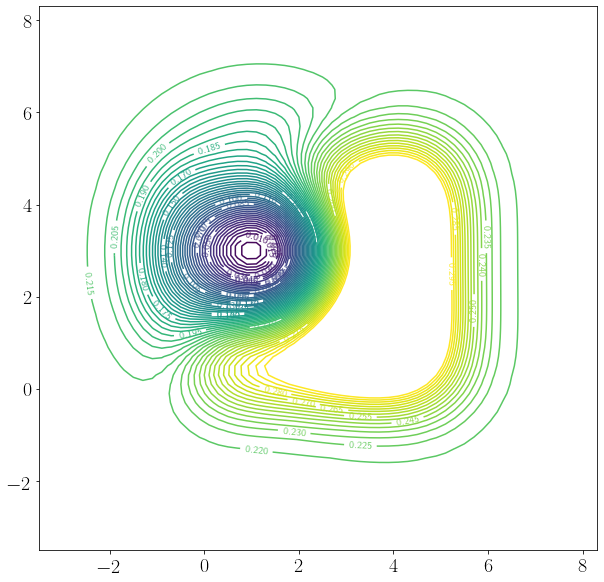

In [42]:
matlib.rcParams['text.usetex'] = True;
savpath =  "/Users/leiwanzhou/Desktop/mu1_w2GDflow_w2trace4d24_2.eps"
xrange = [-3.5, 8.5];
yrange = [-3.5, 8.5];
x = np.arange(xrange[0],xrange[1],grid);
y = np.arange(yrange[0],yrange[1],grid);
plt.rcParams.update({'font.size': 20})
P,Q = np.meshgrid(x,y)
Z = np.zeros((x.size, y.size));
for i in range(x.size):
        for j in range(y.size):
            Z[i, j] = loss(X, 2, np.array([np.array([grid*i+xrange[0], grid*j+yrange[0]]), np.array([3, 2])]), 
                          np.array([.3]), ytruth);
fig, ax = plt.subplots(figsize=(10, 10));
level = np.arange(0, 0.3, 0.005);
CS = ax.contour(Q,P,Z,levels = level, zorder = 0);
ax.clabel(CS, inline=True, fontsize=10);
for i in np.arange(-3.5, 8.5, 0.5):
    for j in np.arange(-3.5, 8.5, 0.5):
        print("({}, {})".format(i, j));
        mu1 = np.array([i, j]);
        direct = Natural_dir_mu1(X, 31, np.array([.3]), np.array([mu1, np.array([3, 2])]), ytruth, A, 2);
        length = np.linalg.norm(direct);
        if (length<0.00000000001):
            plt.scatter(i, j, c = 'blue', s=100, label='global minimum', zorder=20);
            continue;
        direct = -direct/length;
        plt.arrow(i, j, direct[0]/3, direct[1]/3, width=0.01, fc='blue', ec='blue', head_length = 0.1, head_width = 0.05);
plt.plot(nat_GD_mu1_trace[:, 0], nat_GD_mu1_trace[:, 1], '.-', c='r', label = r'$W_2$ Natural GD trace', zorder = 5);
plt.scatter(nat_GD_mu1_trace[0][0], nat_GD_mu1_trace[0][1], s=150, c='g', marker=(5, 1), zorder = 10, label = 'initial point')
plt.text(nat_GD_mu1_trace[0][0]+.2, nat_GD_mu1_trace[0][1]+0.2, '({}, {})'.format(nat_GD_mu1_trace[0][0], nat_GD_mu1_trace[0][1]));
plt.xlabel(r"$\mu_1$: $x$ direction");
plt.ylabel(r"$\mu_1$: $y$ direction");
plt.legend();
plt.savefig(savpath, dpi = 300);

# Vector Field of L2 Natural GD on mu1

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


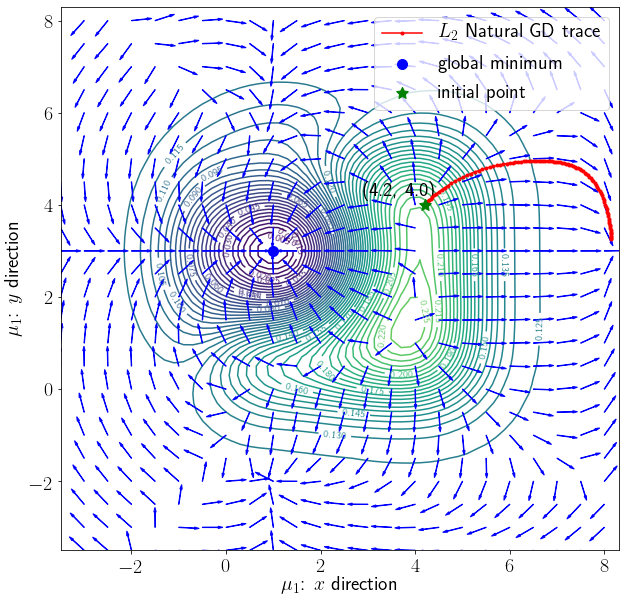

In [47]:
savpath =  "/Users/leiwanzhou/Desktop/l2_mix_4para/vector_field/mu1_l2GDflow_L2trace4d24.eps"
xrange = [-3.5, 8.5];
yrange = [-3.5, 8.5]
x = np.arange(xrange[0],xrange[1],grid);
y = np.arange(yrange[0],yrange[1],grid);
P,Q = np.meshgrid(x,y)
Z = np.zeros((x.size, y.size));
for i in range(x.size):
        for j in range(y.size):
            Z[i, j] = loss(X, 2, np.array([np.array([grid*i+xrange[0], grid*j+yrange[0]]), np.array([3, 2])]), 
                          np.array([.3]), ytruth);
fig, ax = plt.subplots(figsize=(10, 10));
level = np.arange(0, 0.3, 0.005);
CS = ax.contour(Q,P,Z,levels = level, zorder=0);
ax.clabel(CS, inline=True, fontsize=10);
for i in np.arange(-3.5, 8.5, 0.5):
    for j in np.arange(-3.5, 8.5, 0.5):
        mu1 = np.array([i, j]);
        direct = l2_Natural_dirFull_mu1(X, np.array([mu1, np.array([3, 2])]), np.array([.3]), 31, ytruth);
        length = np.linalg.norm(direct);
        if (length<0.00000000001):
            plt.scatter(i, j, c = 'blue', label = 'global minimum', zorder = 20, s=100);
            continue;
        direct = direct/length;
        plt.arrow(i, j, direct[0]/3, direct[1]/3, 
                width=0.01, fc='blue', ec='blue', 
                  head_length = 0.1, head_width = 0.05);
plt.plot(l2_GD_mu1_4d24[:, 0], l2_GD_mu1_4d24[:, 1], 
         '.-', c='r', label = r'$L_2$ Natural GD trace', 
         zorder = 5);
plt.scatter(l2_GD_mu1_4d24[0][0], 
            l2_GD_mu1_4d24[0][1], s=150, c='g', 
            marker=(5, 1), zorder = 10, label = 'initial point')
plt.text(l2_GD_mu1_4d24[0][0]-1.3, 
         l2_GD_mu1_4d24[0][1]+0.2, 
         '({}, {})'.format(nat_GD_mu1_trace[0][0], nat_GD_mu1_trace[0][1]));
plt.xlabel(r"$\mu_1$: $x$ direction");
plt.ylabel(r"$\mu_1$: $y$ direction");
plt.legend();
plt.savefig(savpath, dpi = 300);

# Vecotr Field of std GD on mu2

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


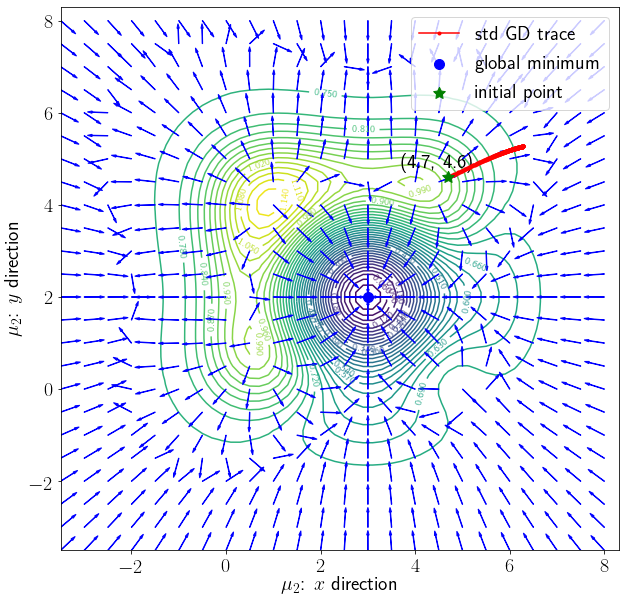

In [58]:
savpath =  "/Users/leiwanzhou/Desktop/l2_mix_4para/vector_field/mu2_stdGDflow_stdtrace4d74d6.eps"
xrange = [-3.5, 8.5];
yrange = [-3.5, 8.5]
x = np.arange(xrange[0],xrange[1],grid);
y = np.arange(yrange[0],yrange[1],grid);
P,Q = np.meshgrid(x,y)
Z = np.zeros((x.size, y.size));
for i in range(x.size):
        for j in range(y.size):
            Z[i, j] = loss(X, 2, np.array([np.array([1, 3]), np.array([grid*i+xrange[0], grid*j+yrange[0]])]), 
                          np.array([.3]), ytruth);
fig, ax = plt.subplots(figsize=(10, 10));
level = np.arange(0, 1.2, 0.03);
CS = ax.contour(Q,P,Z,levels = level, zorder=0);
ax.clabel(CS, inline=True, fontsize=10);
for i in np.arange(-3.5, 8.5, 0.5):
    for j in np.arange(-3.5, 8.5, 0.5):
        mu2 = np.array([i, j]);
        p, direct = gradient_mu2_all(X, np.array([.3]), np.array([1, 3]), mu2, ytruth);
        length = np.linalg.norm(direct);
        if (length<0.00000000001):
            plt.scatter(i, j, c = 'blue', label = 'global minimum', zorder = 20, s=100);
            continue;
        direct = -direct/length;
        plt.arrow(i, j, direct[0]/3, direct[1]/3, 
                width=0.01, fc='blue', ec='blue', 
                  head_length = 0.1, head_width = 0.05);
plt.plot(std_mu2_4d74d6[:, 0], std_mu2_4d74d6[:, 1], 
         '.-', c='r', label = 'std GD trace', 
         zorder = 5);
plt.scatter(std_mu2_4d74d6[0][0], 
            std_mu2_4d74d6[0][1], s=150, c='g', 
            marker=(5, 1), zorder = 10, label = 'initial point')
plt.text(std_mu2_4d74d6[0][0]-1, 
         std_mu2_4d74d6[0][1]+0.2, 
         '({}, {})'.format(std_mu2_4d74d6[0][0], std_mu2_4d74d6[0][1]));
plt.xlabel(r"$\mu_2$: $x$ direction");
plt.ylabel(r"$\mu_2$: $y$ direction");
plt.legend();
plt.savefig(savpath, dpi = 300);

# Vector Field of W2 Natural Flow on mu2

-3.5
-3.0
-2.5
-2.0
-1.5
-1.0
-0.5
0.0
0.5
1.0
1.5
2.0
2.5
3.0
3.5
4.0
4.5
5.0
5.5
6.0
6.5
7.0
7.5
8.0


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


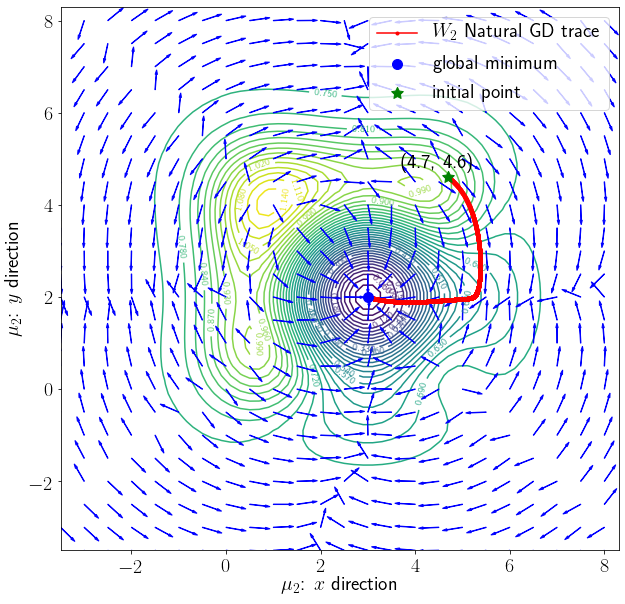

In [59]:
savpath =  "/Users/leiwanzhou/Desktop/l2_mix_4para/vector_field/mu2_w2GDflow_w2trace4d74d6.eps"
xrange = [-3.5, 8.5];
yrange = [-3.5, 8.5]
x = np.arange(xrange[0],xrange[1],grid);
y = np.arange(yrange[0],yrange[1],grid);
P,Q = np.meshgrid(x,y)
Z = np.zeros((x.size, y.size));
for i in range(x.size):
    for j in range(y.size):
        Z[i, j] = loss(X, 2, np.array([np.array([1, 3]), np.array([grid*i+xrange[0], grid*j+yrange[0]])]), 
                          np.array([.3]), ytruth);
fig, ax = plt.subplots(figsize=(10, 10));
level = np.arange(0, 1.2, 0.03);
CS = ax.contour(Q,P,Z,levels = level, zorder=0);
ax.clabel(CS, inline=True, fontsize=10);
for i in np.arange(-3.5, 8.5, 0.5):
    print(i);
    for j in np.arange(-3.5, 8.5, 0.5):
        mu2 = np.array([i, j]);
        direct = Natural_dir_mu2(X, 31, np.array([.3]), np.array([np.array([1, 3]), mu2]), ytruth, A, 2);
        length = np.linalg.norm(direct);
        if (length<0.00000000001):
            plt.scatter(i, j, c = 'blue', label = 'global minimum', zorder = 20, s=100);
            continue;
        direct = -direct/length;
        plt.arrow(i, j, direct[0]/3, direct[1]/3, 
                width=0.01, fc='blue', ec='blue', 
                  head_length = 0.1, head_width = 0.05);
plt.plot(nat_mu2_4d74d6[:, 0], nat_mu2_4d74d6[:, 1], 
         '.-', c='r', label = r'$W_2$ Natural GD trace', 
         zorder = 5);
plt.scatter(nat_mu2_4d74d6[0][0], 
            nat_mu2_4d74d6[0][1], s=150, c='g', 
            marker=(5, 1), zorder = 10, label = 'initial point')
plt.text(nat_mu2_4d74d6[0][0]-1, 
         nat_mu2_4d74d6[0][1]+0.2, 
         '({}, {})'.format(nat_mu2_4d74d6[0][0], nat_mu2_4d74d6[0][1]));
plt.xlabel(r"$\mu_2$: $x$ direction");
plt.ylabel(r"$\mu_2$: $y$ direction");
plt.legend();
plt.savefig(savpath, dpi = 300);

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


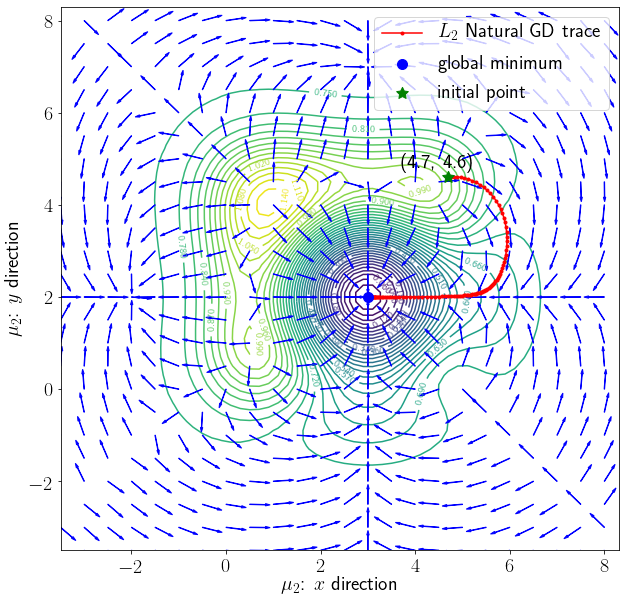

In [61]:
savpath =  "/Users/leiwanzhou/Desktop/l2_mix_4para/vector_field/mu2_l2GDflow_l2trace4d74d6.eps"
xrange = [-3.5, 8.5];
yrange = [-3.5, 8.5]
x = np.arange(xrange[0],xrange[1],grid);
y = np.arange(yrange[0],yrange[1],grid);
P,Q = np.meshgrid(x,y)
Z = np.zeros((x.size, y.size));
for i in range(x.size):
        for j in range(y.size):
            Z[i, j] = loss(X, 2, np.array([np.array([1, 3]), np.array([grid*i+xrange[0], grid*j+yrange[0]])]), 
                          np.array([.3]), ytruth);
fig, ax = plt.subplots(figsize=(10, 10));
level = np.arange(0, 1.2, 0.03);
CS = ax.contour(Q,P,Z,levels = level, zorder=0);
ax.clabel(CS, inline=True, fontsize=10);
for i in np.arange(-3.5, 8.5, 0.5):
    for j in np.arange(-3.5, 8.5, 0.5):
        mu2 = np.array([i, j]);
        direct = l2_Natural_dirFull_mu2(X, np.array([np.array([1, 3]), mu2]), np.array([.3]), 31, ytruth);
        length = np.linalg.norm(direct);
        if (length<0.00000000001):
            plt.scatter(i, j, c = 'blue', label = 'global minimum', zorder = 20, s=100);
            continue;
        direct = direct/length;
        plt.arrow(i, j, direct[0]/3, direct[1]/3, 
                width=0.01, fc='blue', ec='blue', 
                  head_length = 0.1, head_width = 0.05);
plt.plot(l2_mu2_4d74d6[:, 0], l2_mu2_4d74d6[:, 1], 
         '.-', c='r', label = r'$L_2$ Natural GD trace', 
         zorder = 5);
plt.scatter(l2_mu2_4d74d6[0][0], 
            l2_mu2_4d74d6[0][1], s=150, c='g', 
            marker=(5, 1), zorder = 10, label = 'initial point')
plt.text(l2_mu2_4d74d6[0][0]-1, 
         l2_mu2_4d74d6[0][1]+0.2, 
         '({}, {})'.format(l2_mu2_4d74d6[0][0], l2_mu2_4d74d6[0][1]));
plt.xlabel(r"$\mu_2$: $x$ direction");
plt.ylabel(r"$\mu_2$: $y$ direction");
plt.legend();
plt.savefig(savpath, dpi = 300);

#### Std GD vector field with trace initial 00

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


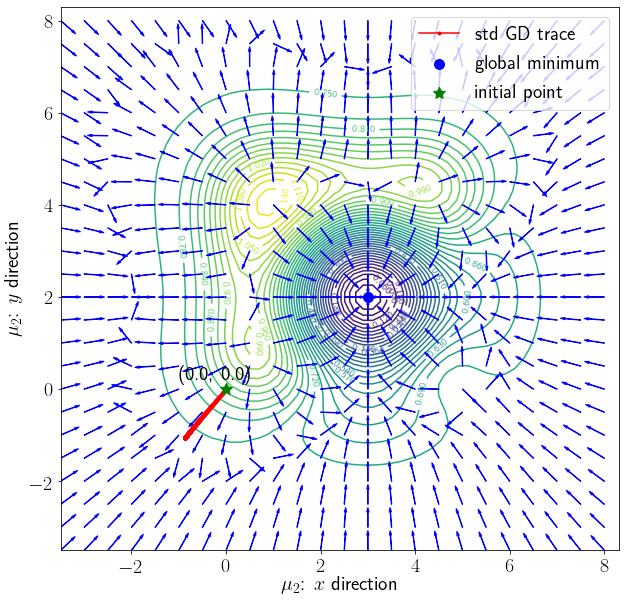

In [65]:
savpath =  "/Users/leiwanzhou/Desktop/l2_mix_4para/vector_field/mu2_stdGDflow_stdtrace00.eps"
xrange = [-3.5, 8.5];
yrange = [-3.5, 8.5]
x = np.arange(xrange[0],xrange[1],grid);
y = np.arange(yrange[0],yrange[1],grid);
P,Q = np.meshgrid(x,y)
Z = np.zeros((x.size, y.size));
for i in range(x.size):
        for j in range(y.size):
            Z[i, j] = loss(X, 2, np.array([np.array([1, 3]), np.array([grid*i+xrange[0], grid*j+yrange[0]])]), 
                          np.array([.3]), ytruth);
fig, ax = plt.subplots(figsize=(10, 10));
level = np.arange(0, 1.2, 0.03);
CS = ax.contour(Q,P,Z,levels = level, zorder=0);
ax.clabel(CS, inline=True, fontsize=10);
for i in np.arange(-3.5, 8.5, 0.5):
    for j in np.arange(-3.5, 8.5, 0.5):
        mu2 = np.array([i, j]);
        p, direct = gradient_mu2_all(X, np.array([.3]), np.array([1, 3]), mu2, ytruth);
        length = np.linalg.norm(direct);
        if (length<0.00000000001):
            plt.scatter(i, j, c = 'blue', label = 'global minimum', zorder = 20, s=100);
            continue;
        direct = -direct/length;
        plt.arrow(i, j, direct[0]/3, direct[1]/3, 
                width=0.01, fc='blue', ec='blue', 
                  head_length = 0.1, head_width = 0.05);
plt.plot(std_GD_mu2_trace2[:, 0], std_GD_mu2_trace2[:, 1], 
         '.-', c='r', label = 'std GD trace', 
         zorder = 5);
plt.scatter(std_GD_mu2_trace2[0][0], 
            std_GD_mu2_trace2[0][1], s=150, c='g', 
            marker=(5, 1), zorder = 20, label = 'initial point')
plt.text(std_GD_mu2_trace2[0][0]-1, 
         std_GD_mu2_trace2[0][1]+0.2, 
         '({}, {})'.format(std_GD_mu2_trace2[0][0], std_GD_mu2_trace2[0][1]));
plt.xlabel(r"$\mu_2$: $x$ direction");
plt.ylabel(r"$\mu_2$: $y$ direction");
plt.legend();
plt.savefig(savpath, dpi = 300);

#### W2 Natural GD vector field with Trace initial 00

-3.5
-3.0
-2.5
-2.0
-1.5
-1.0
-0.5
0.0
0.5
1.0
1.5
2.0
2.5
3.0
3.5
4.0
4.5
5.0
5.5
6.0
6.5
7.0
7.5
8.0


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


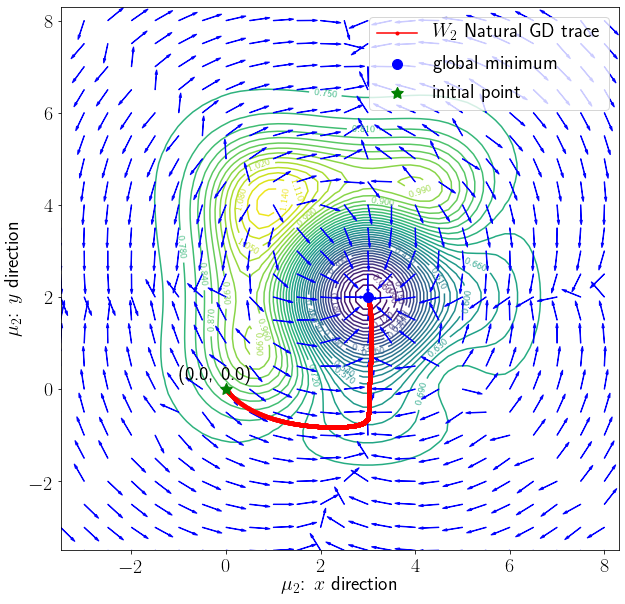

In [66]:
savpath =  "/Users/leiwanzhou/Desktop/l2_mix_4para/vector_field/mu2_w2GDflow_w2trace00.eps"
xrange = [-3.5, 8.5];
yrange = [-3.5, 8.5]
x = np.arange(xrange[0],xrange[1],grid);
y = np.arange(yrange[0],yrange[1],grid);
P,Q = np.meshgrid(x,y)
Z = np.zeros((x.size, y.size));
for i in range(x.size):
    for j in range(y.size):
        Z[i, j] = loss(X, 2, np.array([np.array([1, 3]), np.array([grid*i+xrange[0], grid*j+yrange[0]])]), 
                          np.array([.3]), ytruth);
fig, ax = plt.subplots(figsize=(10, 10));
level = np.arange(0, 1.2, 0.03);
CS = ax.contour(Q,P,Z,levels = level, zorder=0);
ax.clabel(CS, inline=True, fontsize=10);
for i in np.arange(-3.5, 8.5, 0.5):
    print(i);
    for j in np.arange(-3.5, 8.5, 0.5):
        mu2 = np.array([i, j]);
        direct = Natural_dir_mu2(X, 31, np.array([.3]), np.array([np.array([1, 3]), mu2]), ytruth, A, 2);
        length = np.linalg.norm(direct);
        if (length<0.00000000001):
            plt.scatter(i, j, c = 'blue', label = 'global minimum', zorder = 20, s=100);
            continue;
        direct = -direct/length;
        plt.arrow(i, j, direct[0]/3, direct[1]/3, 
                width=0.01, fc='blue', ec='blue', 
                  head_length = 0.1, head_width = 0.05);
plt.plot(nat_GD_mu2_trace2[:, 0], nat_GD_mu2_trace2[:, 1], 
         '.-', c='r', label = r'$W_2$ Natural GD trace', 
         zorder = 5);
plt.scatter(nat_GD_mu2_trace2[0][0], 
            nat_GD_mu2_trace2[0][1], s=150, c='g', 
            marker=(5, 1), zorder = 10, label = 'initial point')
plt.text(nat_GD_mu2_trace2[0][0]-1, 
         nat_GD_mu2_trace2[0][1]+0.2, 
         '({}, {})'.format(nat_GD_mu2_trace2[0][0], nat_GD_mu2_trace2[0][1]));
plt.xlabel(r"$\mu_2$: $x$ direction");
plt.ylabel(r"$\mu_2$: $y$ direction");
plt.legend();
plt.savefig(savpath, dpi = 300);

#### L2 Natural GD vector field with trace initial 00

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


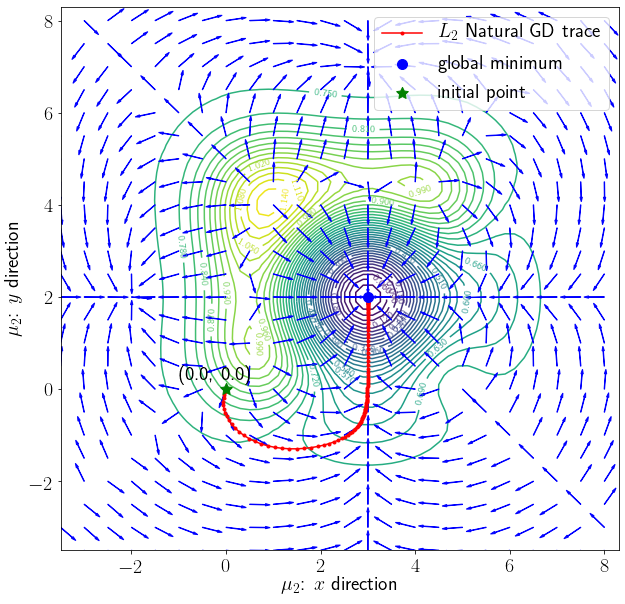

In [67]:
savpath =  "/Users/leiwanzhou/Desktop/l2_mix_4para/vector_field/mu2_l2GDflow_l2trace00.eps"
xrange = [-3.5, 8.5];
yrange = [-3.5, 8.5]
x = np.arange(xrange[0],xrange[1],grid);
y = np.arange(yrange[0],yrange[1],grid);
P,Q = np.meshgrid(x,y)
Z = np.zeros((x.size, y.size));
for i in range(x.size):
        for j in range(y.size):
            Z[i, j] = loss(X, 2, np.array([np.array([1, 3]), np.array([grid*i+xrange[0], grid*j+yrange[0]])]), 
                          np.array([.3]), ytruth);
fig, ax = plt.subplots(figsize=(10, 10));
level = np.arange(0, 1.2, 0.03);
CS = ax.contour(Q,P,Z,levels = level, zorder=0);
ax.clabel(CS, inline=True, fontsize=10);
for i in np.arange(-3.5, 8.5, 0.5):
    for j in np.arange(-3.5, 8.5, 0.5):
        mu2 = np.array([i, j]);
        direct = l2_Natural_dirFull_mu2(X, np.array([np.array([1, 3]), mu2]), np.array([.3]), 31, ytruth);
        length = np.linalg.norm(direct);
        if (length<0.00000000001):
            plt.scatter(i, j, c = 'blue', label = 'global minimum', zorder = 20, s=100);
            continue;
        direct = direct/length;
        plt.arrow(i, j, direct[0]/3, direct[1]/3, 
                width=0.01, fc='blue', ec='blue', 
                  head_length = 0.1, head_width = 0.05);
plt.plot(l2_GD_mu2_trace2[:, 0], l2_GD_mu2_trace2[:, 1], 
         '.-', c='r', label = r'$L_2$ Natural GD trace', 
         zorder = 5);
plt.scatter(l2_GD_mu2_trace2[0][0], 
            l2_GD_mu2_trace2[0][1], s=150, c='g', 
            marker=(5, 1), zorder = 10, label = 'initial point')
plt.text(l2_GD_mu2_trace2[0][0]-1, 
         l2_GD_mu2_trace2[0][1]+0.2, 
         '({}, {})'.format(l2_GD_mu2_trace2[0][0], l2_GD_mu2_trace2[0][1]));
plt.xlabel(r"$\mu_2$: $x$ direction");
plt.ylabel(r"$\mu_2$: $y$ direction");
plt.legend();
plt.savefig(savpath, dpi = 300);

## Plot the Local Convergence Step

In [97]:
initial = np.array([4.4, 4]); std_lr=4; w2_lr=100; l2_lr=.25;
w = np.array([.3]);
std_steps = [initial];
w2_steps = [initial];
l2_steps = [initial];
std_para = initial; w2_para = initial; l2_para = initial;
for i in range(4):
    _,std_direct = gradient_mu1_all(X, w, std_para, np.array([3, 2]), ytruth);
    w2_direct = Natural_dir_mu1(X, 31, w, 
                 np.array([w2_para, np.array([3, 2])]), ytruth, A, 2);
    l2_direct = l2_Natural_dirFull_mu1(X, np.array([l2_para, np.array([3, 2])]), 
                                    w, 31, ytruth);
    std_para = std_para - std_lr*std_direct;
    w2_para = w2_para - w2_lr*w2_direct;
    l2_para = l2_para + l2_lr*l2_direct;
    std_steps.append(std_para);
    w2_steps.append(w2_para);
    l2_steps.append(l2_para);  
std_steps = np.array(std_steps);
w2_steps = np.array(w2_steps);
l2_steps = np.array(l2_steps);

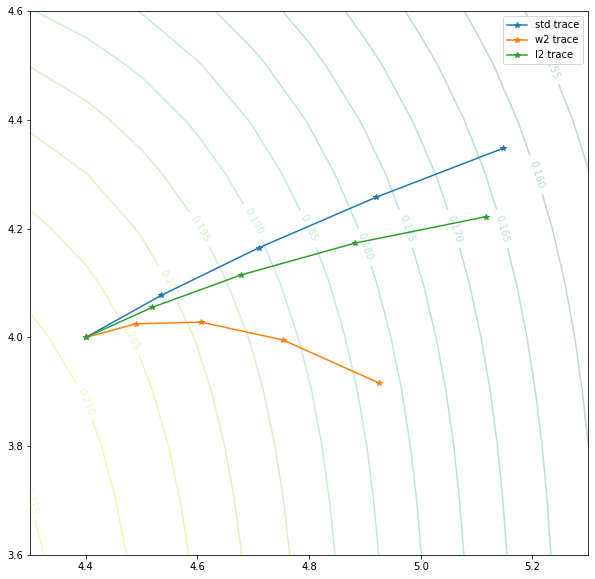

In [98]:
xrange = [4.3, 5.3];
yrange = [3.6, 4.6];
grid1 = (xrange[1]-xrange[0])/10;
grid2 = (yrange[1]-yrange[0])/10;
x = np.arange(xrange[0],xrange[1]+grid1,grid1);
y = np.arange(yrange[0],yrange[1]+grid2,grid2);
P,Q = np.meshgrid(x,y)
Z = np.zeros((x.size, y.size));
for i in range(x.size):
    for j in range(y.size):
        Z[i, j] = loss(X, 2, np.array([np.array([grid1*i+xrange[0], grid2*j+yrange[0]]), np.array([3, 2])]), 
                          np.array([.3]), ytruth);
fig, ax = plt.subplots(figsize=(10, 10));
level = np.arange(0.12, 0.22, 0.005);
CS = ax.contour(P,Q,Z.T,levels = level, alpha=.3, zorder=0);
ax.clabel(CS, inline=True, fontsize=10);
plt.plot(std_steps[:, 0], std_steps[:, 1], '*-', label = 'std trace');
plt.plot(w2_steps[:, 0], w2_steps[:, 1], '*-', label = 'w2 trace');
plt.plot(l2_steps[:, 0], l2_steps[:, 1], '*-', label = 'l2 trace');
plt.xlim(4.3, 5.3);
plt.ylim(3.6, 4.6);
plt.legend();

In [99]:
def func_std_mu1(mu1, mu1_fix, lr):
    result = loss(X, 2, np.array([mu1, np.array([3, 2])]), 
                  np.array([.3]), ytruth);
    result += ((mu1-mu1_fix)**2).sum()/(2*lr);
    return result;

def func_l2_mu1(mu1, mu1_fix, lr):
    result = loss(X, 2, np.array([mu1, np.array([3, 2])]), 
                  np.array([.3]), ytruth);
    p = model(X, 2, np.array([mu1, np.array([3, 2])]), np.array([.3]));
    pl = model(X, 2, np.array([mu1_fix, np.array([3, 2])]), np.array([.3]));
    result += ((p-pl)**2).sum()/(2*lr);
    return result;

##size: the returned square is a 2size by 2size square
##n is number of discretization on each side
def compute_contour(theta1, theta2, func, size, n, lr):
    xrange = [theta2[0]-size, theta2[0]+size];
    yrange = [theta2[1]-size, theta2[1]+size];
    grid1 = (xrange[1]-xrange[0])/n;
    grid2 = (yrange[1]-yrange[0])/n;
    x = np.arange(xrange[0],xrange[1]+grid1,grid1);
    y = np.arange(yrange[0],yrange[1]+grid2,grid2);
    P,Q = np.meshgrid(x,y)
    Z = np.zeros((x.size, y.size));
    for i in range(x.size):
        for j in range(y.size):
            Z[i, j] = func(np.array([grid1*i+xrange[0], grid2*j+yrange[0]]), theta1, lr);
    return [P, Q, Z];

In [100]:
P, Q, Z = compute_contour(std_steps[0], std_steps[1], func_std_mu1, .1, 10, 4);

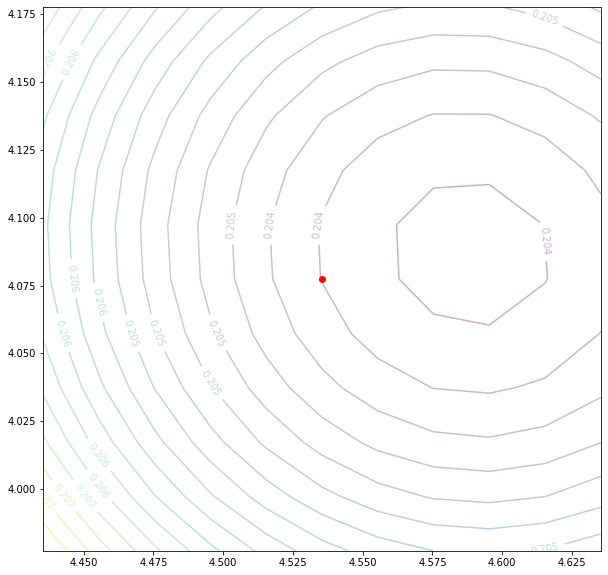

In [101]:
fig, ax = plt.subplots(figsize=(10, 10));
level = np.arange(0.204, 0.2075, 0.0002);
CS = ax.contour(P,Q,Z.T,levels = level, alpha=.3, zorder=0);
ax.scatter(std_steps[1][0], std_steps[1][1], c='r');
ax.clabel(CS, inline=True, fontsize=10);

In [57]:
## xrange and yrange must be a 11 by 11 square
## w is a number, the weight
def Vector_field_stdmu1(X, mu2_fix, w, ytruth, trace='', savpath='', xrange = [-3.5, 8.5], yrange = [-3.5, 8.5]):
    matlib.rcParams['text.usetex'] = True;
    x = np.arange(xrange[0],xrange[1],grid);
    y = np.arange(yrange[0],yrange[1],grid);
    plt.rcParams.update({'font.size': 20})
    P,Q = np.meshgrid(x,y)
    Z = np.zeros((x.size, y.size));
    for i in range(x.size):
            for j in range(y.size):
                Z[i, j] = loss(X, 2, np.array([np.array([grid*i+xrange[0], grid*j+yrange[0]]), mu2_fix]), 
                               np.array([w]), ytruth);
    fig, ax = plt.subplots(figsize=(10, 10));
    level = np.arange(Z.min(), Z.max(), (Z.max()-Z.min())/40);
    CS = ax.contour(Q,P,Z,levels = level, zorder = 0);
    ax.clabel(CS, inline=True, fontsize=10);
    for i in np.arange(xrange[0], xrange[1], 0.5):
        print(i);
        for j in np.arange(yrange[0], yrange[1], 0.5):
            mu1 = np.array([i, j]);
            p, direct = gradient_mu1_all(X, np.array([w]), mu1, mu2_fix, ytruth);
            length = np.linalg.norm(direct);
            if (length<0.00000000001):
                plt.scatter(i, j, c = 'blue', label = 'global minimum', s=100);
                continue;
            direct = -direct/length;
            plt.arrow(i, j, direct[0]/3, direct[1]/3, width=0.01, fc='blue', ec='blue', head_length = 0.1, head_width = 0.05);
    if (trace != ''):
        plt.plot(trace[:, 0], trace[:, 1], '*-', c='r', label = 'std GD trace', zorder = 5);
        plt.scatter(trace[0][0], trace[0][1], s=150, c='g', marker=(5, 1), zorder = 10, label = 'initial point')
        plt.text(trace[0][0]-2, trace[0][1]+0.3, '({}, {})'.format(trace[0][0], trace[0][1]));
    plt.xlabel(r"$\mu_1$: $x$ direction");
    plt.ylabel(r"$\mu_1$: $y$ direction");
    plt.legend();
    if (savpath != ''):
        plt.savefig(savpath, dpi = 300);

In [65]:
##N is the discretization number
def Vector_field_w2mu1(X, mu2_fix, w, ytruth, N, dx, dy, trace='', savpath='', 
                        xrange = [-3.5, 8.5], yrange = [-3.5, 8.5]):
    A = discretize(N, dx, dy);
    matlib.rcParams['text.usetex'] = True;
    x = np.arange(xrange[0],xrange[1],grid);
    y = np.arange(yrange[0],yrange[1],grid);
    plt.rcParams.update({'font.size': 20})
    P,Q = np.meshgrid(x,y)
    Z = np.zeros((x.size, y.size));
    for i in range(x.size):
            for j in range(y.size):
                Z[i, j] = loss(X, 2, np.array([np.array([grid*i+xrange[0], grid*j+yrange[0]]), mu2_fix]),
                               np.array([w]), ytruth);
    fig, ax = plt.subplots(figsize=(10, 10));
    level = np.arange(Z.min(), Z.max(), (Z.max()-Z.min())/40);
    CS = ax.contour(Q,P,Z,levels = level, zorder = 0);
    ax.clabel(CS, inline=True, fontsize=10);
    for i in np.arange(xrange[0], xrange[1], 0.5):
        print(i);
        for j in np.arange(yrange[0], yrange[1], 0.5):     
            mu1 = np.array([i, j]);
            direct = Natural_dir_mu1(X, N, np.array([w]), np.array([mu1, mu2_fix]), ytruth, A, 2);      
            length = np.linalg.norm(direct);
            if (length<0.00000000001):
                plt.scatter(i, j, c = 'blue', s=100, label='global minimum', zorder=20);
                continue;
            direct = -direct/length;
            plt.arrow(i, j, direct[0]/3, direct[1]/3, width=0.01, fc='blue', ec='blue', head_length = 0.1, head_width = 0.05);
    if (trace != ''):
        plt.plot(trace[:, 0], trace[:, 1], '.-', c='r', label = r'$W_2$ Natural GD trace', zorder = 5);
        plt.scatter(trace[0][0], trace[0][1], s=150, c='g', marker=(5, 1), zorder = 10, label = 'initial point')
        plt.text(trace[0][0]+.2, trace[0][1]+0.2, '({}, {})'.format(trace[0][0], trace[0][1]));
    plt.xlabel(r"$\mu_1$: $x$ direction");
    plt.ylabel(r"$\mu_1$: $y$ direction");
    plt.legend();
    if (savpath != ''):
        plt.savefig(savpath, dpi = 300);

In [67]:
def Vector_field_l2mu1(X, mu2_fix, w, ytruth, N, trace='', savpath='', 
                        xrange = [-3.5, 8.5], yrange = [-3.5, 8.5]):
    matlib.rcParams['text.usetex'] = True;
    plt.rcParams.update({'font.size': 20})
    x = np.arange(xrange[0],xrange[1],grid);
    y = np.arange(yrange[0],yrange[1],grid);
    P,Q = np.meshgrid(x,y)
    Z = np.zeros((x.size, y.size));
    for i in range(x.size):
            for j in range(y.size):
                Z[i, j] = loss(X, 2, np.array([np.array([grid*i+xrange[0], grid*j+yrange[0]]), mu2_fix]), 
                              np.array([w]), ytruth);
    fig, ax = plt.subplots(figsize=(10, 10));
    level = np.arange(Z.min(), Z.max(), (Z.max()-Z.min())/40);
    CS = ax.contour(Q,P,Z,levels = level, zorder=0);
    ax.clabel(CS, inline=True, fontsize=10);
    for i in np.arange(xrange[0], xrange[1], 0.5):
        for j in np.arange(yrange[0], yrange[1], 0.5):
            mu1 = np.array([i, j]);
            direct = l2_Natural_dirFull_mu1(X, np.array([mu1, mu2_fix]), np.array([w]), N, ytruth);
            length = np.linalg.norm(direct);
            if (length<0.00000000001):
                plt.scatter(i, j, c = 'blue', label = 'global minimum', zorder = 20, s=100);
                continue;
            direct = direct/length;
            plt.arrow(i, j, direct[0]/3, direct[1]/3, 
                    width=0.01, fc='blue', ec='blue', 
                      head_length = 0.1, head_width = 0.05);
    if (trace != ''):
        plt.plot(trace[:, 0], trace[:, 1], 
                 '.-', c='r', label = r'$L_2$ Natural GD trace', zorder = 5);
        plt.scatter(trace[0][0], 
                trace[0][1], s=150, c='g', marker=(5, 1), 
                    zorder = 10, label = 'initial point')
        plt.text(trace[0][0]-1.3, 
                 trace[0][1]+0.2, 
                 '({}, {})'.format(trace[0][0], trace[0][1]));
    plt.xlabel(r"$\mu_1$: $x$ direction");
    plt.ylabel(r"$\mu_1$: $y$ direction");
    plt.legend();
    if (savpath != ''):
        plt.savefig(savpath, dpi = 300);

In [73]:
## xrange and yrange must be a 11 by 11 square
## w is a number, the weight
def Vector_field_stdmu2(X, mu1_fix, w, ytruth, trace='', savpath='', xrange = [-3.5, 8.5], yrange = [-3.5, 8.5]):
    matlib.rcParams['text.usetex'] = True;
    x = np.arange(xrange[0],xrange[1],grid);
    y = np.arange(yrange[0],yrange[1],grid);
    plt.rcParams.update({'font.size': 20})
    P,Q = np.meshgrid(x,y)
    Z = np.zeros((x.size, y.size));
    for i in range(x.size):
            for j in range(y.size):
                Z[i, j] = loss(X, 2, np.array([mu1_fix, np.array([grid*i+xrange[0], grid*j+yrange[0]])]), 
                               np.array([w]), ytruth);
    fig, ax = plt.subplots(figsize=(10, 10));
    level = np.arange(Z.min(), Z.max(), (Z.max()-Z.min())/40);
    CS = ax.contour(Q,P,Z,levels = level, zorder = 0);
    ax.clabel(CS, inline=True, fontsize=10);
    for i in np.arange(xrange[0], xrange[1], 0.5):
        print(i);
        for j in np.arange(yrange[0], yrange[1], 0.5):
            mu2 = np.array([i, j]);
            p, direct = gradient_mu2_all(X, np.array([w]), mu1_fix, mu2, ytruth);
            length = np.linalg.norm(direct);
            direct = -direct/length;
            plt.arrow(i, j, direct[0]/3, direct[1]/3, width=0.01, fc='blue', ec='blue', head_length = 0.1, head_width = 0.05);
    if (trace != ''):
        plt.plot(trace[:, 0], trace[:, 1], '*-', c='r', label = 'std GD trace', zorder = 5);
        plt.scatter(trace[0][0], trace[0][1], s=150, c='g', marker=(5, 1), zorder = 10, label = 'initial point')
        plt.text(trace[0][0]-2, trace[0][1]+0.3, '({}, {})'.format(trace[0][0], trace[0][1]));
    plt.xlabel(r"$\mu_2$: $x$ direction");
    plt.ylabel(r"$\mu_2$: $y$ direction");
    plt.legend();
    if (savpath != ''):
        plt.savefig(savpath, dpi = 300);

In [75]:
##N is the discretization number
def Vector_field_w2mu2(X, mu1_fix, w, ytruth, N, dx, dy, trace='', savpath='', 
                        xrange = [-3.5, 8.5], yrange = [-3.5, 8.5]):
    A = discretize(N, dx, dy);
    matlib.rcParams['text.usetex'] = True;
    x = np.arange(xrange[0],xrange[1],grid);
    y = np.arange(yrange[0],yrange[1],grid);
    plt.rcParams.update({'font.size': 20})
    P,Q = np.meshgrid(x,y)
    Z = np.zeros((x.size, y.size));
    for i in range(x.size):
            for j in range(y.size):
                Z[i, j] = loss(X, 2, np.array([mu1_fix, np.array([grid*i+xrange[0], grid*j+yrange[0]])]),
                               np.array([w]), ytruth);
    fig, ax = plt.subplots(figsize=(10, 10));
    level = np.arange(Z.min(), Z.max(), (Z.max()-Z.min())/40);
    CS = ax.contour(Q,P,Z,levels = level, zorder = 0);
    ax.clabel(CS, inline=True, fontsize=10);
    for i in np.arange(xrange[0], xrange[1], 0.5):
        print(i);
        for j in np.arange(yrange[0], yrange[1], 0.5):     
            mu2 = np.array([i, j]);
            direct = Natural_dir_mu2(X, N, np.array([w]), np.array([mu1_fix, mu2]), ytruth, A, 2);      
            length = np.linalg.norm(direct);
            direct = -direct/length;
            plt.arrow(i, j, direct[0]/3, direct[1]/3, width=0.01, fc='blue', ec='blue', head_length = 0.1, head_width = 0.05);
    if (trace != ''):
        plt.plot(trace[:, 0], trace[:, 1], '.-', c='r', label = r'$W_2$ Natural GD trace', zorder = 5);
        plt.scatter(trace[0][0], trace[0][1], s=150, c='g', marker=(5, 1), zorder = 10, label = 'initial point')
        plt.text(trace[0][0]+.2, trace[0][1]+0.2, '({}, {})'.format(trace[0][0], trace[0][1]));
    plt.xlabel(r"$\mu_2$: $x$ direction");
    plt.ylabel(r"$\mu_2$: $y$ direction");
    plt.legend();
    if (savpath != ''):
        plt.savefig(savpath, dpi = 300);

In [76]:
def Vector_field_l2mu2(X, mu1_fix, w, ytruth, N, trace='', savpath='', 
                        xrange = [-3.5, 8.5], yrange = [-3.5, 8.5]):
    matlib.rcParams['text.usetex'] = True;
    plt.rcParams.update({'font.size': 20})
    x = np.arange(xrange[0],xrange[1],grid);
    y = np.arange(yrange[0],yrange[1],grid);
    P,Q = np.meshgrid(x,y)
    Z = np.zeros((x.size, y.size));
    for i in range(x.size):
            for j in range(y.size):
                Z[i, j] = loss(X, 2, np.array([mu1_fix, np.array([grid*i+xrange[0], grid*j+yrange[0]])]), 
                              np.array([w]), ytruth);
    fig, ax = plt.subplots(figsize=(10, 10));
    level = np.arange(Z.min(), Z.max(), (Z.max()-Z.min())/40);
    CS = ax.contour(Q,P,Z,levels = level, zorder=0);
    ax.clabel(CS, inline=True, fontsize=10);
    for i in np.arange(xrange[0], xrange[1], 0.5):
        for j in np.arange(yrange[0], yrange[1], 0.5):
            mu2 = np.array([i, j]);
            direct = l2_Natural_dirFull_mu2(X, np.array([mu1_fix, mu2]), np.array([w]), N, ytruth);
            length = np.linalg.norm(direct);
            direct = direct/length;
            plt.arrow(i, j, direct[0]/3, direct[1]/3, 
                    width=0.01, fc='blue', ec='blue', 
                      head_length = 0.1, head_width = 0.05);
    if (trace != ''):
        plt.plot(trace[:, 0], trace[:, 1], 
                 '.-', c='r', label = r'$L_2$ Natural GD trace', zorder = 5);
        plt.scatter(trace[0][0], 
                trace[0][1], s=150, c='g', marker=(5, 1), 
                    zorder = 10, label = 'initial point')
        plt.text(trace[0][0]-1.3, 
                 trace[0][1]+0.2, 
                 '({}, {})'.format(trace[0][0], trace[0][1]));
    plt.xlabel(r"$\mu_2$: $x$ direction");
    plt.ylabel(r"$\mu_2$: $y$ direction");
    plt.legend();
    if (savpath != ''):
        plt.savefig(savpath, dpi = 300);